# Pathway enrichment by DC
* using pathway gene sets downloaded in 2024-11-26_Pathway-Download.jpynb

# Set up workspace:

In [1]:
#load packages I need
import os
import tools
import scanpy as sc
import pandas as pd
import dandelion as ddl
from tqdm import tqdm
import matplotlib.pyplot as plt
import scanpy.external as sce
from matplotlib.pyplot import rc_context
import seaborn as sns

In [2]:
#show current directory 
os.getcwd()
os.chdir('/scratch/user/s4436039/scdata/Python_Integration_Sep')
os.getcwd()

'/scratch/user/s4436039/scdata/Python_Integration_Sep'

Print software versions:

In [3]:
sc.logging.print_header()

scanpy==1.10.2 anndata==0.10.8 umap==0.5.6 numpy==1.26.4 scipy==1.14.0 pandas==2.2.2 scikit-learn==1.5.0 statsmodels==0.14.2 igraph==0.11.5 pynndescent==0.5.12


In [4]:
ddl.logging.print_header()

dandelion==0.3.8 pandas==2.2.2 numpy==1.26.4 matplotlib==3.9.2 networkx==3.3 scipy==1.14.0


In [5]:
# read in data
data = sc.read_h5ad('NRclean_clustered.h5ad')

In [6]:
data

AnnData object with n_obs × n_vars = 498023 × 1268
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'keep_or_remove', 'leiden', 'celltype', 'leiden_DC', 'leiden_DC_v2', 'exclude_annots', 'leiden_M', 'Technology', 'cancer_type_broad', 'clean-leiden_0.8', 'clean-subcluster', 'clean-subcluster-v2', 'YS_sig', 'HSC_sig', 'CD5nDC2_up_vDC3', 'DC3_up_vCD5nDC2', 'CD5pDC2_up_vDC3', 'DC3_up_vCD5pDC2', 'DC3_up_vMono', 'Mono_up_vDC3', 'DC1_sig', 'DC2_sig', 'DC3_sig', 'DC_Axl_sig', 'DC2_up_DC3', 'DC3_up_DC2', 'mregDC_sig', 'cDC1_mregDC', 'cDC2_mregDC', 'NR_annotati

# Hallmark pathways: 

## Import Hallmark gene sets
* will be imported as a dictionary where each key is a sheet name, and each value is a dataframe (gene set)

In [7]:
os.chdir('/scratch/user/s4436039/scdata/Pathway-sets')
H_sets = pd.read_excel("hallmark_sets.xlsx", sheet_name=None)
os.chdir('/scratch/user/s4436039/scdata/Python_Integration_Sep')

In [8]:
# Print the sheet names
print(H_sets.keys())

dict_keys(['Sheet1', 'Sheet2', 'Sheet3', 'Sheet4', 'Sheet5', 'Sheet6', 'Sheet7', 'Sheet8', 'Sheet9', 'Sheet10', 'Sheet11', 'Sheet12', 'Sheet13', 'Sheet14', 'Sheet15', 'Sheet16', 'Sheet17', 'Sheet18', 'Sheet19', 'Sheet20', 'Sheet21', 'Sheet22', 'Sheet23', 'Sheet24', 'Sheet25', 'Sheet26', 'Sheet27', 'Sheet28', 'Sheet29', 'Sheet30', 'Sheet31', 'Sheet32', 'Sheet33', 'Sheet34', 'Sheet35', 'Sheet36', 'Sheet37', 'Sheet38', 'Sheet39', 'Sheet40', 'Sheet41', 'Sheet42', 'Sheet43', 'Sheet44', 'Sheet45', 'Sheet46', 'Sheet47', 'Sheet48', 'Sheet49', 'Sheet50'])


In [9]:
# Change keys to be gene set name (the first value in the 'gs_name' column) instead of Sheet1 etc 
H_sets2 = {df["gs_name"].iloc[0]: df for _, df in H_sets.items()}
H_sets = H_sets2

# Result
print(H_sets.keys())

dict_keys(['HALLMARK_ADIPOGENESIS', 'HALLMARK_ALLOGRAFT_REJECTION', 'HALLMARK_ANDROGEN_RESPONSE', 'HALLMARK_ANGIOGENESIS', 'HALLMARK_APICAL_JUNCTION', 'HALLMARK_APICAL_SURFACE', 'HALLMARK_APOPTOSIS', 'HALLMARK_BILE_ACID_METABOLISM', 'HALLMARK_CHOLESTEROL_HOMEOSTASIS', 'HALLMARK_COAGULATION', 'HALLMARK_COMPLEMENT', 'HALLMARK_DNA_REPAIR', 'HALLMARK_E2F_TARGETS', 'HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION', 'HALLMARK_ESTROGEN_RESPONSE_EARLY', 'HALLMARK_ESTROGEN_RESPONSE_LATE', 'HALLMARK_FATTY_ACID_METABOLISM', 'HALLMARK_G2M_CHECKPOINT', 'HALLMARK_GLYCOLYSIS', 'HALLMARK_HEDGEHOG_SIGNALING', 'HALLMARK_HEME_METABOLISM', 'HALLMARK_HYPOXIA', 'HALLMARK_IL2_STAT5_SIGNALING', 'HALLMARK_IL6_JAK_STAT3_SIGNALING', 'HALLMARK_INFLAMMATORY_RESPONSE', 'HALLMARK_INTERFERON_ALPHA_RESPONSE', 'HALLMARK_INTERFERON_GAMMA_RESPONSE', 'HALLMARK_KRAS_SIGNALING_DN', 'HALLMARK_KRAS_SIGNALING_UP', 'HALLMARK_MITOTIC_SPINDLE', 'HALLMARK_MTORC1_SIGNALING', 'HALLMARK_MYC_TARGETS_V1', 'HALLMARK_MYC_TARGETS_V2', 'HALLMAR

In [10]:
H_sets

{'HALLMARK_ADIPOGENESIS':     gs_cat  gs_subcat                gs_name gene_symbol  entrez_gene  \
 0        H        NaN  HALLMARK_ADIPOGENESIS       ABCA1           19   
 1        H        NaN  HALLMARK_ADIPOGENESIS       ABCB8        11194   
 2        H        NaN  HALLMARK_ADIPOGENESIS       ACAA2        10449   
 3        H        NaN  HALLMARK_ADIPOGENESIS       ACADL           33   
 4        H        NaN  HALLMARK_ADIPOGENESIS       ACADM           34   
 ..     ...        ...                    ...         ...          ...   
 205      H        NaN  HALLMARK_ADIPOGENESIS      UQCR11        10975   
 206      H        NaN  HALLMARK_ADIPOGENESIS      UQCRC1         7384   
 207      H        NaN  HALLMARK_ADIPOGENESIS       UQCRQ        27089   
 208      H        NaN  HALLMARK_ADIPOGENESIS       VEGFB         7423   
 209      H        NaN  HALLMARK_ADIPOGENESIS       YWHAG         7532   
 
         ensembl_gene human_gene_symbol  human_entrez_gene human_ensembl_gene  \
 0  

## Seperate data into each DC subset

In [11]:
data_P = data[data.obs["sample_type_major2"] == "primary tumour"]

data_DC1 = data_P[data_P.obs["NR_annotations_simple"] == "cDC1"]
data_DC2 = data_P[data_P.obs["NR_annotations_simple"] == "cDC2"]
data_mregDC = data_P[data_P.obs["NR_annotations_simple"] == "mregDC"]

## Score DC subsets by enrichment for each gene set (each dataframe in dictionary)

In [12]:
# Iterate through each gene set in H_sets - DC1
for set_name, gene_set_df in H_sets.items():
    # Extract the gene set from the 'gene_symbol' column of the dataframe
    gene_set = gene_set_df['gene_symbol'].tolist()
    
    # Score the cells using the gene set
    sc.tl.score_genes(data_DC1, gene_list=gene_set, score_name=f"{set_name}_score")

# Iterate through each gene set in H_sets - DC2
for set_name, gene_set_df in H_sets.items():
    # Extract the gene set from the 'gene_symbol' column of the dataframe
    gene_set = gene_set_df['gene_symbol'].tolist()
    
    # Score the cells using the gene set
    sc.tl.score_genes(data_DC2, gene_list=gene_set, score_name=f"{set_name}_score")

# Iterate through each gene set in H_sets - mregDC
for set_name, gene_set_df in H_sets.items():
    # Extract the gene set from the 'gene_symbol' column of the dataframe
    gene_set = gene_set_df['gene_symbol'].tolist()
    
    # Score the cells using the gene set
    sc.tl.score_genes(data_mregDC, gene_list=gene_set, score_name=f"{set_name}_score")

       'GPAT4', 'LEP', 'MIGA2', 'MRAP', 'MTARC2', 'ORM1', 'SLC66A3', 'SQOR'],
      dtype='object')
       'RARS1', 'TGFB1', 'WARS1'],
      dtype='object')


/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


       'FLNC', 'FYB1', 'KRT31', 'MAP3K20', 'NECTIN1', 'NECTIN2', 'NECTIN3',
       'NECTIN4', 'NRAP', 'PALS1', 'PDZD3', 'PECAM1'],
      dtype='object')
       'GC', 'HAO1', 'HSD3B1', 'NR0B2', 'NR1H4', 'SERPINA6', 'SOAT2', 'TTR'],
      dtype='object')
       'F11', 'F13B', 'F2', 'F9', 'FGA', 'FGG', 'GDA', 'GP9', 'HMGCS2',
       'HNF4A', 'HRG', 'LEFTY2', 'MBL2', 'MEP1A', 'MMP8', 'PECAM1', 'PLG',
       'PROZ', 'RGN'],
      dtype='object')
       'RBSN'],
      dtype='object')
       'POSTN', 'PRSS2', 'SCG2', 'SGCG', 'TGFB1'],
      dtype='object')
       'RETREG1', 'SEMA3B', 'SOX3'],
      dtype='object')
       'PLAAT3', 'SEMA3B', 'SERPINA5', 'SOX3', 'TH'],
      dtype='object')
       'GAD2', 'GAPDHS', 'H2AZ1', 'HAO2', 'HMGCS2', 'KMT5A', 'MIX23', 'XIST'],
      dtype='object')
       'MAP3K20', 'NSD2', 'PTTG3P', 'TENT4A', 'TGFB1'],
      dtype='object')
       'PGLS', 'RARS1'],
      dtype='object')
       'H1-0', 'H4C3', 'HBBP1', 'HBQ1', 'HBZ', 'MARCHF2', 'MARCHF8', 'PGLS',
      

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


       'FLNC', 'FYB1', 'KRT31', 'MAP3K20', 'NECTIN1', 'NECTIN2', 'NECTIN3',
       'NECTIN4', 'NRAP', 'PALS1', 'PDZD3', 'PECAM1'],
      dtype='object')
       'GC', 'HAO1', 'HSD3B1', 'NR0B2', 'NR1H4', 'SERPINA6', 'SOAT2', 'TTR'],
      dtype='object')
       'F11', 'F13B', 'F2', 'F9', 'FGA', 'FGG', 'GDA', 'GP9', 'HMGCS2',
       'HNF4A', 'HRG', 'LEFTY2', 'MBL2', 'MEP1A', 'MMP8', 'PECAM1', 'PLG',
       'PROZ', 'RGN'],
      dtype='object')
       'RBSN'],
      dtype='object')
       'POSTN', 'PRSS2', 'SCG2', 'SGCG', 'TGFB1'],
      dtype='object')
       'RETREG1', 'SEMA3B', 'SOX3'],
      dtype='object')
       'PLAAT3', 'SEMA3B', 'SERPINA5', 'SOX3', 'TH'],
      dtype='object')
       'GAD2', 'GAPDHS', 'H2AZ1', 'HAO2', 'HMGCS2', 'KMT5A', 'MIX23', 'XIST'],
      dtype='object')
       'MAP3K20', 'NSD2', 'PTTG3P', 'TENT4A', 'TGFB1'],
      dtype='object')
       'PGLS', 'RARS1'],
      dtype='object')
       'H1-0', 'H4C3', 'HBBP1', 'HBQ1', 'HBZ', 'MARCHF2', 'MARCHF8', 'PGLS',
      

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


       'FLNC', 'FYB1', 'KRT31', 'MAP3K20', 'NECTIN1', 'NECTIN2', 'NECTIN3',
       'NECTIN4', 'NRAP', 'PALS1', 'PDZD3', 'PECAM1'],
      dtype='object')
       'GC', 'HAO1', 'HSD3B1', 'NR0B2', 'NR1H4', 'SERPINA6', 'SOAT2', 'TTR'],
      dtype='object')
       'F11', 'F13B', 'F2', 'F9', 'FGA', 'FGG', 'GDA', 'GP9', 'HMGCS2',
       'HNF4A', 'HRG', 'LEFTY2', 'MBL2', 'MEP1A', 'MMP8', 'PECAM1', 'PLG',
       'PROZ', 'RGN'],
      dtype='object')
       'RBSN'],
      dtype='object')
       'POSTN', 'PRSS2', 'SCG2', 'SGCG', 'TGFB1'],
      dtype='object')
       'RETREG1', 'SEMA3B', 'SOX3'],
      dtype='object')
       'PLAAT3', 'SEMA3B', 'SERPINA5', 'SOX3', 'TH'],
      dtype='object')
       'GAD2', 'GAPDHS', 'H2AZ1', 'HAO2', 'HMGCS2', 'KMT5A', 'MIX23', 'XIST'],
      dtype='object')
       'MAP3K20', 'NSD2', 'PTTG3P', 'TENT4A', 'TGFB1'],
      dtype='object')
       'PGLS', 'RARS1'],
      dtype='object')
       'H1-0', 'H4C3', 'HBBP1', 'HBQ1', 'HBZ', 'MARCHF2', 'MARCHF8', 'PGLS',
      

### Perform ANOVA on results:

In [13]:
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [14]:
# Initialize a results dictionary to store p-values
stats_results = {}

# Iterate through each gene set
for set_name in H_sets.keys():
    # Extract the scores and corresponding cancer types
    scores = data_DC1.obs[f"{set_name}_score"]
    cancer_types = data_DC1.obs["cancer_type_broad"]

    # Perform ANOVA
    groups = [scores[cancer_types == ct] for ct in cancer_types.unique()]
    f_stat, p_value = stats.f_oneway(*groups)

    # Save the results
    stats_results[set_name] = {
        "p_value": p_value,
        "f_stat": f_stat
    }

    # Perform post-hoc test if p_value is significant
    if p_value < 0.05:
        posthoc = pairwise_tukeyhsd(endog=scores, groups=cancer_types, alpha=0.05)
        print(f"Post-hoc results for {set_name}:")
        print(posthoc)

# Convert the results to a dataframe for easier viewing
results_df = pd.DataFrame(stats_results).T
print(results_df)

Post-hoc results for HALLMARK_ADIPOGENESIS:
        Multiple Comparison of Means - Tukey HSD, FWER=0.05        
    group1         group2    meandiff p-adj   lower   upper  reject
-------------------------------------------------------------------
Acral Melanoma Breast Cancer  -0.0189 0.6538 -0.0486  0.0107  False
Acral Melanoma           CRC   0.0302 0.4213  -0.011  0.0714  False
Acral Melanoma           GAC  -0.0207 0.8767   -0.06  0.0186  False
Acral Melanoma           GBM  -0.0094 0.9987 -0.0403  0.0215  False
Acral Melanoma           HCC   -0.015  0.949 -0.0474  0.0174  False
Acral Melanoma         HGSOC  -0.0112 0.9889 -0.0405  0.0181  False
Acral Melanoma         HNSCC  -0.0068 0.9999 -0.0357  0.0221  False
Acral Melanoma      Melanoma    0.014 0.9984 -0.0314  0.0595  False
Acral Melanoma           NPC    0.008 0.9999 -0.0267  0.0427  False
Acral Melanoma         NSCLC  -0.0305  0.034 -0.0599 -0.0011   True
Acral Melanoma          PDAC  -0.0235 0.7755 -0.0638  0.0168  False
Acra

In [15]:
#repeat for DC2

# Initialize a results dictionary to store p-values
stats_results = {}

# Iterate through each gene set
for set_name in H_sets.keys():
    # Extract the scores and corresponding cancer types
    scores = data_DC2.obs[f"{set_name}_score"]
    cancer_types = data_DC2.obs["cancer_type_broad"]

    # Perform ANOVA
    groups = [scores[cancer_types == ct] for ct in cancer_types.unique()]
    f_stat, p_value = stats.f_oneway(*groups)

    # Save the results
    stats_results[set_name] = {
        "p_value": p_value,
        "f_stat": f_stat
    }

    # Perform post-hoc test if p_value is significant
    if p_value < 0.05:
        posthoc = pairwise_tukeyhsd(endog=scores, groups=cancer_types, alpha=0.05)
        print(f"Post-hoc results for {set_name}:")
        print(posthoc)

# Convert the results to a dataframe for easier viewing
results_df = pd.DataFrame(stats_results).T
print(results_df)

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scipy/integrate/_quadpack_py.py:1260: IntegrationWarning: The integral is probably divergent, or slowly convergent.


Post-hoc results for HALLMARK_ADIPOGENESIS:
        Multiple Comparison of Means - Tukey HSD, FWER=0.05        
    group1         group2    meandiff p-adj   lower   upper  reject
-------------------------------------------------------------------
Acral Melanoma Breast Cancer  -0.0336    0.0 -0.0513 -0.0159   True
Acral Melanoma           CRC  -0.0101 0.9737  -0.034  0.0138  False
Acral Melanoma           GAC  -0.0148 0.5256 -0.0362  0.0066  False
Acral Melanoma           GBM    -0.01 0.8471 -0.0284  0.0084  False
Acral Melanoma           HCC  -0.0307    0.0 -0.0496 -0.0118   True
Acral Melanoma         HGSOC   -0.017 0.0728 -0.0347  0.0007  False
Acral Melanoma         HNSCC   -0.012 0.5279 -0.0294  0.0054  False
Acral Melanoma      Melanoma   0.0072 0.9998 -0.0215  0.0359  False
Acral Melanoma           NPC   0.0183 0.2441  -0.004  0.0406  False
Acral Melanoma         NSCLC  -0.0153 0.1642 -0.0328  0.0023  False
Acral Melanoma          PDAC  -0.0138 0.4644  -0.033  0.0055  False
Acra

In [16]:
# repeat for mregDC

# Initialize a results dictionary to store p-values
stats_results = {}

# Iterate through each gene set
for set_name in H_sets.keys():
    # Extract the scores and corresponding cancer types
    scores = data_mregDC.obs[f"{set_name}_score"]
    cancer_types = data_mregDC.obs["cancer_type_broad"]

    # Perform ANOVA
    groups = [scores[cancer_types == ct] for ct in cancer_types.unique()]
    f_stat, p_value = stats.f_oneway(*groups)

    # Save the results
    stats_results[set_name] = {
        "p_value": p_value,
        "f_stat": f_stat
    }

    # Perform post-hoc test if p_value is significant
    if p_value < 0.05:
        posthoc = pairwise_tukeyhsd(endog=scores, groups=cancer_types, alpha=0.05)
        print(f"Post-hoc results for {set_name}:")
        print(posthoc)

# Convert the results to a dataframe for easier viewing
results_df = pd.DataFrame(stats_results).T
print(results_df)

Post-hoc results for HALLMARK_ADIPOGENESIS:
        Multiple Comparison of Means - Tukey HSD, FWER=0.05        
    group1         group2    meandiff p-adj   lower   upper  reject
-------------------------------------------------------------------
Acral Melanoma Breast Cancer  -0.0175 0.2757 -0.0394  0.0043  False
Acral Melanoma           CRC   0.0031    1.0 -0.0261  0.0323  False
Acral Melanoma           GAC   0.0126 0.9007 -0.0121  0.0373  False
Acral Melanoma           GBM  -0.0132 0.9272 -0.0404   0.014  False
Acral Melanoma           HCC  -0.0091 0.9985 -0.0387  0.0204  False
Acral Melanoma         HGSOC  -0.0074 0.9962 -0.0292  0.0144  False
Acral Melanoma         HNSCC  -0.0011    1.0  -0.022  0.0198  False
Acral Melanoma      Melanoma   -0.015 0.9998 -0.0756  0.0456  False
Acral Melanoma           NPC   0.0179 0.3312 -0.0052  0.0409  False
Acral Melanoma         NSCLC  -0.0142 0.6167  -0.036  0.0075  False
Acral Melanoma          PDAC  -0.0076 0.9999 -0.0392  0.0241  False
Acra

### generate a heatmap of results:

/scratch/temp/11687049/ipykernel_1845247/734714644.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


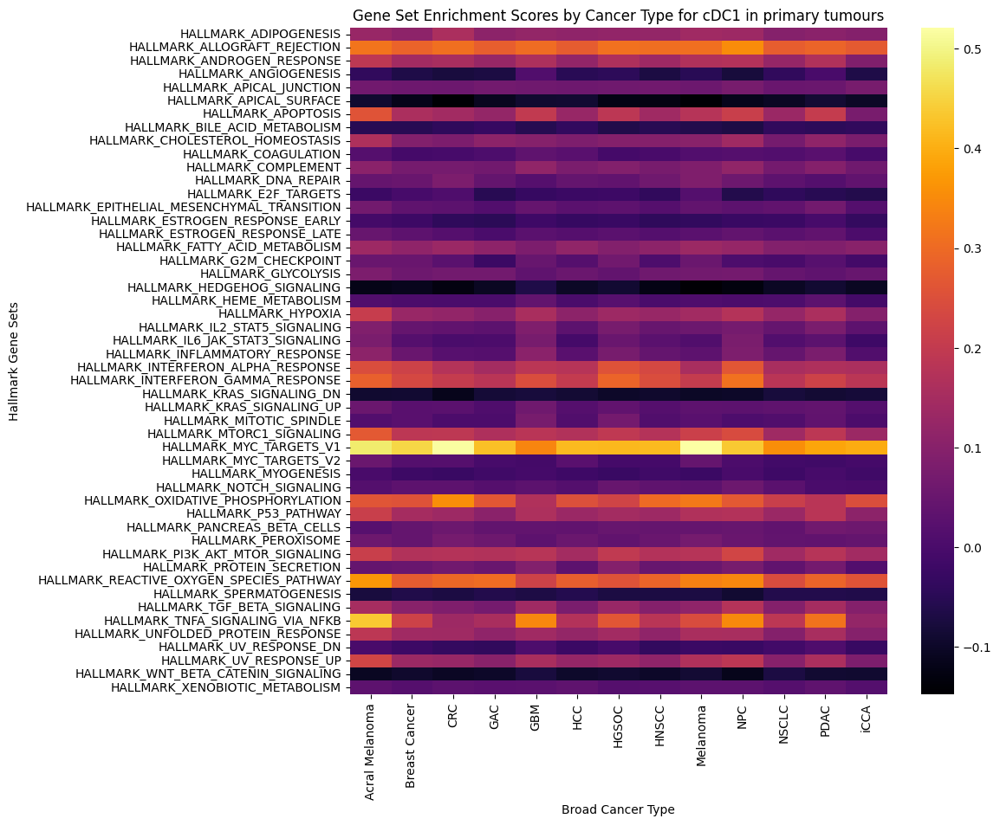

/scratch/temp/11687049/ipykernel_1845247/734714644.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


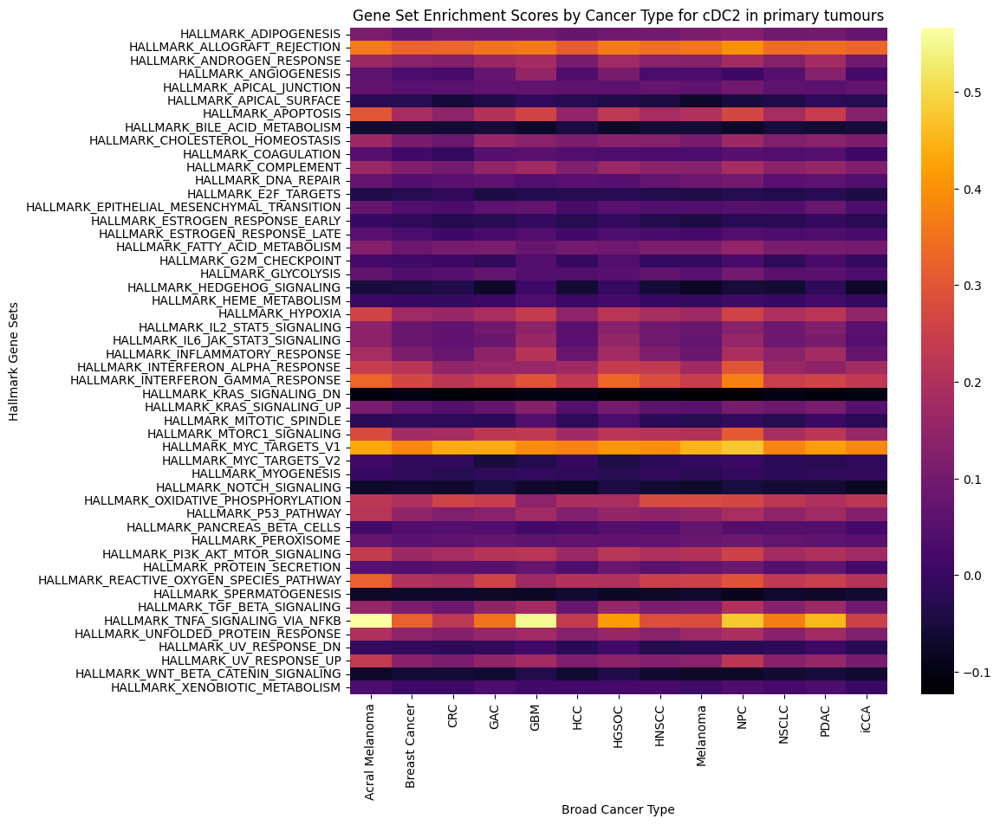

/scratch/temp/11687049/ipykernel_1845247/734714644.py:54: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


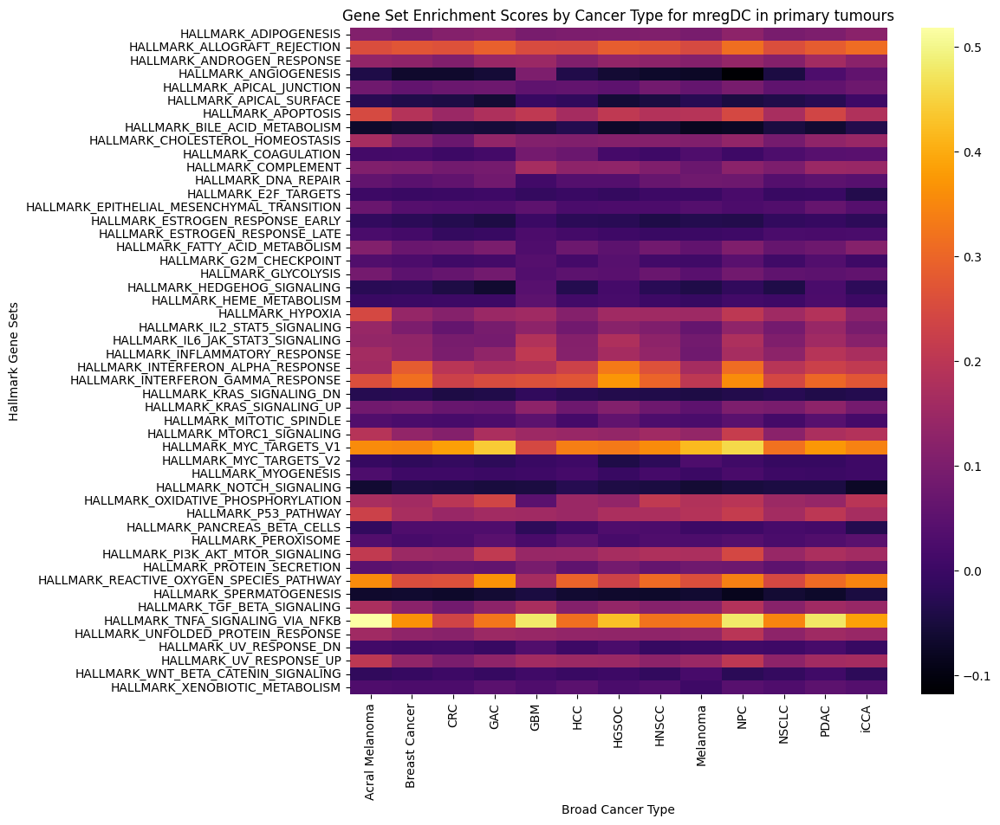

In [19]:
#DC1: 
# Extract gene set scores from `data_DC1.obs`
gene_set_scores = pd.DataFrame({
    set_name: data_DC1.obs[f"{set_name}_score"]
    for set_name in H_sets.keys()
})

# Add the cancer_type_broad metadata as a column
gene_set_scores["cancer_type_broad"] = data_DC1.obs["cancer_type_broad"].values

# Group by cancer_type_broad and compute mean scores for each group
grouped_scores = gene_set_scores.groupby("cancer_type_broad").mean().T

# Plot the heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(grouped_scores, cmap="inferno", yticklabels=True, xticklabels=True)
plt.xlabel("Broad Cancer Type")
plt.ylabel("Hallmark Gene Sets")
plt.title("Gene Set Enrichment Scores by Cancer Type for cDC1 in primary tumours")
plt.show()

#DC2:
# Extract gene set scores from `data_DC2.obs`
gene_set_scores = pd.DataFrame({
    set_name: data_DC2.obs[f"{set_name}_score"]
    for set_name in H_sets.keys()
})

# Add the cancer_type_broad metadata as a column
gene_set_scores["cancer_type_broad"] = data_DC2.obs["cancer_type_broad"].values

# Group by cancer_type_broad and compute mean scores for each group
grouped_scores = gene_set_scores.groupby("cancer_type_broad").mean().T

# Plot the heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(grouped_scores, cmap="inferno", yticklabels=True, xticklabels=True)
plt.xlabel("Broad Cancer Type")
plt.ylabel("Hallmark Gene Sets")
plt.title("Gene Set Enrichment Scores by Cancer Type for cDC2 in primary tumours")
plt.show()

#mregDC:
# Extract gene set scores from `data_DC1.obs`
gene_set_scores = pd.DataFrame({
    set_name: data_mregDC.obs[f"{set_name}_score"]
    for set_name in H_sets.keys()
})

# Add the cancer_type_broad metadata as a column
gene_set_scores["cancer_type_broad"] = data_mregDC.obs["cancer_type_broad"].values

# Group by cancer_type_broad and compute mean scores for each group
grouped_scores = gene_set_scores.groupby("cancer_type_broad").mean().T

# Plot the heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(grouped_scores, cmap="inferno", yticklabels=True, xticklabels=True)
plt.xlabel("Broad Cancer Type")
plt.ylabel("Hallmark Gene Sets")
plt.title("Gene Set Enrichment Scores by Cancer Type for mregDC in primary tumours")
plt.show()

## repeat for just OC to compare tissues:

In [21]:
data_OC = data[data.obs["cancer_with_H"] == "HGSOC"]

oc_DC1 = data_OC[data_OC.obs["NR_annotations_simple"] == "cDC1"]
oc_DC2 = data_OC[data_OC.obs["NR_annotations_simple"] == "cDC2"]
oc_mregDC = data_OC[data_OC.obs["NR_annotations_simple"] == "mregDC"]

### Score DC subsets by enrichment for each gene set (each dataframe in dictionary)

In [22]:
# Iterate through each gene set in H_sets - DC1
for set_name, gene_set_df in H_sets.items():
    # Extract the gene set from the 'gene_symbol' column of the dataframe
    gene_set = gene_set_df['gene_symbol'].tolist()
    
    # Score the cells using the gene set
    sc.tl.score_genes(oc_DC1, gene_list=gene_set, score_name=f"{set_name}_score")

# Iterate through each gene set in H_sets - DC2
for set_name, gene_set_df in H_sets.items():
    # Extract the gene set from the 'gene_symbol' column of the dataframe
    gene_set = gene_set_df['gene_symbol'].tolist()
    
    # Score the cells using the gene set
    sc.tl.score_genes(oc_DC2, gene_list=gene_set, score_name=f"{set_name}_score")

# Iterate through each gene set in H_sets - mregDC
for set_name, gene_set_df in H_sets.items():
    # Extract the gene set from the 'gene_symbol' column of the dataframe
    gene_set = gene_set_df['gene_symbol'].tolist()
    
    # Score the cells using the gene set
    sc.tl.score_genes(oc_mregDC, gene_list=gene_set, score_name=f"{set_name}_score")

       'GPAT4', 'LEP', 'MIGA2', 'MRAP', 'MTARC2', 'ORM1', 'SLC66A3', 'SQOR'],
      dtype='object')


       'RARS1', 'TGFB1', 'WARS1'],
      dtype='object')


/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


       'FLNC', 'FYB1', 'KRT31', 'MAP3K20', 'NECTIN1', 'NECTIN2', 'NECTIN3',
       'NECTIN4', 'NRAP', 'PALS1', 'PDZD3', 'PECAM1'],
      dtype='object')
       'GC', 'HAO1', 'HSD3B1', 'NR0B2', 'NR1H4', 'SERPINA6', 'SOAT2', 'TTR'],
      dtype='object')
       'F11', 'F13B', 'F2', 'F9', 'FGA', 'FGG', 'GDA', 'GP9', 'HMGCS2',
       'HNF4A', 'HRG', 'LEFTY2', 'MBL2', 'MEP1A', 'MMP8', 'PECAM1', 'PLG',
       'PROZ', 'RGN'],
      dtype='object')
       'RBSN'],
      dtype='object')
       'POSTN', 'PRSS2', 'SCG2', 'SGCG', 'TGFB1'],
      dtype='object')
       'RETREG1', 'SEMA3B', 'SOX3'],
      dtype='object')
       'PLAAT3', 'SEMA3B', 'SERPINA5', 'SOX3', 'TH'],
      dtype='object')
       'GAD2', 'GAPDHS', 'H2AZ1', 'HAO2', 'HMGCS2', 'KMT5A', 'MIX23', 'XIST'],
      dtype='object')
       'MAP3K20', 'NSD2', 'PTTG3P', 'TENT4A', 'TGFB1'],
      dtype='object')
       'PGLS', 'RARS1'],
      dtype='object')
       'H1-0', 'H4C3', 'HBBP1', 'HBQ1', 'HBZ', 'MARCHF2', 'MARCHF8', 'PGLS',
      

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


       'FLNC', 'FYB1', 'KRT31', 'MAP3K20', 'NECTIN1', 'NECTIN2', 'NECTIN3',
       'NECTIN4', 'NRAP', 'PALS1', 'PDZD3', 'PECAM1'],
      dtype='object')
       'GC', 'HAO1', 'HSD3B1', 'NR0B2', 'NR1H4', 'SERPINA6', 'SOAT2', 'TTR'],
      dtype='object')
       'F11', 'F13B', 'F2', 'F9', 'FGA', 'FGG', 'GDA', 'GP9', 'HMGCS2',
       'HNF4A', 'HRG', 'LEFTY2', 'MBL2', 'MEP1A', 'MMP8', 'PECAM1', 'PLG',
       'PROZ', 'RGN'],
      dtype='object')
       'RBSN'],
      dtype='object')
       'POSTN', 'PRSS2', 'SCG2', 'SGCG', 'TGFB1'],
      dtype='object')
       'RETREG1', 'SEMA3B', 'SOX3'],
      dtype='object')
       'PLAAT3', 'SEMA3B', 'SERPINA5', 'SOX3', 'TH'],
      dtype='object')
       'GAD2', 'GAPDHS', 'H2AZ1', 'HAO2', 'HMGCS2', 'KMT5A', 'MIX23', 'XIST'],
      dtype='object')
       'MAP3K20', 'NSD2', 'PTTG3P', 'TENT4A', 'TGFB1'],
      dtype='object')
       'PGLS', 'RARS1'],
      dtype='object')
       'H1-0', 'H4C3', 'HBBP1', 'HBQ1', 'HBZ', 'MARCHF2', 'MARCHF8', 'PGLS',
      

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


       'GC', 'HAO1', 'HSD3B1', 'NR0B2', 'NR1H4', 'SERPINA6', 'SOAT2', 'TTR'],
      dtype='object')
       'F11', 'F13B', 'F2', 'F9', 'FGA', 'FGG', 'GDA', 'GP9', 'HMGCS2',
       'HNF4A', 'HRG', 'LEFTY2', 'MBL2', 'MEP1A', 'MMP8', 'PECAM1', 'PLG',
       'PROZ', 'RGN'],
      dtype='object')
       'RBSN'],
      dtype='object')
       'POSTN', 'PRSS2', 'SCG2', 'SGCG', 'TGFB1'],
      dtype='object')
       'RETREG1', 'SEMA3B', 'SOX3'],
      dtype='object')
       'PLAAT3', 'SEMA3B', 'SERPINA5', 'SOX3', 'TH'],
      dtype='object')
       'GAD2', 'GAPDHS', 'H2AZ1', 'HAO2', 'HMGCS2', 'KMT5A', 'MIX23', 'XIST'],
      dtype='object')
       'MAP3K20', 'NSD2', 'PTTG3P', 'TENT4A', 'TGFB1'],
      dtype='object')
       'PGLS', 'RARS1'],
      dtype='object')
       'H1-0', 'H4C3', 'HBBP1', 'HBQ1', 'HBZ', 'MARCHF2', 'MARCHF8', 'PGLS',
       'RHAG', 'SLC30A10', 'SLC4A1', 'SLC66A2', 'SPTA1', 'TENT5C', 'TRIM10',
       'TSPO2', 'TYR'],
      dtype='object')
       'GAPDHS', 'IGFBP1', 'INHA', '

### generate a heatmap of results:

/scratch/temp/11687049/ipykernel_1845247/583581363.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


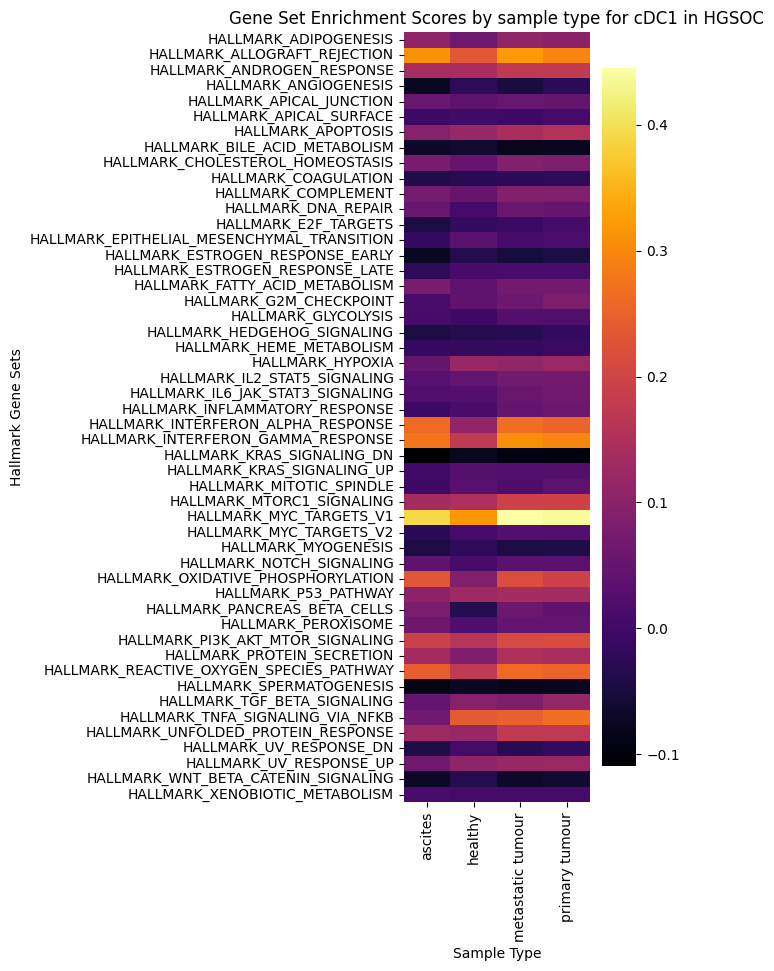

/scratch/temp/11687049/ipykernel_1845247/583581363.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


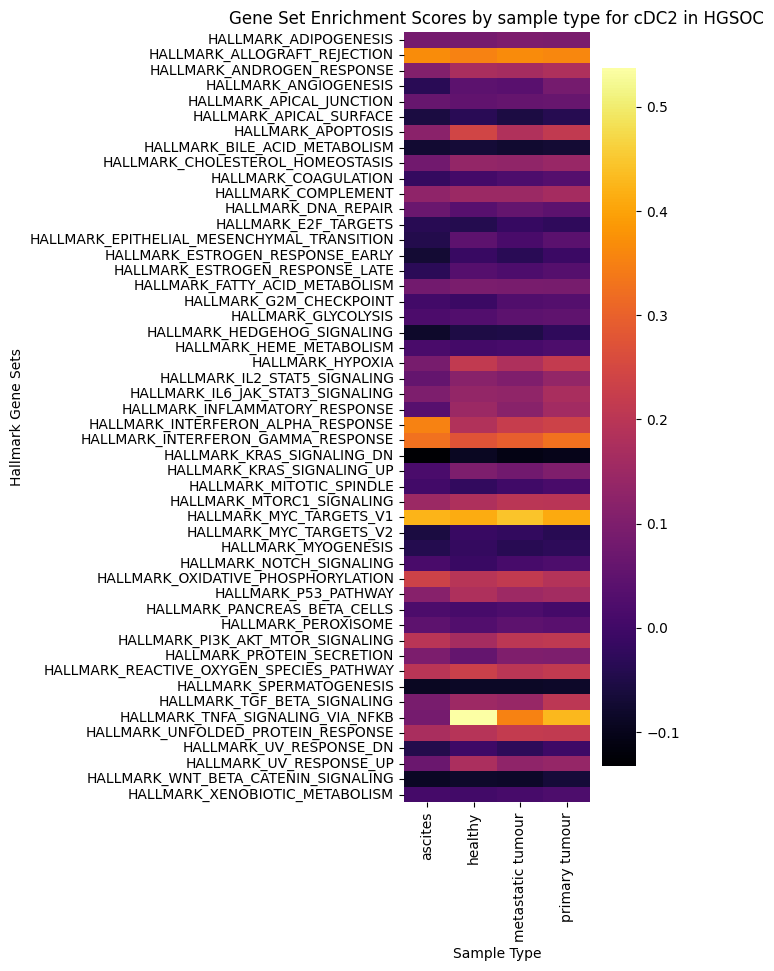

/scratch/temp/11687049/ipykernel_1845247/583581363.py:54: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


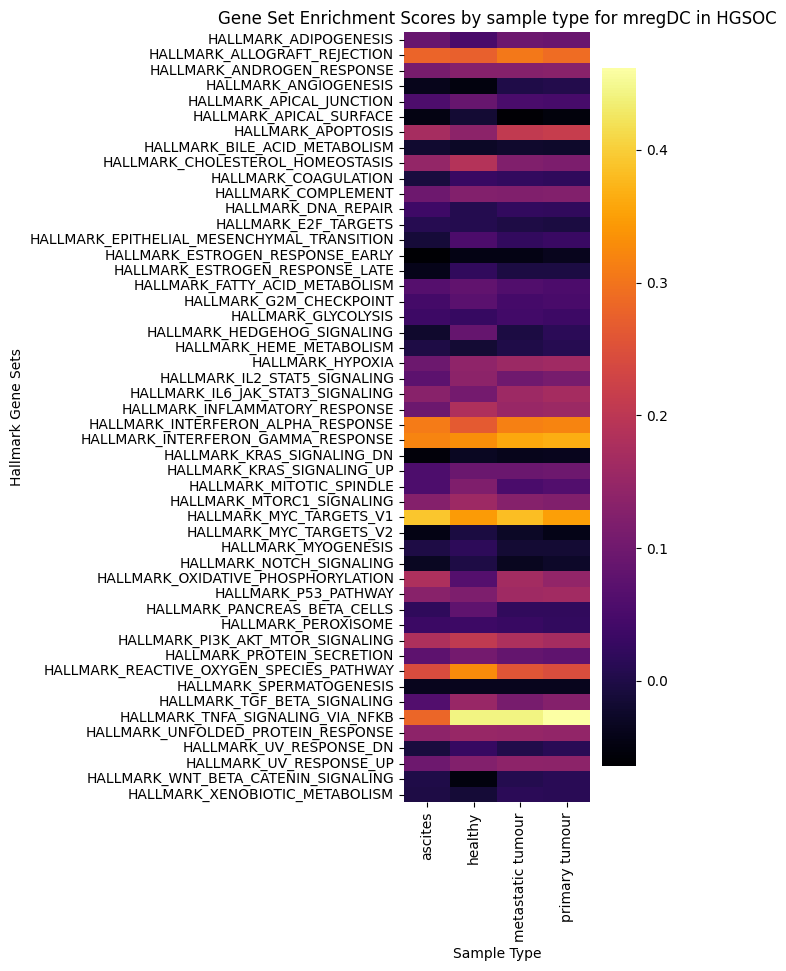

In [27]:
#DC1: 
# Extract gene set scores from `oc_DC1.obs`
gene_set_scores = pd.DataFrame({
    set_name: oc_DC1.obs[f"{set_name}_score"]
    for set_name in H_sets.keys()
})

# Add the sample_type_major2 metadata as a column
gene_set_scores["sample_type_major2"] = oc_DC1.obs["sample_type_major2"].values

# Group by sample_type_major2 and compute mean scores for each group
grouped_scores = gene_set_scores.groupby("sample_type_major2").mean().T

# Plot the heatmap
plt.figure(figsize=(3, 10))
sns.heatmap(grouped_scores, cmap="inferno", yticklabels=True, xticklabels=True)
plt.xlabel("Sample Type")
plt.ylabel("Hallmark Gene Sets")
plt.title("Gene Set Enrichment Scores by sample type for cDC1 in HGSOC")
plt.show()

#DC2:
# Extract gene set scores from `oc_DC2.obs`
gene_set_scores = pd.DataFrame({
    set_name: oc_DC2.obs[f"{set_name}_score"]
    for set_name in H_sets.keys()
})

# Add the sample_type_major2 metadata as a column
gene_set_scores["sample_type_major2"] = oc_DC2.obs["sample_type_major2"].values

# Group by sample_type_major2 and compute mean scores for each group
grouped_scores = gene_set_scores.groupby("sample_type_major2").mean().T

# Plot the heatmap
plt.figure(figsize=(3, 10))
sns.heatmap(grouped_scores, cmap="inferno", yticklabels=True, xticklabels=True)
plt.xlabel("Sample Type")
plt.ylabel("Hallmark Gene Sets")
plt.title("Gene Set Enrichment Scores by sample type for cDC2 in HGSOC")
plt.show()

#mregDC:
# Extract gene set scores from `oc_mregDC.obs`
gene_set_scores = pd.DataFrame({
    set_name: oc_mregDC.obs[f"{set_name}_score"]
    for set_name in H_sets.keys()
})

# Add the sample_type_major2 metadata as a column
gene_set_scores["sample_type_major2"] = oc_mregDC.obs["sample_type_major2"].values

# Group by sample_type_major2 and compute mean scores for each group
grouped_scores = gene_set_scores.groupby("sample_type_major2").mean().T

# Plot the heatmap
plt.figure(figsize=(3, 10))
sns.heatmap(grouped_scores, cmap="inferno", yticklabels=True, xticklabels=True)
plt.xlabel("Sample Type")
plt.ylabel("Hallmark Gene Sets")
plt.title("Gene Set Enrichment Scores by sample type for mregDC in HGSOC")
plt.show()

# Repeat for KEGG pathways

### Import kegg gene sets 
* will be imported as a dictionary where each key is a sheet name, and each value is a dataframe (gene set)

In [7]:
os.chdir('/scratch/user/s4436039/scdata/Pathway-sets')
K_sets = pd.read_excel("kegg_sets.xlsx", sheet_name=None)
os.chdir('/scratch/user/s4436039/scdata/Python_Integration_Sep')

In [8]:
# Print the sheet names
print(K_sets.keys())

dict_keys(['Sheet1', 'Sheet2', 'Sheet3', 'Sheet4', 'Sheet5', 'Sheet6', 'Sheet7', 'Sheet8', 'Sheet9', 'Sheet10', 'Sheet11', 'Sheet12', 'Sheet13', 'Sheet14', 'Sheet15', 'Sheet16', 'Sheet17', 'Sheet18', 'Sheet19', 'Sheet20', 'Sheet21', 'Sheet22', 'Sheet23', 'Sheet24', 'Sheet25', 'Sheet26', 'Sheet27', 'Sheet28', 'Sheet29', 'Sheet30', 'Sheet31', 'Sheet32', 'Sheet33', 'Sheet34', 'Sheet35', 'Sheet36', 'Sheet37', 'Sheet38', 'Sheet39', 'Sheet40', 'Sheet41', 'Sheet42', 'Sheet43', 'Sheet44', 'Sheet45', 'Sheet46', 'Sheet47', 'Sheet48', 'Sheet49', 'Sheet50', 'Sheet51', 'Sheet52', 'Sheet53', 'Sheet54', 'Sheet55', 'Sheet56', 'Sheet57', 'Sheet58', 'Sheet59', 'Sheet60', 'Sheet61', 'Sheet62', 'Sheet63', 'Sheet64', 'Sheet65', 'Sheet66', 'Sheet67', 'Sheet68', 'Sheet69', 'Sheet70', 'Sheet71', 'Sheet72', 'Sheet73', 'Sheet74', 'Sheet75', 'Sheet76', 'Sheet77', 'Sheet78', 'Sheet79', 'Sheet80', 'Sheet81', 'Sheet82', 'Sheet83', 'Sheet84', 'Sheet85', 'Sheet86', 'Sheet87', 'Sheet88', 'Sheet89', 'Sheet90', 'Sheet91

In [9]:
# Change keys to be gene set name (the first value in the 'gs_name' column) instead of Sheet1 etc 
K_sets2 = {df["gs_name"].iloc[0]: df for _, df in K_sets.items()}
K_sets = K_sets2

# Result
print(K_sets.keys())

dict_keys(['KEGG_ABC_TRANSPORTERS', 'KEGG_ACUTE_MYELOID_LEUKEMIA', 'KEGG_ADHERENS_JUNCTION', 'KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY', 'KEGG_ALANINE_ASPARTATE_AND_GLUTAMATE_METABOLISM', 'KEGG_ALDOSTERONE_REGULATED_SODIUM_REABSORPTION', 'KEGG_ALLOGRAFT_REJECTION', 'KEGG_ALPHA_LINOLENIC_ACID_METABOLISM', 'KEGG_ALZHEIMERS_DISEASE', 'KEGG_AMINO_SUGAR_AND_NUCLEOTIDE_SUGAR_METABOLISM', 'KEGG_AMINOACYL_TRNA_BIOSYNTHESIS', 'KEGG_AMYOTROPHIC_LATERAL_SCLEROSIS_ALS', 'KEGG_ANTIGEN_PROCESSING_AND_PRESENTATION', 'KEGG_APOPTOSIS', 'KEGG_ARACHIDONIC_ACID_METABOLISM', 'KEGG_ARGININE_AND_PROLINE_METABOLISM', 'KEGG_ARRHYTHMOGENIC_RIGHT_VENTRICULAR_CARDIOMYOPATHY_ARVC', 'KEGG_ASCORBATE_AND_ALDARATE_METABOLISM', 'KEGG_ASTHMA', 'KEGG_AUTOIMMUNE_THYROID_DISEASE', 'KEGG_AXON_GUIDANCE', 'KEGG_B_CELL_RECEPTOR_SIGNALING_PATHWAY', 'KEGG_BASAL_CELL_CARCINOMA', 'KEGG_BASAL_TRANSCRIPTION_FACTORS', 'KEGG_BASE_EXCISION_REPAIR', 'KEGG_BETA_ALANINE_METABOLISM', 'KEGG_BIOSYNTHESIS_OF_UNSATURATED_FATTY_ACIDS', 'KEGG_BLADDE

In [10]:
K_sets

{'KEGG_ABC_TRANSPORTERS':    gs_cat gs_subcat                gs_name gene_symbol  entrez_gene  \
 0      C2   CP:KEGG  KEGG_ABC_TRANSPORTERS       ABCA1           19   
 1      C2   CP:KEGG  KEGG_ABC_TRANSPORTERS      ABCA10        10349   
 2      C2   CP:KEGG  KEGG_ABC_TRANSPORTERS      ABCA12        26154   
 3      C2   CP:KEGG  KEGG_ABC_TRANSPORTERS      ABCA13       154664   
 4      C2   CP:KEGG  KEGG_ABC_TRANSPORTERS       ABCA2           20   
 ..    ...       ...                    ...         ...          ...   
 56     C2   CP:KEGG  KEGG_ABC_TRANSPORTERS        TAP2         6891   
 57     C2   CP:KEGG  KEGG_ABC_TRANSPORTERS        TAP2         6891   
 58     C2   CP:KEGG  KEGG_ABC_TRANSPORTERS        TAP2         6891   
 59     C2   CP:KEGG  KEGG_ABC_TRANSPORTERS        TAP2         6891   
 60     C2   CP:KEGG  KEGG_ABC_TRANSPORTERS        TAP2         6891   
 
        ensembl_gene human_gene_symbol  human_entrez_gene human_ensembl_gene  \
 0   ENSG00000165029         

### Remove unwanted sets so only select sets remain

In [11]:
# Keys to include in new dictionary
keys_include = ["KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY",
"KEGG_ANTIGEN_PROCESSING_AND_PRESENTATION",
"KEGG_APOPTOSIS",
"KEGG_CALCIUM_SIGNALING_PATHWAY",
"KEGG_CELL_ADHESION_MOLECULES_CAMS",
"KEGG_CHEMOKINE_SIGNALING_PATHWAY",
"KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION",
"KEGG_CYTOSOLIC_DNA_SENSING_PATHWAY",
"KEGG_ENDOCYTOSIS",
"KEGG_FATTY_ACID_METABOLISM",
"KEGG_FC_GAMMA_R_MEDIATED_PHAGOCYTOSIS",
"KEGG_GLYCOLYSIS_GLUCONEOGENESIS",
"KEGG_JAK_STAT_SIGNALING_PATHWAY",
"KEGG_MAPK_SIGNALING_PATHWAY",
"KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY",
"KEGG_NOTCH_SIGNALING_PATHWAY",
"KEGG_OXIDATIVE_PHOSPHORYLATION",
"KEGG_PROTEASOME",
"KEGG_PROTEIN_EXPORT",
"KEGG_TGF_BETA_SIGNALING_PATHWAY",
"KEGG_TOLL_LIKE_RECEPTOR_SIGNALING_PATHWAY",
"KEGG_TYROSINE_METABOLISM",
"KEGG_UBIQUITIN_MEDIATED_PROTEOLYSIS",
"KEGG_VEGF_SIGNALING_PATHWAY"]

In [12]:
# create a new dictionary with select keys (pathway sets)
K_sets_sub = {key: K_sets[key] for key in keys_include if key in K_sets}

# Display the new dictionary
K_sets_sub

{'KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY':    gs_cat gs_subcat                               gs_name gene_symbol  \
 0      C2   CP:KEGG  KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY       ACACB   
 1      C2   CP:KEGG  KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY       ACSL1   
 2      C2   CP:KEGG  KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY       ACSL3   
 3      C2   CP:KEGG  KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY       ACSL4   
 4      C2   CP:KEGG  KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY       ACSL5   
 ..    ...       ...                                   ...         ...   
 80     C2   CP:KEGG  KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY         TNF   
 81     C2   CP:KEGG  KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY    TNFRSF1A   
 82     C2   CP:KEGG  KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY    TNFRSF1B   
 83     C2   CP:KEGG  KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY       TRADD   
 84     C2   CP:KEGG  KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY       TRAF2   
 
     entrez_gene     ensembl_gene human_gene_symbol  human_entrez_gene

## Seperate data into each DC subset

In [13]:
data_P = data[data.obs["sample_type_major2"] == "primary tumour"]

data_DC1 = data_P[data_P.obs["NR_annotations_simple"] == "cDC1"]
data_DC2 = data_P[data_P.obs["NR_annotations_simple"] == "cDC2"]
data_mregDC = data_P[data_P.obs["NR_annotations_simple"] == "mregDC"]

## Score DC subsets by enrichment for each gene set (each dataframe in dictionary)

In [24]:
# Iterate through each gene set in K_sets_sub - DC1
for set_name, gene_set_df in K_sets_sub.items():
    # Extract the gene set from the 'gene_symbol' column of the dataframe
    gene_set = gene_set_df['gene_symbol'].tolist()
    
    # Score the cells using the gene set
    sc.tl.score_genes(data_DC1, gene_list=gene_set, score_name=f"{set_name}_score")

# Iterate through each gene set in K_sets_sub - DC2
for set_name, gene_set_df in K_sets_sub.items():
    # Extract the gene set from the 'gene_symbol' column of the dataframe
    gene_set = gene_set_df['gene_symbol'].tolist()
    
    # Score the cells using the gene set
    sc.tl.score_genes(data_DC2, gene_list=gene_set, score_name=f"{set_name}_score")

# Iterate through each gene set in K_sets_sub - mregDC
for set_name, gene_set_df in K_sets_sub.items():
    # Extract the gene set from the 'gene_symbol' column of the dataframe
    gene_set = gene_set_df['gene_symbol'].tolist()
    
    # Score the cells using the gene set
    sc.tl.score_genes(data_mregDC, gene_list=gene_set, score_name=f"{set_name}_score")

       'PRKAG3'],
      dtype='object')
       'IFNA17', 'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7',
       'IFNA8', 'KIR2DL2', 'KIR2DL5A', 'KIR2DS1', 'KIR2DS3', 'KIR2DS4',
       'KIR2DS5'],
      dtype='object')


/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


       'AVPR1B', 'BDKRB1', 'CACNA1B', 'CACNA1E', 'CACNA1S', 'CAMK2A', 'CCKAR',
       'CCKBR', 'CHP2', 'CHRM1', 'CHRM2', 'CHRM5', 'DRD1', 'DRD5', 'GRM1',
       'GRM5', 'GRPR', 'HTR2A', 'HTR2C', 'HTR4', 'HTR5A', 'HTR6', 'LHCGR',
       'MYLK3', 'P2RX3', 'PLCZ1', 'PLN', 'PPP3R2', 'PRKACG', 'PTGFR',
       'SLC25A31', 'TACR3', 'TRHR', 'VDAC2P5'],
      dtype='object')
       'CLDN8', 'HLA-DRB3', 'HLA-DRB4', 'NECTIN1', 'NECTIN2', 'NECTIN3',
       'PECAM1'],
      dtype='object')
       'CCL3L3', 'CXCL8', 'GNG13', 'GRK1', 'GRK2', 'GRK3', 'PPBPP1', 'PRKACG'],
      dtype='object')
       'EPO', 'GH2', 'IFNA1', 'IFNA10', 'IFNA13', 'IFNA14', 'IFNA16', 'IFNA17',
       'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7', 'IFNA8', 'IFNK',
       'IFNL2', 'IFNL3', 'IFNW1', 'IL17B', 'IL25', 'IL3', 'IL4', 'IL5', 'IL9',
       'INHBC', 'LEP', 'PPBPP1', 'PRL', 'TGFB1', 'TNFRSF6B', 'VEGFD'],
      dtype='object')
       'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7', 'IFNA8', 'STING1'],
      dtype=

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


       'AVPR1B', 'BDKRB1', 'CACNA1B', 'CACNA1E', 'CACNA1S', 'CAMK2A', 'CCKAR',
       'CCKBR', 'CHP2', 'CHRM1', 'CHRM2', 'CHRM5', 'DRD1', 'DRD5', 'GRM1',
       'GRM5', 'GRPR', 'HTR2A', 'HTR2C', 'HTR4', 'HTR5A', 'HTR6', 'LHCGR',
       'MYLK3', 'P2RX3', 'PLCZ1', 'PLN', 'PPP3R2', 'PRKACG', 'PTGFR',
       'SLC25A31', 'TACR3', 'TRHR', 'VDAC2P5'],
      dtype='object')
       'CLDN8', 'HLA-DRB3', 'HLA-DRB4', 'NECTIN1', 'NECTIN2', 'NECTIN3',
       'PECAM1'],
      dtype='object')
       'CCL3L3', 'CXCL8', 'GNG13', 'GRK1', 'GRK2', 'GRK3', 'PPBPP1', 'PRKACG'],
      dtype='object')
       'EPO', 'GH2', 'IFNA1', 'IFNA10', 'IFNA13', 'IFNA14', 'IFNA16', 'IFNA17',
       'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7', 'IFNA8', 'IFNK',
       'IFNL2', 'IFNL3', 'IFNW1', 'IL17B', 'IL25', 'IL3', 'IL4', 'IL5', 'IL9',
       'INHBC', 'LEP', 'PPBPP1', 'PRL', 'TGFB1', 'TNFRSF6B', 'VEGFD'],
      dtype='object')
       'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7', 'IFNA8', 'STING1'],
      dtype=

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


       'CLDN8', 'HLA-DRB3', 'HLA-DRB4', 'NECTIN1', 'NECTIN2', 'NECTIN3',
       'PECAM1'],
      dtype='object')
       'CCL3L3', 'CXCL8', 'GNG13', 'GRK1', 'GRK2', 'GRK3', 'PPBPP1', 'PRKACG'],
      dtype='object')
       'EPO', 'GH2', 'IFNA1', 'IFNA10', 'IFNA13', 'IFNA14', 'IFNA16', 'IFNA17',
       'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7', 'IFNA8', 'IFNK',
       'IFNL2', 'IFNL3', 'IFNW1', 'IL17B', 'IL25', 'IL3', 'IL4', 'IL5', 'IL9',
       'INHBC', 'LEP', 'PPBPP1', 'PRL', 'TGFB1', 'TNFRSF6B', 'VEGFD'],
      dtype='object')
       'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7', 'IFNA8', 'STING1'],
      dtype='object')
       'G6PC2', 'LDHAL6B', 'PCK1', 'PDHA2', 'PGAM4', 'PGK2', 'PKLR'],
      dtype='object')
       'IFNA17', 'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7',
       'IFNA8', 'IFNK', 'IFNL2', 'IFNL3', 'IFNW1', 'IL3', 'IL4', 'IL5', 'IL9',
       'LEP', 'PRL'],
      dtype='object')
       'CACNG6', 'CACNG7', 'CHP2', 'FGF10', 'FGF16', 'FGF20', 'FGF21', '

### Perform ANOVA

In [25]:
# cDC1:

# Initialize a results dictionary to store p-values
stats_results = {}

# Iterate through each gene set
for set_name in K_sets_sub.keys():
    # Extract the scores and corresponding cancer types
    scores = data_DC1.obs[f"{set_name}_score"]
    cancer_types = data_DC1.obs["cancer_type_broad"]

    # Perform ANOVA
    groups = [scores[cancer_types == ct] for ct in cancer_types.unique()]
    f_stat, p_value = stats.f_oneway(*groups)

    # Save the results
    stats_results[set_name] = {
        "p_value": p_value,
        "f_stat": f_stat
    }

    # Perform post-hoc test if p_value is significant
    if p_value < 0.05:
        posthoc = pairwise_tukeyhsd(endog=scores, groups=cancer_types, alpha=0.05)
        print(f"Post-hoc results for {set_name}:")
        print(posthoc)

# Convert the results to a dataframe for easier viewing
results_df = pd.DataFrame(stats_results).T
print(results_df)

Post-hoc results for KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY:
        Multiple Comparison of Means - Tukey HSD, FWER=0.05        
    group1         group2    meandiff p-adj   lower   upper  reject
-------------------------------------------------------------------
Acral Melanoma Breast Cancer  -0.0606    0.0   -0.09 -0.0312   True
Acral Melanoma           CRC  -0.0758    0.0 -0.1166  -0.035   True
Acral Melanoma           GAC  -0.0626    0.0 -0.1016 -0.0236   True
Acral Melanoma           GBM  -0.0329 0.0224 -0.0635 -0.0023   True
Acral Melanoma           HCC   -0.068    0.0 -0.1001 -0.0359   True
Acral Melanoma         HGSOC  -0.0524    0.0 -0.0815 -0.0234   True
Acral Melanoma         HNSCC  -0.0565    0.0 -0.0852 -0.0279   True
Acral Melanoma      Melanoma  -0.0395 0.1555 -0.0846  0.0055  False
Acral Melanoma           NPC  -0.0443 0.0014 -0.0786 -0.0099   True
Acral Melanoma         NSCLC   -0.062    0.0 -0.0912 -0.0329   True
Acral Melanoma          PDAC  -0.0696    0.0 -0.1096 -0.0

In [26]:
# cDC2:

# Initialize a results dictionary to store p-values
stats_results = {}

# Iterate through each gene set
for set_name in K_sets_sub.keys():
    # Extract the scores and corresponding cancer types
    scores = data_DC2.obs[f"{set_name}_score"]
    cancer_types = data_DC2.obs["cancer_type_broad"]

    # Perform ANOVA
    groups = [scores[cancer_types == ct] for ct in cancer_types.unique()]
    f_stat, p_value = stats.f_oneway(*groups)

    # Save the results
    stats_results[set_name] = {
        "p_value": p_value,
        "f_stat": f_stat
    }

    # Perform post-hoc test if p_value is significant
    if p_value < 0.05:
        posthoc = pairwise_tukeyhsd(endog=scores, groups=cancer_types, alpha=0.05)
        print(f"Post-hoc results for {set_name}:")
        print(posthoc)

# Convert the results to a dataframe for easier viewing
results_df = pd.DataFrame(stats_results).T
print(results_df)

Post-hoc results for KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY:
        Multiple Comparison of Means - Tukey HSD, FWER=0.05        
    group1         group2    meandiff p-adj   lower   upper  reject
-------------------------------------------------------------------
Acral Melanoma Breast Cancer  -0.0513    0.0 -0.0728 -0.0298   True
Acral Melanoma           CRC  -0.0561    0.0 -0.0851 -0.0271   True
Acral Melanoma           GAC  -0.0405    0.0 -0.0665 -0.0145   True
Acral Melanoma           GBM   0.0098 0.9641 -0.0125  0.0321  False
Acral Melanoma           HCC  -0.0613    0.0 -0.0842 -0.0384   True
Acral Melanoma         HGSOC  -0.0179 0.2194 -0.0394  0.0036  False
Acral Melanoma         HNSCC  -0.0494    0.0 -0.0705 -0.0282   True
Acral Melanoma      Melanoma  -0.0643    0.0 -0.0991 -0.0294   True
Acral Melanoma           NPC   -0.032 0.0061 -0.0591 -0.0049   True
Acral Melanoma         NSCLC   -0.038    0.0 -0.0592 -0.0167   True
Acral Melanoma          PDAC  -0.0186 0.2897  -0.042  0.0

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scipy/integrate/_quadpack_py.py:1260: IntegrationWarning: The integral is probably divergent, or slowly convergent.


Post-hoc results for KEGG_CHEMOKINE_SIGNALING_PATHWAY:
        Multiple Comparison of Means - Tukey HSD, FWER=0.05        
    group1         group2    meandiff p-adj   lower   upper  reject
-------------------------------------------------------------------
Acral Melanoma Breast Cancer  -0.0318    0.0 -0.0485  -0.015   True
Acral Melanoma           CRC  -0.0439    0.0 -0.0664 -0.0214   True
Acral Melanoma           GAC  -0.0272 0.0006 -0.0474 -0.0071   True
Acral Melanoma           GBM   0.0204 0.0063  0.0031  0.0377   True
Acral Melanoma           HCC   -0.044    0.0 -0.0618 -0.0262   True
Acral Melanoma         HGSOC   0.0099 0.7486 -0.0067  0.0266  False
Acral Melanoma         HNSCC    -0.03    0.0 -0.0464 -0.0136   True
Acral Melanoma      Melanoma  -0.0332 0.0032 -0.0603 -0.0062   True
Acral Melanoma           NPC   0.0069 0.9971 -0.0141   0.028  False
Acral Melanoma         NSCLC   -0.024 0.0001 -0.0405 -0.0075   True
Acral Melanoma          PDAC  -0.0137 0.3747 -0.0318  0.0045 

In [27]:
# mregDC:

# Initialize a results dictionary to store p-values
stats_results = {}

# Iterate through each gene set
for set_name in K_sets_sub.keys():
    # Extract the scores and corresponding cancer types
    scores = data_mregDC.obs[f"{set_name}_score"]
    cancer_types = data_mregDC.obs["cancer_type_broad"]

    # Perform ANOVA
    groups = [scores[cancer_types == ct] for ct in cancer_types.unique()]
    f_stat, p_value = stats.f_oneway(*groups)

    # Save the results
    stats_results[set_name] = {
        "p_value": p_value,
        "f_stat": f_stat
    }

    # Perform post-hoc test if p_value is significant
    if p_value < 0.05:
        posthoc = pairwise_tukeyhsd(endog=scores, groups=cancer_types, alpha=0.05)
        print(f"Post-hoc results for {set_name}:")
        print(posthoc)

# Convert the results to a dataframe for easier viewing
results_df = pd.DataFrame(stats_results).T
print(results_df)

Post-hoc results for KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY:
        Multiple Comparison of Means - Tukey HSD, FWER=0.05        
    group1         group2    meandiff p-adj   lower   upper  reject
-------------------------------------------------------------------
Acral Melanoma Breast Cancer  -0.0532    0.0 -0.0803 -0.0261   True
Acral Melanoma           CRC  -0.0749    0.0  -0.111 -0.0388   True
Acral Melanoma           GAC  -0.0587    0.0 -0.0892 -0.0281   True
Acral Melanoma           GBM  -0.0143 0.9728 -0.0479  0.0193  False
Acral Melanoma           HCC  -0.0764    0.0  -0.113 -0.0398   True
Acral Melanoma         HGSOC  -0.0294 0.0189 -0.0563 -0.0024   True
Acral Melanoma         HNSCC  -0.0533    0.0 -0.0792 -0.0273   True
Acral Melanoma      Melanoma   -0.047 0.6811 -0.1219   0.028  False
Acral Melanoma           NPC  -0.0232 0.2557 -0.0518  0.0053  False
Acral Melanoma         NSCLC  -0.0579    0.0 -0.0848 -0.0309   True
Acral Melanoma          PDAC  -0.0381 0.0666 -0.0773  0.0

### generate a heatmap of results:

/scratch/temp/11785178/ipykernel_242198/1239375556.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


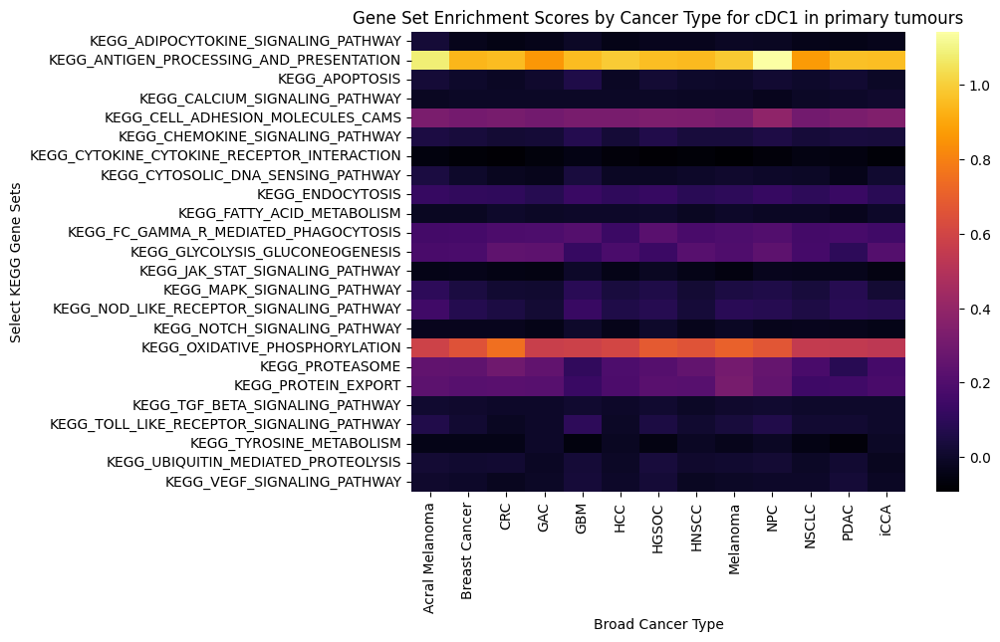

/scratch/temp/11785178/ipykernel_242198/1239375556.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


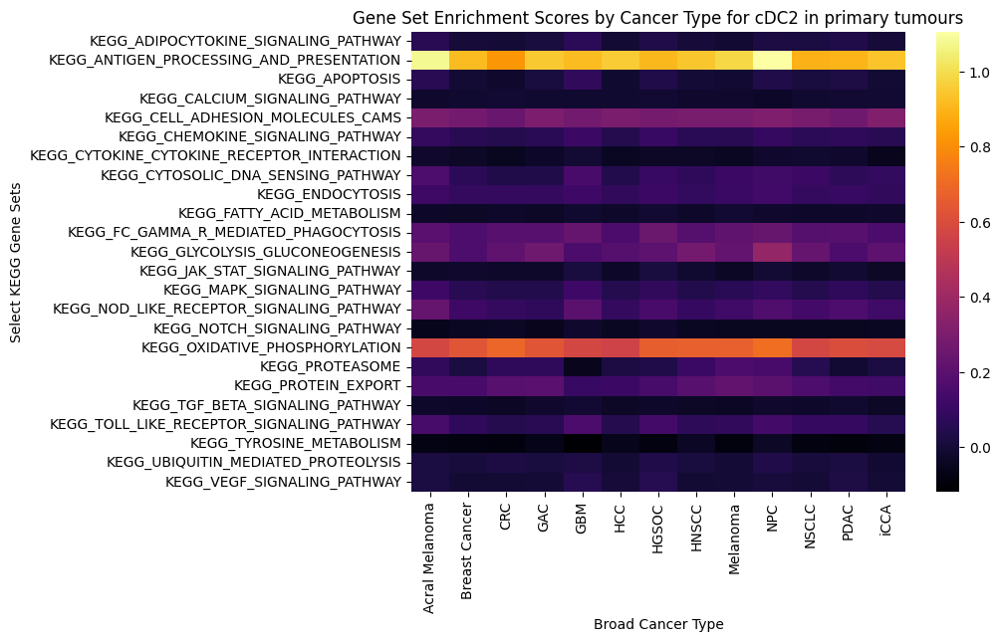

/scratch/temp/11785178/ipykernel_242198/1239375556.py:54: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


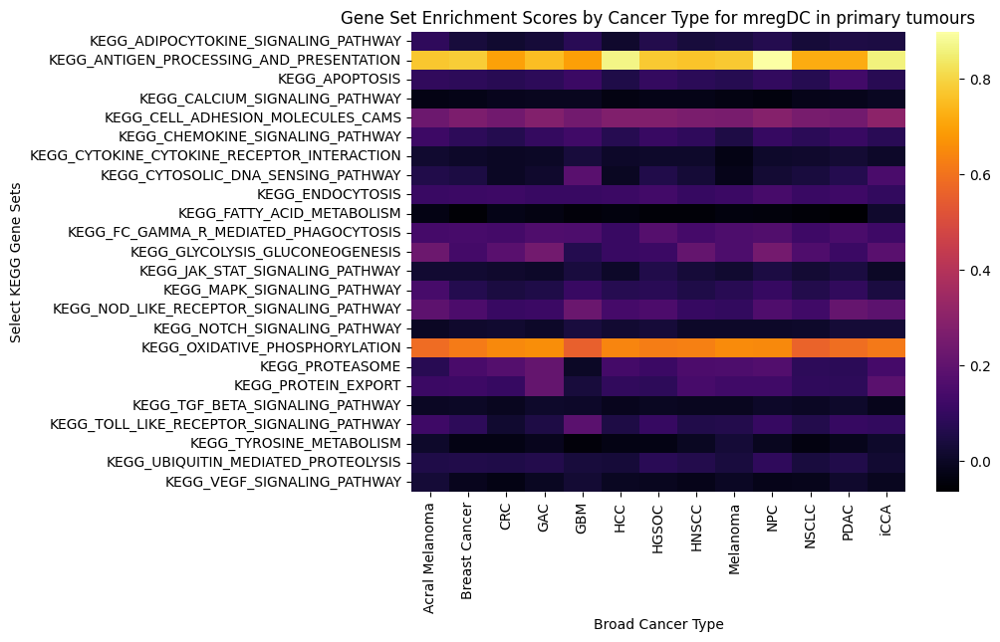

In [21]:
#DC1: 
# Extract gene set scores from `data_DC1.obs`
gene_set_scores = pd.DataFrame({
    set_name: data_DC1.obs[f"{set_name}_score"]
    for set_name in K_sets_sub.keys()
})

# Add the cancer_type_broad metadata as a column
gene_set_scores["cancer_type_broad"] = data_DC1.obs["cancer_type_broad"].values

# Group by cancer_type_broad and compute mean scores for each group
grouped_scores = gene_set_scores.groupby("cancer_type_broad").mean().T

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(grouped_scores, cmap="inferno", yticklabels=True, xticklabels=True)
plt.xlabel("Broad Cancer Type")
plt.ylabel("Select KEGG Gene Sets")
plt.title("Gene Set Enrichment Scores by Cancer Type for cDC1 in primary tumours")
plt.show()

#DC2:
# Extract gene set scores from `data_DC2.obs`
gene_set_scores = pd.DataFrame({
    set_name: data_DC2.obs[f"{set_name}_score"]
    for set_name in K_sets_sub.keys()
})

# Add the cancer_type_broad metadata as a column
gene_set_scores["cancer_type_broad"] = data_DC2.obs["cancer_type_broad"].values

# Group by cancer_type_broad and compute mean scores for each group
grouped_scores = gene_set_scores.groupby("cancer_type_broad").mean().T

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(grouped_scores, cmap="inferno", yticklabels=True, xticklabels=True)
plt.xlabel("Broad Cancer Type")
plt.ylabel("Select KEGG Gene Sets")
plt.title("Gene Set Enrichment Scores by Cancer Type for cDC2 in primary tumours")
plt.show()

#mregDC:
# Extract gene set scores from `data_DC1.obs`
gene_set_scores = pd.DataFrame({
    set_name: data_mregDC.obs[f"{set_name}_score"]
    for set_name in K_sets_sub.keys()
})

# Add the cancer_type_broad metadata as a column
gene_set_scores["cancer_type_broad"] = data_mregDC.obs["cancer_type_broad"].values

# Group by cancer_type_broad and compute mean scores for each group
grouped_scores = gene_set_scores.groupby("cancer_type_broad").mean().T

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(grouped_scores, cmap="inferno", yticklabels=True, xticklabels=True)
plt.xlabel("Broad Cancer Type")
plt.ylabel("Select KEGG Gene Sets")
plt.title("Gene Set Enrichment Scores by Cancer Type for mregDC in primary tumours")
plt.show()

## repeat for just OC to compare tissues:

In [23]:
data_OC = data[data.obs["cancer_with_H"] == "HGSOC"]

oc_DC1 = data_OC[data_OC.obs["NR_annotations_simple"] == "cDC1"]
oc_DC2 = data_OC[data_OC.obs["NR_annotations_simple"] == "cDC2"]
oc_mregDC = data_OC[data_OC.obs["NR_annotations_simple"] == "mregDC"]

### Score DC subsets by enrichment for each gene set (each dataframe in dictionary)

In [24]:
# Iterate through each gene set in K_sets_sub - DC1
for set_name, gene_set_df in K_sets_sub.items():
    # Extract the gene set from the 'gene_symbol' column of the dataframe
    gene_set = gene_set_df['gene_symbol'].tolist()
    
    # Score the cells using the gene set
    sc.tl.score_genes(oc_DC1, gene_list=gene_set, score_name=f"{set_name}_score")

# Iterate through each gene set in K_sets_sub - DC2
for set_name, gene_set_df in K_sets_sub.items():
    # Extract the gene set from the 'gene_symbol' column of the dataframe
    gene_set = gene_set_df['gene_symbol'].tolist()
    
    # Score the cells using the gene set
    sc.tl.score_genes(oc_DC2, gene_list=gene_set, score_name=f"{set_name}_score")

# Iterate through each gene set in K_sets_sub - mregDC
for set_name, gene_set_df in K_sets_sub.items():
    # Extract the gene set from the 'gene_symbol' column of the dataframe
    gene_set = gene_set_df['gene_symbol'].tolist()
    
    # Score the cells using the gene set
    sc.tl.score_genes(oc_mregDC, gene_list=gene_set, score_name=f"{set_name}_score")

       'PRKAG3'],
      dtype='object')
       'IFNA17', 'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7',
       'IFNA8', 'KIR2DL2', 'KIR2DL5A', 'KIR2DS1', 'KIR2DS3', 'KIR2DS4',
       'KIR2DS5'],
      dtype='object')
       'AVPR1B', 'BDKRB1', 'CACNA1B', 'CACNA1E', 'CACNA1S', 'CAMK2A', 'CCKAR',
       'CCKBR', 'CHP2', 'CHRM1', 'CHRM2', 'CHRM5', 'DRD1', 'DRD5', 'GRM1',
       'GRM5', 'GRPR', 'HTR2A', 'HTR2C', 'HTR4', 'HTR5A', 'HTR6', 'LHCGR',
       'MYLK3', 'P2RX3', 'PLCZ1', 'PLN', 'PPP3R2', 'PRKACG', 'PTGFR',
       'SLC25A31', 'TACR3', 'TRHR', 'VDAC2P5'],
      dtype='object')


/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


       'CLDN8', 'HLA-DRB3', 'HLA-DRB4', 'NECTIN1', 'NECTIN2', 'NECTIN3',
       'PECAM1'],
      dtype='object')
       'CCL3L3', 'CXCL8', 'GNG13', 'GRK1', 'GRK2', 'GRK3', 'PPBPP1', 'PRKACG'],
      dtype='object')
       'EPO', 'GH2', 'IFNA1', 'IFNA10', 'IFNA13', 'IFNA14', 'IFNA16', 'IFNA17',
       'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7', 'IFNA8', 'IFNK',
       'IFNL2', 'IFNL3', 'IFNW1', 'IL17B', 'IL25', 'IL3', 'IL4', 'IL5', 'IL9',
       'INHBC', 'LEP', 'PPBPP1', 'PRL', 'TGFB1', 'TNFRSF6B', 'VEGFD'],
      dtype='object')
       'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7', 'IFNA8', 'STING1'],
      dtype='object')
       'G6PC2', 'LDHAL6B', 'PCK1', 'PDHA2', 'PGAM4', 'PGK2', 'PKLR'],
      dtype='object')
       'IFNA17', 'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7',
       'IFNA8', 'IFNK', 'IFNL2', 'IFNL3', 'IFNW1', 'IL3', 'IL4', 'IL5', 'IL9',
       'LEP', 'PRL'],
      dtype='object')
       'CACNG6', 'CACNG7', 'CHP2', 'FGF10', 'FGF16', 'FGF20', 'FGF21', '

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


       'AVPR1B', 'BDKRB1', 'CACNA1B', 'CACNA1E', 'CACNA1S', 'CAMK2A', 'CCKAR',
       'CCKBR', 'CHP2', 'CHRM1', 'CHRM2', 'CHRM5', 'DRD1', 'DRD5', 'GRM1',
       'GRM5', 'GRPR', 'HTR2A', 'HTR2C', 'HTR4', 'HTR5A', 'HTR6', 'LHCGR',
       'MYLK3', 'P2RX3', 'PLCZ1', 'PLN', 'PPP3R2', 'PRKACG', 'PTGFR',
       'SLC25A31', 'TACR3', 'TRHR', 'VDAC2P5'],
      dtype='object')
       'CLDN8', 'HLA-DRB3', 'HLA-DRB4', 'NECTIN1', 'NECTIN2', 'NECTIN3',
       'PECAM1'],
      dtype='object')
       'CCL3L3', 'CXCL8', 'GNG13', 'GRK1', 'GRK2', 'GRK3', 'PPBPP1', 'PRKACG'],
      dtype='object')
       'EPO', 'GH2', 'IFNA1', 'IFNA10', 'IFNA13', 'IFNA14', 'IFNA16', 'IFNA17',
       'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7', 'IFNA8', 'IFNK',
       'IFNL2', 'IFNL3', 'IFNW1', 'IL17B', 'IL25', 'IL3', 'IL4', 'IL5', 'IL9',
       'INHBC', 'LEP', 'PPBPP1', 'PRL', 'TGFB1', 'TNFRSF6B', 'VEGFD'],
      dtype='object')
       'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7', 'IFNA8', 'STING1'],
      dtype=

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


       'G6PC2', 'LDHAL6B', 'PCK1', 'PDHA2', 'PGAM4', 'PGK2', 'PKLR'],
      dtype='object')
       'IFNA17', 'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7',
       'IFNA8', 'IFNK', 'IFNL2', 'IFNL3', 'IFNW1', 'IL3', 'IL4', 'IL5', 'IL9',
       'LEP', 'PRL'],
      dtype='object')
       'CACNG6', 'CACNG7', 'CHP2', 'FGF10', 'FGF16', 'FGF20', 'FGF21', 'FGF23',
       'FGF3', 'FGF4', 'FGF5', 'FGF6', 'FLNC', 'JMJD7-PLA2G4B', 'MAP3K14',
       'MAP3K20', 'MOS', 'NGF', 'PLA2G12B', 'PLA2G2A', 'PLA2G2C', 'PLA2G2E',
       'PLA2G2F', 'PPP3R2', 'PRKACG', 'PTPN5', 'TGFB1'],
      dtype='object')
       'ATP5MC1', 'ATP5MC1P5', 'ATP5MC2', 'ATP5MC3', 'ATP5ME', 'ATP5MF',
       'ATP5MG', 'ATP5PB', 'ATP5PD', 'ATP5PF', 'ATP5PO', 'ATP6V1G3', 'COX6A2',
       'COX6CP3', 'COX7B2', 'COX8C', 'UQCR10P1', 'UQCRHL'],
      dtype='object')
       'TGFB1'],
      dtype='object')
       'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7', 'IFNA8', 'LBP'],
      dtype='object')
       'NAA80', 'TAT', 'TH',

### generate a heatmap of results:

/scratch/temp/11785178/ipykernel_242198/1920013601.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


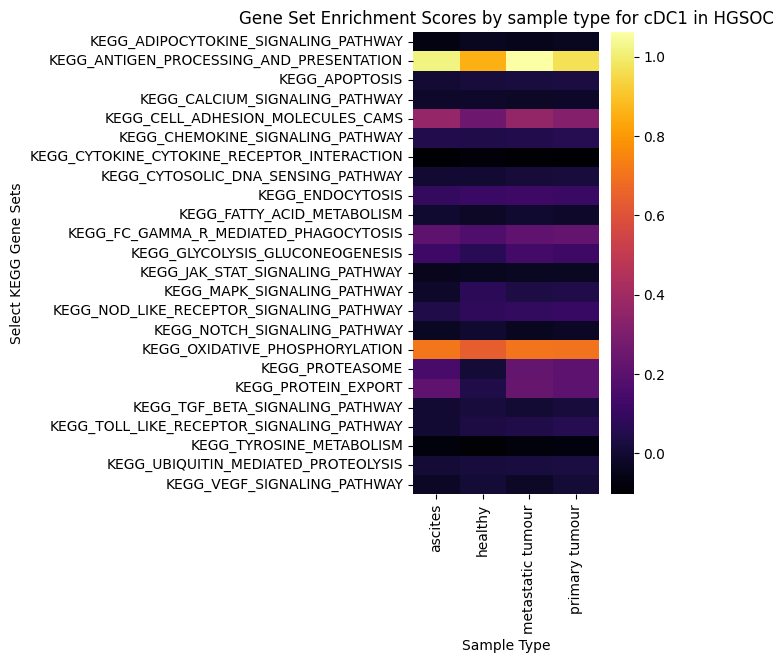

/scratch/temp/11785178/ipykernel_242198/1920013601.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


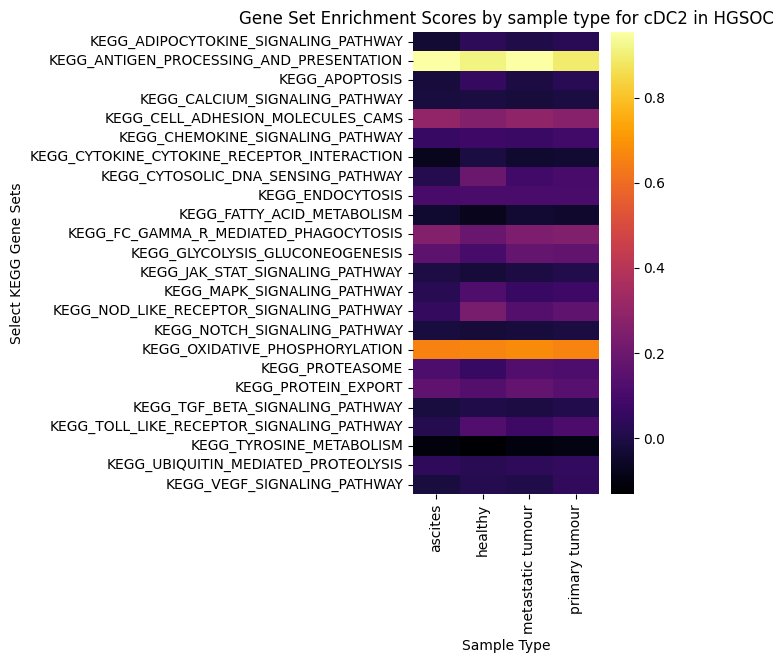

/scratch/temp/11785178/ipykernel_242198/1920013601.py:54: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


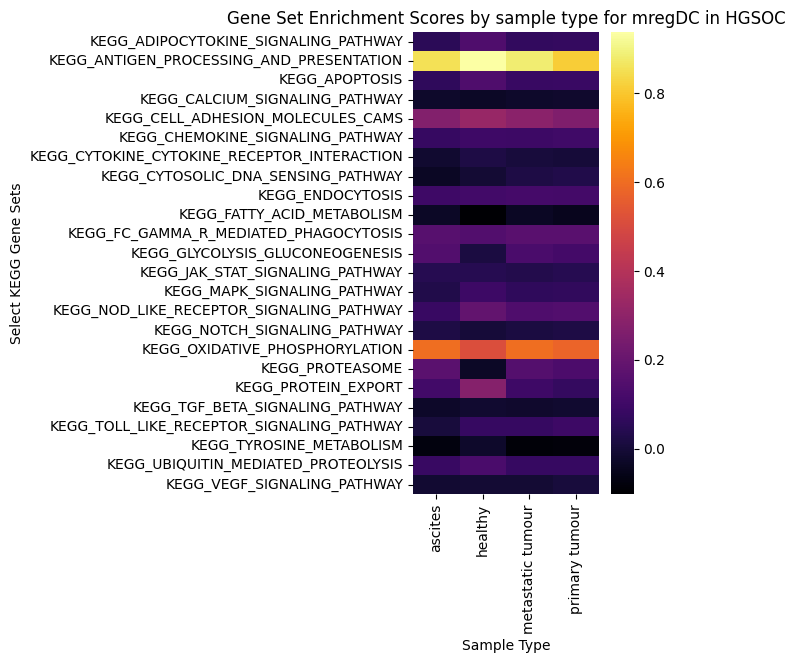

In [27]:
#DC1: 
# Extract gene set scores from `oc_DC1.obs`
gene_set_scores = pd.DataFrame({
    set_name: oc_DC1.obs[f"{set_name}_score"]
    for set_name in K_sets_sub.keys()
})

# Add the sample_type_major2 metadata as a column
gene_set_scores["sample_type_major2"] = oc_DC1.obs["sample_type_major2"].values

# Group by sample_type_major2 and compute mean scores for each group
grouped_scores = gene_set_scores.groupby("sample_type_major2").mean().T

# Plot the heatmap
plt.figure(figsize=(3, 6))
sns.heatmap(grouped_scores, cmap="inferno", yticklabels=True, xticklabels=True)
plt.xlabel("Sample Type")
plt.ylabel("Select KEGG Gene Sets")
plt.title("Gene Set Enrichment Scores by sample type for cDC1 in HGSOC")
plt.show()

#DC2:
# Extract gene set scores from `oc_DC2.obs`
gene_set_scores = pd.DataFrame({
    set_name: oc_DC2.obs[f"{set_name}_score"]
    for set_name in K_sets_sub.keys()
})

# Add the sample_type_major2 metadata as a column
gene_set_scores["sample_type_major2"] = oc_DC2.obs["sample_type_major2"].values

# Group by sample_type_major2 and compute mean scores for each group
grouped_scores = gene_set_scores.groupby("sample_type_major2").mean().T

# Plot the heatmap
plt.figure(figsize=(3, 6))
sns.heatmap(grouped_scores, cmap="inferno", yticklabels=True, xticklabels=True)
plt.xlabel("Sample Type")
plt.ylabel("Select KEGG Gene Sets")
plt.title("Gene Set Enrichment Scores by sample type for cDC2 in HGSOC")
plt.show()

#mregDC:
# Extract gene set scores from `oc_mregDC.obs`
gene_set_scores = pd.DataFrame({
    set_name: oc_mregDC.obs[f"{set_name}_score"]
    for set_name in K_sets_sub.keys()
})

# Add the sample_type_major2 metadata as a column
gene_set_scores["sample_type_major2"] = oc_mregDC.obs["sample_type_major2"].values

# Group by sample_type_major2 and compute mean scores for each group
grouped_scores = gene_set_scores.groupby("sample_type_major2").mean().T

# Plot the heatmap
plt.figure(figsize=(3, 6))
sns.heatmap(grouped_scores, cmap="inferno", yticklabels=True, xticklabels=True)
plt.xlabel("Sample Type")
plt.ylabel("Select KEGG Gene Sets")
plt.title("Gene Set Enrichment Scores by sample type for mregDC in HGSOC")
plt.show()

# Do per sample - generate score

In [20]:
# Create a dictionary to store mean scores per sample
sample_scores = {}

# Iterate through each gene set
for set_name, gene_set_df in K_sets_sub.items():
    # Extract the gene set from the 'gene_symbol' column of the dataframe
    gene_set = gene_set_df['gene_symbol'].tolist()

    # Score the cells using the gene set
    sc.tl.score_genes(data_DC1, gene_list=gene_set, score_name=f"{set_name}_score")


# Select only numeric columns for aggregation
numeric_columns = [f"{set_name}_score" for set_name in K_sets_sub.keys()]

# Ensure these columns exist in data_DC1.obs
numeric_columns = [col for col in numeric_columns if col in data_DC1.obs.columns]

# Group by 'integration_id' and calculate mean only for numeric columns
sample_scores_df = data_DC1.obs.groupby("integration_id")[numeric_columns].mean()

# Add the cancer_type_broad metadata for each sample
sample_scores_df["cancer_type_broad"] = data_DC1.obs.groupby("integration_id")["cancer_type_broad"].first()

       'PRKAG3'],
      dtype='object')
       'IFNA17', 'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7',
       'IFNA8', 'KIR2DL2', 'KIR2DL5A', 'KIR2DS1', 'KIR2DS3', 'KIR2DS4',
       'KIR2DS5'],
      dtype='object')
       'AVPR1B', 'BDKRB1', 'CACNA1B', 'CACNA1E', 'CACNA1S', 'CAMK2A', 'CCKAR',
       'CCKBR', 'CHP2', 'CHRM1', 'CHRM2', 'CHRM5', 'DRD1', 'DRD5', 'GRM1',
       'GRM5', 'GRPR', 'HTR2A', 'HTR2C', 'HTR4', 'HTR5A', 'HTR6', 'LHCGR',
       'MYLK3', 'P2RX3', 'PLCZ1', 'PLN', 'PPP3R2', 'PRKACG', 'PTGFR',
       'SLC25A31', 'TACR3', 'TRHR', 'VDAC2P5'],
      dtype='object')
       'CLDN8', 'HLA-DRB3', 'HLA-DRB4', 'NECTIN1', 'NECTIN2', 'NECTIN3',
       'PECAM1'],
      dtype='object')
       'CCL3L3', 'CXCL8', 'GNG13', 'GRK1', 'GRK2', 'GRK3', 'PPBPP1', 'PRKACG'],
      dtype='object')
       'EPO', 'GH2', 'IFNA1', 'IFNA10', 'IFNA13', 'IFNA14', 'IFNA16', 'IFNA17',
       'IFNA2', 'IFNA21', 'IFNA4', 'IFNA5', 'IFNA6', 'IFNA7', 'IFNA8', 'IFNK',
       'IFNL2', 'IFNL3', 'IFNW1'

/scratch/temp/11876696/ipykernel_3977895/2755296868.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/scratch/temp/11876696/ipykernel_3977895/2755296868.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


/scratch/temp/11876696/ipykernel_3977895/2218575207.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


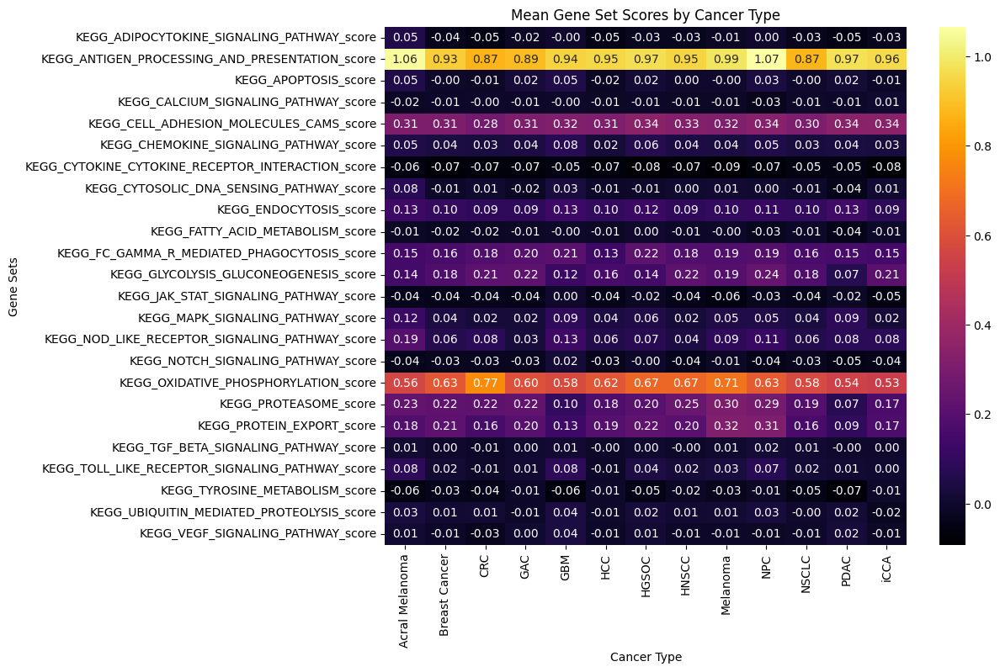

In [21]:
# Group by cancer type and compute the average score for each cancer type 
cancer_type_scores_df = sample_scores_df.groupby("cancer_type_broad").mean()

# plot the scores
plt.figure(figsize=(10, 8))
sns.heatmap(cancer_type_scores_df.T, cmap="inferno", annot=True, fmt=".2f")
plt.xlabel("Cancer Type")
plt.ylabel("Gene Sets")
plt.title("Mean Gene Set Scores by Cancer Type")
plt.show()

In [22]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [23]:
# Prepare a DataFrame to store results
anova_results = []

# Loop through each gene set
for gene_set in K_sets_sub.keys():
    # Filter the data for the current gene set
    gene_set_data = long_scores_df[long_scores_df["Gene Set"] == f"{gene_set}_score"]

    # Perform one-way ANOVA
    model = ols("Score ~ C(cancer_type_broad)", data=gene_set_data).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)

    # Save ANOVA p-value
    p_value = anova_table["PR(>F)"][0]
    anova_results.append({"Gene Set": gene_set, "ANOVA P-value": p_value})

    # Perform post hoc Tukey HSD to compare with HGSOC
    posthoc = pairwise_tukeyhsd(
        endog=gene_set_data["Score"],  # Dependent variable
        groups=gene_set_data["cancer_type_broad"],  # Independent variable
        alpha=0.05,
    )
    
    # Extract comparisons involving HGSOC
    hgsoc_comparisons = posthoc.summary()
    hgsoc_filtered = pd.DataFrame(
        hgsoc_comparisons.data[1:], columns=hgsoc_comparisons.data[0]
    )
    hgsoc_filtered = hgsoc_filtered[
        (hgsoc_filtered["group1"] == "HGSOC") | (hgsoc_filtered["group2"] == "HGSOC")
    ]

    # Print or log the results for the current gene set
    print(f"Gene Set: {gene_set}")
    print(f"ANOVA P-value: {p_value:.4e}")
    print(hgsoc_filtered)
    print("-" * 40)

# Convert the ANOVA results to a DataFrame
anova_results_df = pd.DataFrame(anova_results)

anova_results_df

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY
ANOVA P-value: 1.0757e-06
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC   -0.0824  0.0002 -0.1404 -0.0243    True
16   Breast Cancer     HGSOC    0.0069  0.9958 -0.0134  0.0271   False
26             CRC     HGSOC    0.0182  0.9795 -0.0266  0.0630   False
35             GAC     HGSOC   -0.0094  0.9999 -0.0516  0.0328   False
43             GBM     HGSOC   -0.0274  0.0674 -0.0557  0.0009   False
50             HCC     HGSOC    0.0166  0.9949 -0.0314  0.0647   False
57           HGSOC     HNSCC    0.0008  1.0000 -0.0173  0.0189   False
58           HGSOC  Melanoma    0.0165  1.0000 -0.0644  0.0974   False
59           HGSOC       NPC    0.0297  0.5820 -0.0151  0.0745   False
60           HGSOC     NSCLC   -0.0037  1.0000 -0.0254  0.0180   False
61           HGSOC      PDAC   -0.0208  0.8807 -0.0608  0.0193   False
62           HGSOC      iCCA   -0.0038  1.0000 -0.0703  0.0628   False
----

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_ANTIGEN_PROCESSING_AND_PRESENTATION
ANOVA P-value: 1.5294e-01
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC   -0.0873  0.9989 -0.3842  0.2096   False
16   Breast Cancer     HGSOC    0.0419  0.9803 -0.0617  0.1456   False
26             CRC     HGSOC    0.1020  0.9585 -0.1272  0.3313   False
35             GAC     HGSOC    0.0811  0.9895 -0.1348  0.2970   False
43             GBM     HGSOC    0.0269  1.0000 -0.1177  0.1716   False
50             HCC     HGSOC    0.0171  1.0000 -0.2288  0.2630   False
57           HGSOC     HNSCC   -0.0206  0.9999 -0.1132  0.0719   False
58           HGSOC  Melanoma    0.0166  1.0000 -0.3972  0.4303   False
59           HGSOC       NPC    0.0971  0.9717 -0.1322  0.3263   False
60           HGSOC     NSCLC   -0.0945  0.1895 -0.2055  0.0166   False
61           HGSOC      PDAC    0.0057  1.0000 -0.1993  0.2107   False
62           HGSOC      iCCA   -0.0114  1.0000 -0.3518  0.3289   False


/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_APOPTOSIS
ANOVA P-value: 3.7036e-14
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC   -0.0347  0.5551 -0.0862  0.0168   False
16   Breast Cancer     HGSOC    0.0212  0.0068  0.0032  0.0391    True
26             CRC     HGSOC    0.0308  0.3220 -0.0089  0.0706   False
35             GAC     HGSOC   -0.0067  1.0000 -0.0441  0.0308   False
43             GBM     HGSOC   -0.0365  0.0001 -0.0616 -0.0115    True
50             HCC     HGSOC    0.0368  0.1715 -0.0058  0.0795   False
57           HGSOC     HNSCC   -0.0171  0.0249 -0.0332 -0.0011    True
58           HGSOC  Melanoma   -0.0192  0.9996 -0.0909  0.0526   False
59           HGSOC       NPC    0.0161  0.9804 -0.0237  0.0558   False
60           HGSOC     NSCLC   -0.0195  0.0440 -0.0388 -0.0002    True
61           HGSOC      PDAC   -0.0008  1.0000 -0.0363  0.0348   False
62           HGSOC      iCCA   -0.0257  0.9647 -0.0847  0.0333   False
--------------------------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_CALCIUM_SIGNALING_PATHWAY
ANOVA P-value: 1.3157e-03
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC    0.0059  0.9999 -0.0189  0.0306   False
16   Breast Cancer     HGSOC   -0.0020  0.9999 -0.0107  0.0066   False
26             CRC     HGSOC   -0.0065  0.9958 -0.0256  0.0126   False
35             GAC     HGSOC   -0.0004  1.0000 -0.0184  0.0176   False
43             GBM     HGSOC   -0.0068  0.8093 -0.0188  0.0053   False
50             HCC     HGSOC    0.0016  1.0000 -0.0188  0.0221   False
57           HGSOC     HNSCC   -0.0031  0.9789 -0.0109  0.0046   False
58           HGSOC  Melanoma   -0.0011  1.0000 -0.0355  0.0334   False
59           HGSOC       NPC   -0.0198  0.0347 -0.0389 -0.0007    True
60           HGSOC     NSCLC    0.0040  0.9641 -0.0052  0.0133   False
61           HGSOC      PDAC    0.0024  1.0000 -0.0147  0.0194   False
62           HGSOC      iCCA    0.0159  0.8074 -0.0124  0.0443   False
----------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_CELL_ADHESION_MOLECULES_CAMS
ANOVA P-value: 1.9257e-01
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC    0.0377  0.9992 -0.0947  0.1701   False
16   Breast Cancer     HGSOC    0.0385  0.2167 -0.0077  0.0847   False
26             CRC     HGSOC    0.0665  0.6127 -0.0357  0.1688   False
35             GAC     HGSOC    0.0383  0.9829 -0.0580  0.1346   False
43             GBM     HGSOC    0.0282  0.9642 -0.0364  0.0927   False
50             HCC     HGSOC    0.0339  0.9982 -0.0757  0.1436   False
57           HGSOC     HNSCC   -0.0168  0.9796 -0.0581  0.0245   False
58           HGSOC  Melanoma   -0.0278  1.0000 -0.2123  0.1567   False
59           HGSOC       NPC   -0.0094  1.0000 -0.1116  0.0929   False
60           HGSOC     NSCLC   -0.0432  0.1587 -0.0928  0.0063   False
61           HGSOC      PDAC   -0.0011  1.0000 -0.0925  0.0903   False
62           HGSOC      iCCA   -0.0004  1.0000 -0.1522  0.1513   False
-------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_CHEMOKINE_SIGNALING_PATHWAY
ANOVA P-value: 3.3757e-18
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC    0.0150  0.9853 -0.0234  0.0535   False
16   Breast Cancer     HGSOC    0.0278  0.0000  0.0144  0.0412    True
26             CRC     HGSOC    0.0301  0.0428  0.0005  0.0598    True
35             GAC     HGSOC    0.0236  0.2012 -0.0044  0.0515   False
43             GBM     HGSOC   -0.0127  0.5390 -0.0315  0.0060   False
50             HCC     HGSOC    0.0419  0.0011  0.0101  0.0737    True
57           HGSOC     HNSCC   -0.0244  0.0000 -0.0363 -0.0124    True
58           HGSOC  Melanoma   -0.0276  0.8855 -0.0812  0.0260   False
59           HGSOC       NPC   -0.0103  0.9949 -0.0400  0.0194   False
60           HGSOC     NSCLC   -0.0321  0.0000 -0.0464 -0.0177    True
61           HGSOC      PDAC   -0.0245  0.1048 -0.0510  0.0021   False
62           HGSOC      iCCA   -0.0294  0.5723 -0.0735  0.0147   False
--------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION
ANOVA P-value: 1.0311e-04
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC   -0.0215  0.9540 -0.0691  0.0261   False
16   Breast Cancer     HGSOC   -0.0062  0.9903 -0.0228  0.0104   False
26             CRC     HGSOC   -0.0120  0.9971 -0.0487  0.0248   False
35             GAC     HGSOC   -0.0143  0.9762 -0.0490  0.0203   False
43             GBM     HGSOC   -0.0274  0.0065 -0.0506 -0.0042    True
50             HCC     HGSOC   -0.0121  0.9984 -0.0515  0.0274   False
57           HGSOC     HNSCC    0.0083  0.8166 -0.0066  0.0231   False
58           HGSOC  Melanoma   -0.0124  1.0000 -0.0788  0.0539   False
59           HGSOC       NPC    0.0141  0.9871 -0.0226  0.0509   False
60           HGSOC     NSCLC    0.0264  0.0001  0.0086  0.0442    True
61           HGSOC      PDAC    0.0293  0.1372 -0.0036  0.0621   False
62           HGSOC      iCCA    0.0044  1.0000 -0.0502  0.0590   Fal

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_CYTOSOLIC_DNA_SENSING_PATHWAY
ANOVA P-value: 3.4068e-04
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC   -0.0829  0.0190 -0.1590 -0.0069    True
16   Breast Cancer     HGSOC    0.0001  1.0000 -0.0264  0.0267   False
26             CRC     HGSOC   -0.0126  1.0000 -0.0714  0.0462   False
35             GAC     HGSOC    0.0115  1.0000 -0.0439  0.0668   False
43             GBM     HGSOC   -0.0401  0.0209 -0.0772 -0.0030    True
50             HCC     HGSOC    0.0032  1.0000 -0.0598  0.0663   False
57           HGSOC     HNSCC    0.0099  0.9747 -0.0138  0.0336   False
58           HGSOC  Melanoma    0.0146  1.0000 -0.0915  0.1206   False
59           HGSOC       NPC    0.0097  1.0000 -0.0491  0.0684   False
60           HGSOC     NSCLC    0.0003  1.0000 -0.0282  0.0287   False
61           HGSOC      PDAC   -0.0328  0.6753 -0.0853  0.0197   False
62           HGSOC      iCCA    0.0180  1.0000 -0.0693  0.1052   False
------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_ENDOCYTOSIS
ANOVA P-value: 4.1142e-15
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC   -0.0015  1.0000 -0.0446  0.0416   False
16   Breast Cancer     HGSOC    0.0218  0.0002  0.0067  0.0368    True
26             CRC     HGSOC    0.0323  0.0673 -0.0010  0.0655   False
35             GAC     HGSOC    0.0354  0.0119  0.0041  0.0667    True
43             GBM     HGSOC   -0.0051  0.9998 -0.0261  0.0159   False
50             HCC     HGSOC    0.0259  0.4319 -0.0098  0.0616   False
57           HGSOC     HNSCC   -0.0322  0.0000 -0.0457 -0.0188    True
58           HGSOC  Melanoma   -0.0261  0.9651 -0.0861  0.0339   False
59           HGSOC       NPC   -0.0145  0.9649 -0.0477  0.0188   False
60           HGSOC     NSCLC   -0.0249  0.0000 -0.0410 -0.0087    True
61           HGSOC      PDAC    0.0099  0.9963 -0.0198  0.0397   False
62           HGSOC      iCCA   -0.0376  0.3514 -0.0870  0.0118   False
------------------------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_FATTY_ACID_METABOLISM
ANOVA P-value: 1.1090e-01
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC    0.0148  1.0000 -0.0530  0.0825   False
16   Breast Cancer     HGSOC    0.0228  0.0718 -0.0009  0.0464   False
26             CRC     HGSOC    0.0195  0.9901 -0.0328  0.0718   False
35             GAC     HGSOC    0.0136  0.9994 -0.0356  0.0629   False
43             GBM     HGSOC    0.0066  1.0000 -0.0264  0.0396   False
50             HCC     HGSOC    0.0161  0.9991 -0.0400  0.0722   False
57           HGSOC     HNSCC   -0.0126  0.7398 -0.0337  0.0085   False
58           HGSOC  Melanoma   -0.0057  1.0000 -0.1001  0.0887   False
59           HGSOC       NPC   -0.0307  0.7601 -0.0830  0.0216   False
60           HGSOC     NSCLC   -0.0099  0.9852 -0.0352  0.0154   False
61           HGSOC      PDAC   -0.0427  0.1142 -0.0894  0.0041   False
62           HGSOC      iCCA   -0.0075  1.0000 -0.0852  0.0701   False
--------------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_FC_GAMMA_R_MEDIATED_PHAGOCYTOSIS
ANOVA P-value: 3.3487e-07
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC    0.0678  0.3884 -0.0233  0.1590   False
16   Breast Cancer     HGSOC    0.0524  0.0000  0.0206  0.0842    True
26             CRC     HGSOC    0.0366  0.8781 -0.0338  0.1070   False
35             GAC     HGSOC    0.0154  0.9999 -0.0509  0.0817   False
43             GBM     HGSOC    0.0081  1.0000 -0.0363  0.0525   False
50             HCC     HGSOC    0.0866  0.0097  0.0111  0.1621    True
57           HGSOC     HNSCC   -0.0338  0.0058 -0.0622 -0.0054    True
58           HGSOC  Melanoma   -0.0288  0.9999 -0.1558  0.0982   False
59           HGSOC       NPC   -0.0259  0.9912 -0.0963  0.0445   False
60           HGSOC     NSCLC   -0.0531  0.0000 -0.0872 -0.0191    True
61           HGSOC      PDAC   -0.0623  0.0550 -0.1252  0.0006   False
62           HGSOC      iCCA   -0.0672  0.6307 -0.1716  0.0373   False
---

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_GLYCOLYSIS_GLUCONEOGENESIS
ANOVA P-value: 2.2019e-12
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC    0.0001  1.0000 -0.1232  0.1235   False
16   Breast Cancer     HGSOC   -0.0307  0.4583 -0.0738  0.0123   False
26             CRC     HGSOC   -0.0689  0.4367 -0.1641  0.0264   False
35             GAC     HGSOC   -0.0746  0.2191 -0.1643  0.0151   False
43             GBM     HGSOC    0.0243  0.9803 -0.0358  0.0844   False
50             HCC     HGSOC   -0.0158  1.0000 -0.1179  0.0864   False
57           HGSOC     HNSCC    0.0740  0.0000  0.0355  0.1124    True
58           HGSOC  Melanoma    0.0502  0.9990 -0.1217  0.2221   False
59           HGSOC       NPC    0.0934  0.0607 -0.0019  0.1886   False
60           HGSOC     NSCLC    0.0328  0.4643 -0.0133  0.0790   False
61           HGSOC      PDAC   -0.0774  0.1173 -0.1626  0.0077   False
62           HGSOC      iCCA    0.0656  0.9438 -0.0758  0.2070   False
---------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_JAK_STAT_SIGNALING_PATHWAY
ANOVA P-value: 1.2769e-13
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC    0.0176  0.9521 -0.0212  0.0564   False
16   Breast Cancer     HGSOC    0.0217  0.0000  0.0081  0.0352    True
26             CRC     HGSOC    0.0192  0.6327 -0.0107  0.0492   False
35             GAC     HGSOC    0.0231  0.2387 -0.0051  0.0513   False
43             GBM     HGSOC   -0.0179  0.0824 -0.0368  0.0010   False
50             HCC     HGSOC    0.0253  0.2990 -0.0069  0.0574   False
57           HGSOC     HNSCC   -0.0210  0.0000 -0.0331 -0.0089    True
58           HGSOC  Melanoma   -0.0408  0.3660 -0.0949  0.0133   False
59           HGSOC       NPC   -0.0101  0.9960 -0.0401  0.0199   False
60           HGSOC     NSCLC   -0.0195  0.0007 -0.0340 -0.0050    True
61           HGSOC      PDAC    0.0019  1.0000 -0.0249  0.0287   False
62           HGSOC      iCCA   -0.0359  0.2593 -0.0804  0.0085   False
---------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_MAPK_SIGNALING_PATHWAY
ANOVA P-value: 1.9864e-23
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC   -0.0644  0.0015 -0.1142 -0.0145    True
16   Breast Cancer     HGSOC    0.0156  0.1316 -0.0018  0.0330   False
26             CRC     HGSOC    0.0316  0.2362 -0.0069  0.0701   False
35             GAC     HGSOC    0.0316  0.1622 -0.0047  0.0678   False
43             GBM     HGSOC   -0.0358  0.0001 -0.0601 -0.0115    True
50             HCC     HGSOC    0.0151  0.9916 -0.0262  0.0564   False
57           HGSOC     HNSCC   -0.0306  0.0000 -0.0461 -0.0150    True
58           HGSOC  Melanoma   -0.0065  1.0000 -0.0760  0.0630   False
59           HGSOC       NPC   -0.0047  1.0000 -0.0432  0.0338   False
60           HGSOC     NSCLC   -0.0199  0.0242 -0.0386 -0.0013    True
61           HGSOC      PDAC    0.0308  0.1318 -0.0036  0.0652   False
62           HGSOC      iCCA   -0.0346  0.7175 -0.0917  0.0225   False
-------------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY
ANOVA P-value: 9.8189e-14
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC   -0.1218  0.0002 -0.2059 -0.0378    True
16   Breast Cancer     HGSOC    0.0088  0.9987 -0.0206  0.0381   False
26             CRC     HGSOC   -0.0096  1.0000 -0.0745  0.0553   False
35             GAC     HGSOC    0.0420  0.5219 -0.0191  0.1032   False
43             GBM     HGSOC   -0.0550  0.0007 -0.0959 -0.0140    True
50             HCC     HGSOC    0.0124  1.0000 -0.0573  0.0820   False
57           HGSOC     HNSCC   -0.0303  0.0088 -0.0565 -0.0041    True
58           HGSOC  Melanoma    0.0190  1.0000 -0.0981  0.1362   False
59           HGSOC       NPC    0.0422  0.6128 -0.0227  0.1071   False
60           HGSOC     NSCLC   -0.0143  0.9509 -0.0457  0.0171   False
61           HGSOC      PDAC    0.0121  1.0000 -0.0459  0.0701   False
62           HGSOC      iCCA    0.0102  1.0000 -0.0862  0.1065   False


/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_NOTCH_SIGNALING_PATHWAY
ANOVA P-value: 3.7616e-16
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC    0.0345  0.4279 -0.0130  0.0821   False
16   Breast Cancer     HGSOC    0.0246  0.0001  0.0081  0.0412    True
26             CRC     HGSOC    0.0250  0.5377 -0.0117  0.0617   False
35             GAC     HGSOC    0.0263  0.3509 -0.0082  0.0609   False
43             GBM     HGSOC   -0.0193  0.2143 -0.0425  0.0038   False
50             HCC     HGSOC    0.0284  0.4400 -0.0109  0.0678   False
57           HGSOC     HNSCC   -0.0336  0.0000 -0.0484 -0.0188    True
58           HGSOC  Melanoma   -0.0117  1.0000 -0.0779  0.0545   False
59           HGSOC       NPC   -0.0385  0.0298 -0.0752 -0.0018    True
60           HGSOC     NSCLC   -0.0254  0.0002 -0.0432 -0.0077    True
61           HGSOC      PDAC   -0.0439  0.0008 -0.0767 -0.0111    True
62           HGSOC      iCCA   -0.0372  0.5331 -0.0917  0.0173   False
------------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_OXIDATIVE_PHOSPHORYLATION
ANOVA P-value: 1.6547e-09
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC    0.1111  0.6532 -0.0642  0.2864   False
16   Breast Cancer     HGSOC    0.0473  0.3272 -0.0139  0.1085   False
26             CRC     HGSOC   -0.0956  0.4761 -0.2310  0.0397   False
35             GAC     HGSOC    0.0703  0.8276 -0.0572  0.1978   False
43             GBM     HGSOC    0.0938  0.0174  0.0084  0.1792    True
50             HCC     HGSOC    0.0521  0.9929 -0.0931  0.1973   False
57           HGSOC     HNSCC    0.0003  1.0000 -0.0544  0.0550   False
58           HGSOC  Melanoma    0.0315  1.0000 -0.2128  0.2758   False
59           HGSOC       NPC   -0.0410  0.9986 -0.1764  0.0944   False
60           HGSOC     NSCLC   -0.0988  0.0001 -0.1644 -0.0333    True
61           HGSOC      PDAC   -0.1308  0.0211 -0.2519 -0.0098    True
62           HGSOC      iCCA   -0.1458  0.4315 -0.3467  0.0552   False
----------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_PROTEASOME
ANOVA P-value: 4.0111e-04
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC   -0.0253  1.0000 -0.2560  0.2054   False
16   Breast Cancer     HGSOC   -0.0150  1.0000 -0.0955  0.0656   False
26             CRC     HGSOC   -0.0121  1.0000 -0.1903  0.1660   False
35             GAC     HGSOC   -0.0198  1.0000 -0.1876  0.1480   False
43             GBM     HGSOC    0.1040  0.1016 -0.0084  0.2165   False
50             HCC     HGSOC    0.0289  1.0000 -0.1622  0.2199   False
57           HGSOC     HNSCC    0.0445  0.6877 -0.0274  0.1165   False
58           HGSOC  Melanoma    0.1002  0.9981 -0.2213  0.4217   False
59           HGSOC       NPC    0.0823  0.9452 -0.0958  0.2605   False
60           HGSOC     NSCLC   -0.0135  1.0000 -0.0998  0.0728   False
61           HGSOC      PDAC   -0.1301  0.2434 -0.2894  0.0292   False
62           HGSOC      iCCA   -0.0394  1.0000 -0.3039  0.2250   False
-------------------------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_PROTEIN_EXPORT
ANOVA P-value: 2.3308e-05
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC    0.0353  1.0000 -0.1358  0.2065   False
16   Breast Cancer     HGSOC    0.0059  1.0000 -0.0539  0.0656   False
26             CRC     HGSOC    0.0647  0.9183 -0.0675  0.1968   False
35             GAC     HGSOC    0.0223  1.0000 -0.1022  0.1468   False
43             GBM     HGSOC    0.0904  0.0204  0.0070  0.1738    True
50             HCC     HGSOC    0.0265  1.0000 -0.1153  0.1682   False
57           HGSOC     HNSCC   -0.0161  0.9986 -0.0694  0.0373   False
58           HGSOC  Melanoma    0.0960  0.9811 -0.1425  0.3346   False
59           HGSOC       NPC    0.0929  0.4851 -0.0393  0.2250   False
60           HGSOC     NSCLC   -0.0606  0.0842 -0.1246  0.0034   False
61           HGSOC      PDAC   -0.1253  0.0266 -0.2434 -0.0071    True
62           HGSOC      iCCA   -0.0476  0.9998 -0.2438  0.1486   False
---------------------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_TGF_BETA_SIGNALING_PATHWAY
ANOVA P-value: 4.1801e-02
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC   -0.0097  0.9997 -0.0479  0.0284   False
16   Breast Cancer     HGSOC    0.0037  0.9994 -0.0096  0.0170   False
26             CRC     HGSOC    0.0139  0.9378 -0.0156  0.0433   False
35             GAC     HGSOC   -0.0001  1.0000 -0.0278  0.0277   False
43             GBM     HGSOC   -0.0072  0.9857 -0.0258  0.0113   False
50             HCC     HGSOC    0.0062  1.0000 -0.0254  0.0378   False
57           HGSOC     HNSCC   -0.0079  0.5709 -0.0198  0.0040   False
58           HGSOC  Melanoma    0.0015  1.0000 -0.0517  0.0546   False
59           HGSOC       NPC    0.0141  0.9302 -0.0154  0.0435   False
60           HGSOC     NSCLC    0.0039  0.9994 -0.0103  0.0182   False
61           HGSOC      PDAC   -0.0054  1.0000 -0.0317  0.0210   False
62           HGSOC      iCCA   -0.0030  1.0000 -0.0467  0.0407   False
---------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_TOLL_LIKE_RECEPTOR_SIGNALING_PATHWAY
ANOVA P-value: 1.4030e-09
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC   -0.0398  0.8992 -0.1186  0.0390   False
16   Breast Cancer     HGSOC    0.0291  0.0270  0.0016  0.0566    True
26             CRC     HGSOC    0.0504  0.2257 -0.0105  0.1112   False
35             GAC     HGSOC    0.0364  0.6499 -0.0209  0.0937   False
43             GBM     HGSOC   -0.0400  0.0323 -0.0784 -0.0016    True
50             HCC     HGSOC    0.0543  0.2198 -0.0110  0.1195   False
57           HGSOC     HNSCC   -0.0227  0.1025 -0.0473  0.0019   False
58           HGSOC  Melanoma   -0.0107  1.0000 -0.1206  0.0991   False
59           HGSOC       NPC    0.0304  0.9059 -0.0305  0.0913   False
60           HGSOC     NSCLC   -0.0243  0.2326 -0.0538  0.0052   False
61           HGSOC      PDAC   -0.0338  0.6811 -0.0883  0.0206   False
62           HGSOC      iCCA   -0.0409  0.9531 -0.1312  0.0495   False

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_TYROSINE_METABOLISM
ANOVA P-value: 8.0730e-13
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC    0.0107  1.0000 -0.0437  0.0650   False
16   Breast Cancer     HGSOC   -0.0117  0.6872 -0.0307  0.0072   False
26             CRC     HGSOC   -0.0068  1.0000 -0.0488  0.0351   False
35             GAC     HGSOC   -0.0350  0.1442 -0.0745  0.0046   False
43             GBM     HGSOC    0.0152  0.7832 -0.0113  0.0417   False
50             HCC     HGSOC   -0.0398  0.1449 -0.0848  0.0052   False
57           HGSOC     HNSCC    0.0299  0.0000  0.0130  0.0469    True
58           HGSOC  Melanoma    0.0137  1.0000 -0.0620  0.0894   False
59           HGSOC       NPC    0.0348  0.2226 -0.0072  0.0768   False
60           HGSOC     NSCLC    0.0000  1.0000 -0.0203  0.0203   False
61           HGSOC      PDAC   -0.0282  0.3693 -0.0658  0.0093   False
62           HGSOC      iCCA    0.0396  0.6500 -0.0227  0.1019   False
----------------

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_UBIQUITIN_MEDIATED_PROTEOLYSIS
ANOVA P-value: 6.0986e-10
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC   -0.0101  0.9999 -0.0529  0.0327   False
16   Breast Cancer     HGSOC    0.0142  0.0788 -0.0007  0.0292   False
26             CRC     HGSOC    0.0100  0.9985 -0.0230  0.0431   False
35             GAC     HGSOC    0.0341  0.0180  0.0030  0.0652    True
43             GBM     HGSOC   -0.0143  0.5311 -0.0351  0.0066   False
50             HCC     HGSOC    0.0289  0.2472 -0.0066  0.0644   False
57           HGSOC     HNSCC   -0.0151  0.0117 -0.0285 -0.0018    True
58           HGSOC  Melanoma   -0.0103  1.0000 -0.0700  0.0493   False
59           HGSOC       NPC    0.0040  1.0000 -0.0290  0.0371   False
60           HGSOC     NSCLC   -0.0251  0.0000 -0.0411 -0.0090    True
61           HGSOC      PDAC   -0.0061  1.0000 -0.0357  0.0234   False
62           HGSOC      iCCA   -0.0486  0.0550 -0.0977  0.0005   False
-----

/scratch/temp/11876696/ipykernel_3977895/2793925622.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`


Gene Set: KEGG_VEGF_SIGNALING_PATHWAY
ANOVA P-value: 1.1440e-10
            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC    0.0025  1.0000 -0.0476  0.0526   False
16   Breast Cancer     HGSOC    0.0216  0.0032  0.0041  0.0391    True
26             CRC     HGSOC    0.0420  0.0202  0.0033  0.0807    True
35             GAC     HGSOC    0.0095  0.9997 -0.0270  0.0459   False
43             GBM     HGSOC   -0.0238  0.0635 -0.0482  0.0006   False
50             HCC     HGSOC    0.0201  0.9243 -0.0214  0.0616   False
57           HGSOC     HNSCC   -0.0231  0.0001 -0.0387 -0.0074    True
58           HGSOC  Melanoma   -0.0229  0.9969 -0.0927  0.0469   False
59           HGSOC       NPC   -0.0247  0.6437 -0.0633  0.0140   False
60           HGSOC     NSCLC   -0.0186  0.0548 -0.0373  0.0002   False
61           HGSOC      PDAC    0.0097  0.9993 -0.0248  0.0443   False
62           HGSOC      iCCA   -0.0251  0.9639 -0.0825  0.0323   False
-------------

,Gene Set,ANOVA P-value
0,KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY,1.075657e-06
1,KEGG_ANTIGEN_PROCESSING_AND_PRESENTATION,1.529380e-01
2,KEGG_APOPTOSIS,3.703572e-14
3,KEGG_CALCIUM_SIGNALING_PATHWAY,1.315725e-03
4,KEGG_CELL_ADHESION_MOLECULES_CAMS,1.925700e-01
5,KEGG_CHEMOKINE_SIGNALING_PATHWAY,3.375662e-18
6,KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION,1.031092e-04
7,KEGG_CYTOSOLIC_DNA_SENSING_PATHWAY,3.406806e-04
8,KEGG_ENDOCYTOSIS,4.114179e-15
9,KEGG_FATTY_ACID_METABOLISM,1.109008e-01


In [27]:
from statannotations.Annotator import Annotator

/scratch/temp/11876696/ipykernel_3977895/3204050231.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



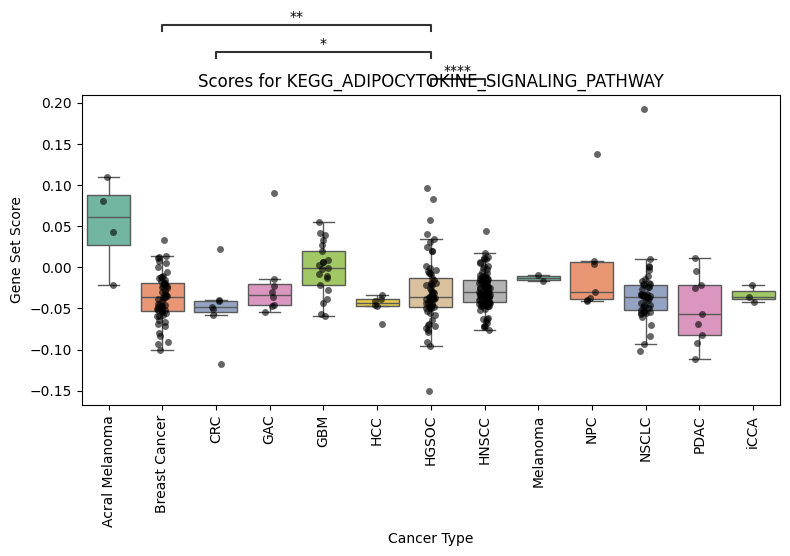

In [36]:
#KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY plot

# Loop through each gene set

plt.figure(figsize=(8, 6))

# Filter the data for the current gene set
gene_set_data = long_scores_df[long_scores_df["Gene Set"] == f"KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY_score"]

# Define the pairs and p-values for Tukey HSD comparisons involving HGSOC
pairs = []
p_values = []

# Loop through the Tukey HSD results and create pairs and p-values for significant comparisons
for _, row in hgsoc_filtered.iterrows():
    if row["reject"]:  # Only include significant comparisons
        # Ensure pairs are ordered so that HGSOC is always the first in the tuple
        if row["group1"] == "HGSOC":
            pairs.append((row["group1"], row["group2"]))
            p_values.append(row["p-adj"])
        else:
            pairs.append((row["group2"], row["group1"]))
            p_values.append(row["p-adj"])

# Create the box plot
ax = sns.boxplot(
    data=gene_set_data, 
    x="cancer_type_broad", 
    y="Score", 
    palette="Set2", 
    showfliers=False
)

# Overlay individual samples as dots
sns.stripplot(
    data=gene_set_data, 
    x="cancer_type_broad", 
    y="Score", 
    color="black", 
    alpha=0.6, 
    size=5, 
    jitter=True
)

# Annotate the plot with significant comparisons
annotator = Annotator(ax, pairs, data=gene_set_data, 
                        x="cancer_type_broad", y="Score")
annotator.configure(
    test=None,  # We already have the p-values
    text_format="star",
    loc="outside",
    verbose=0
)

# Set p-values to match the pairs
annotator.set_pvalues(p_values)
annotator.annotate()

# Customize the plot
plt.title(f"Scores for KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY")
plt.xlabel("Cancer Type")
plt.ylabel("Gene Set Score")
plt.xticks(rotation=90)
plt.tight_layout()

# Show the plot
plt.show()

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



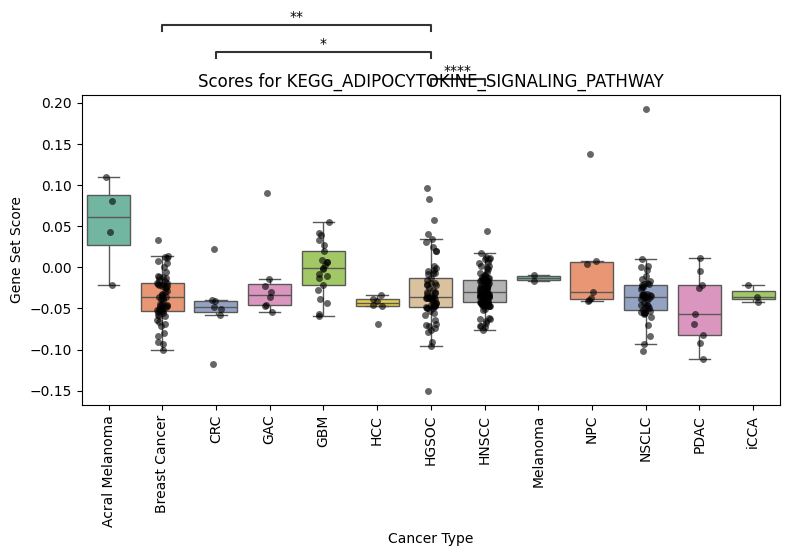

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



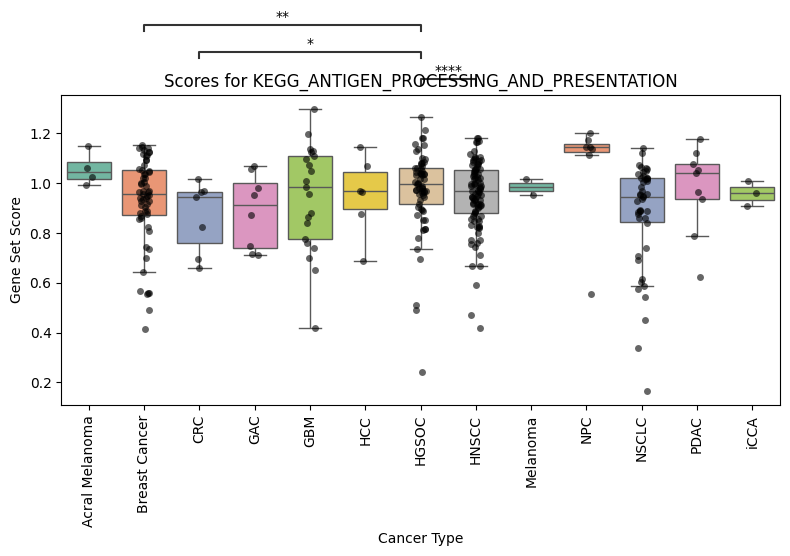

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



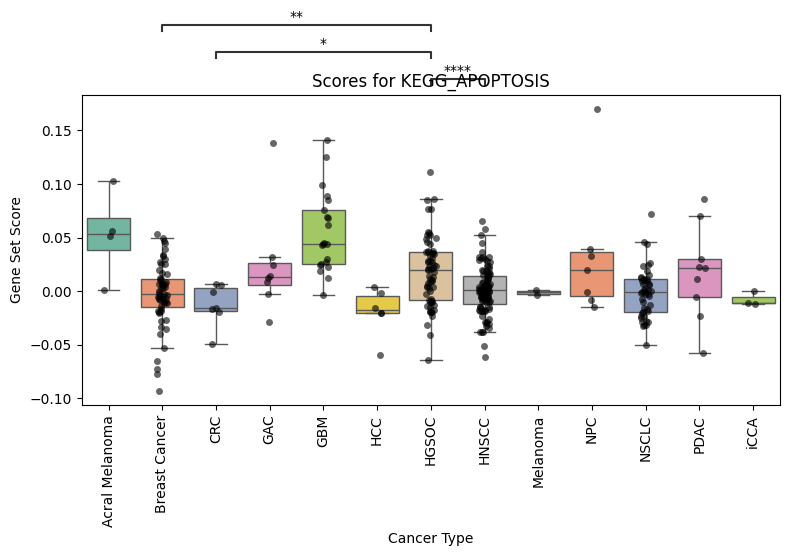

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



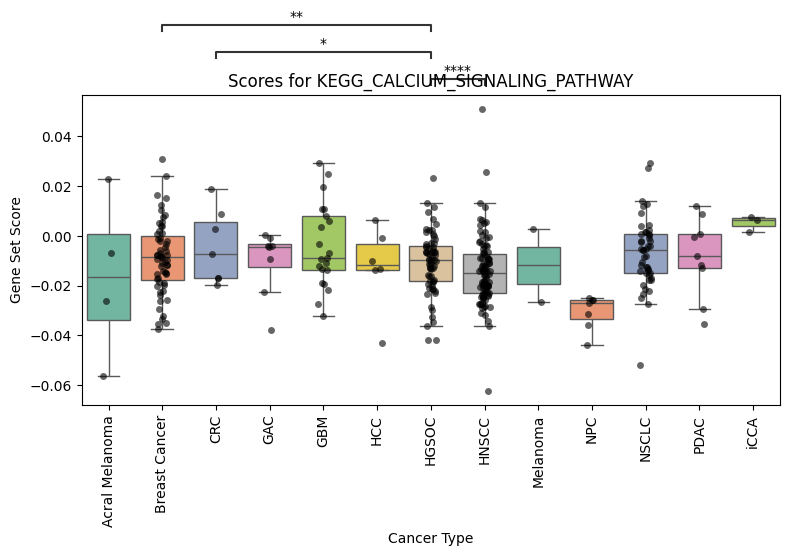

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



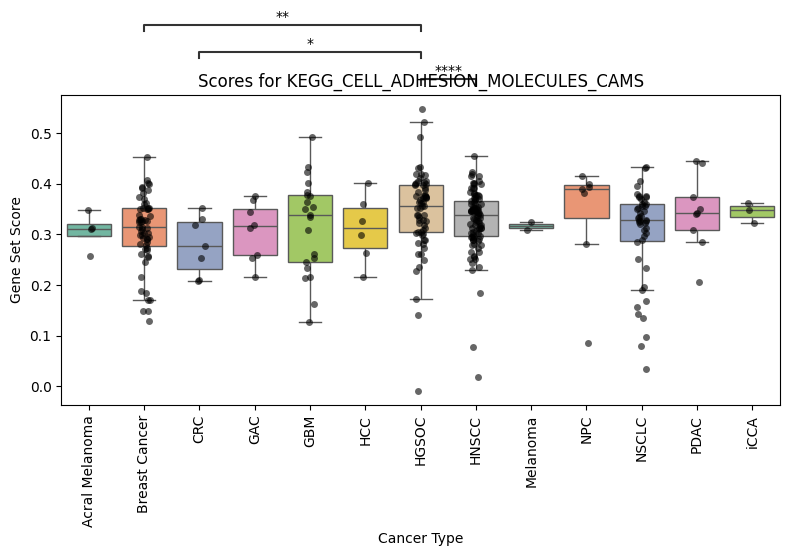

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



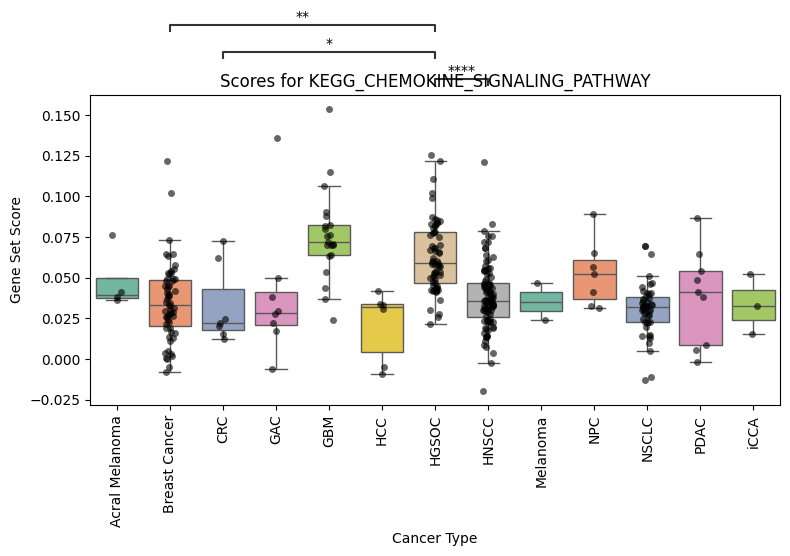

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



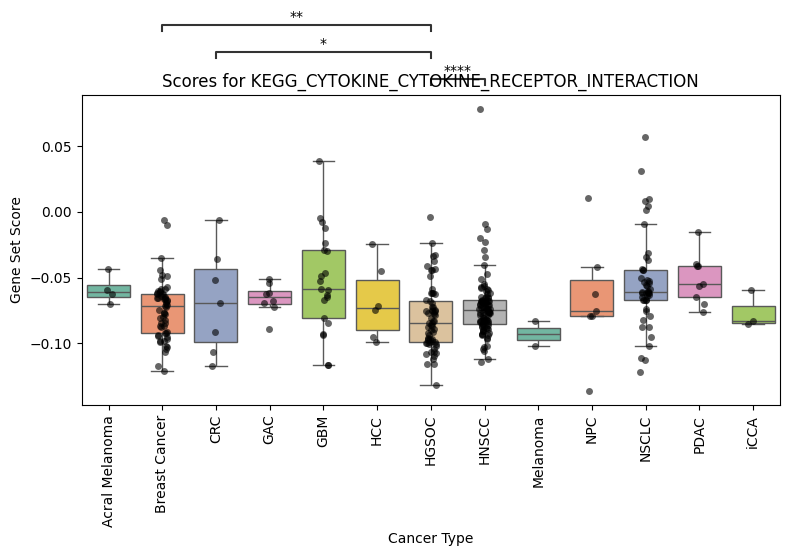

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



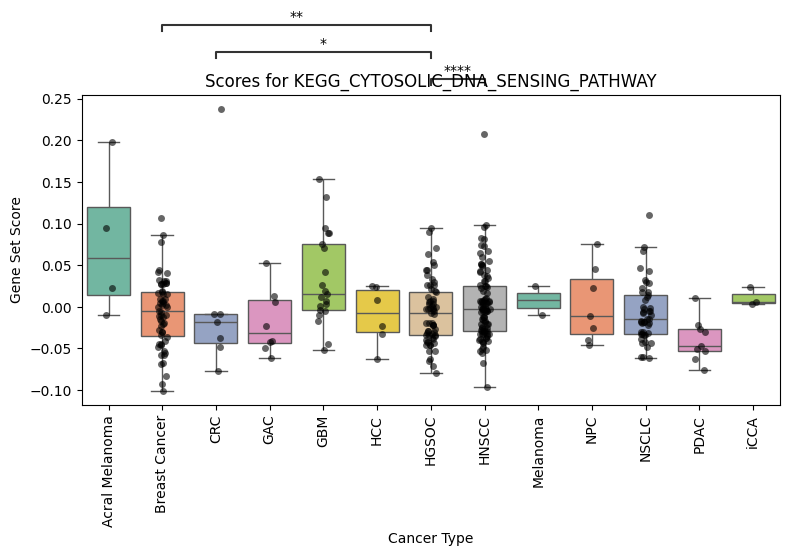

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



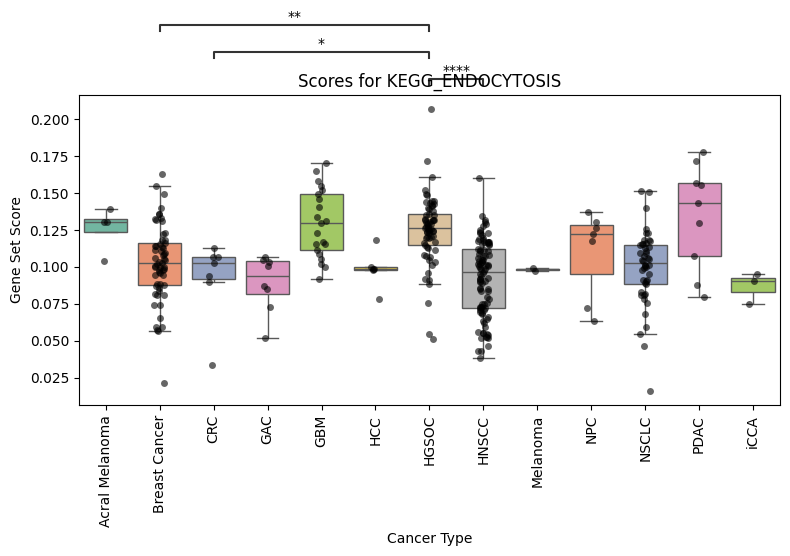

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



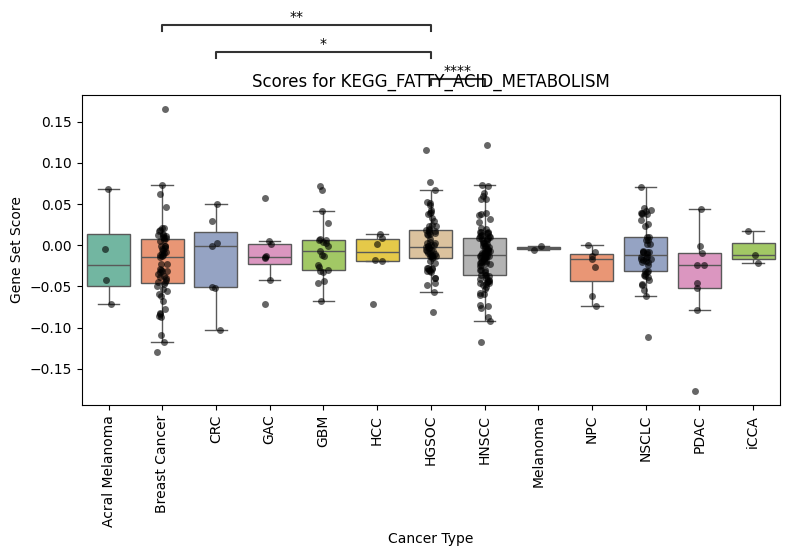

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



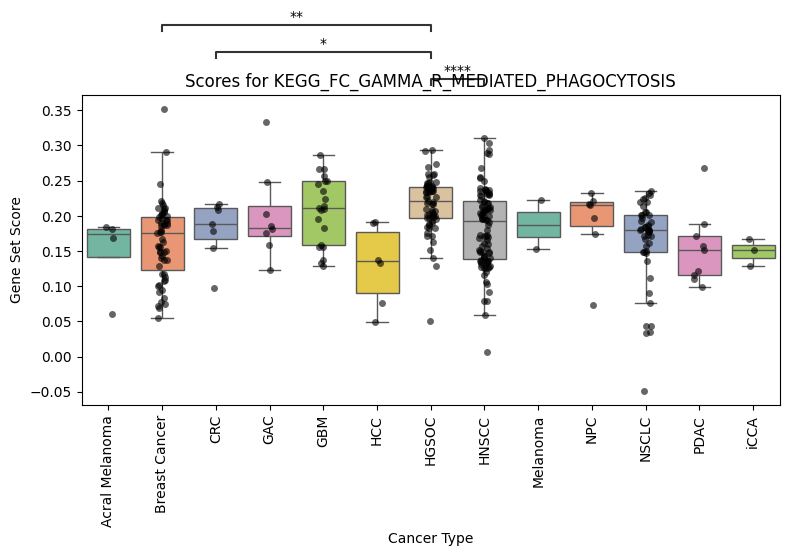

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



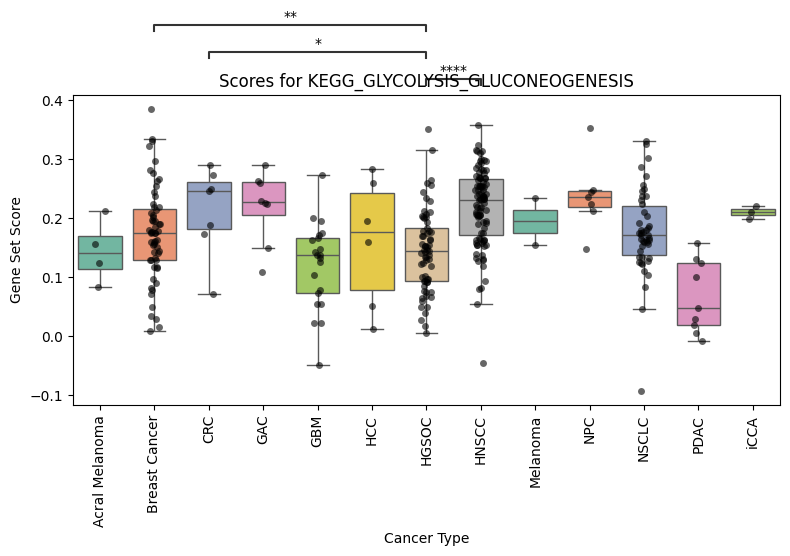

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



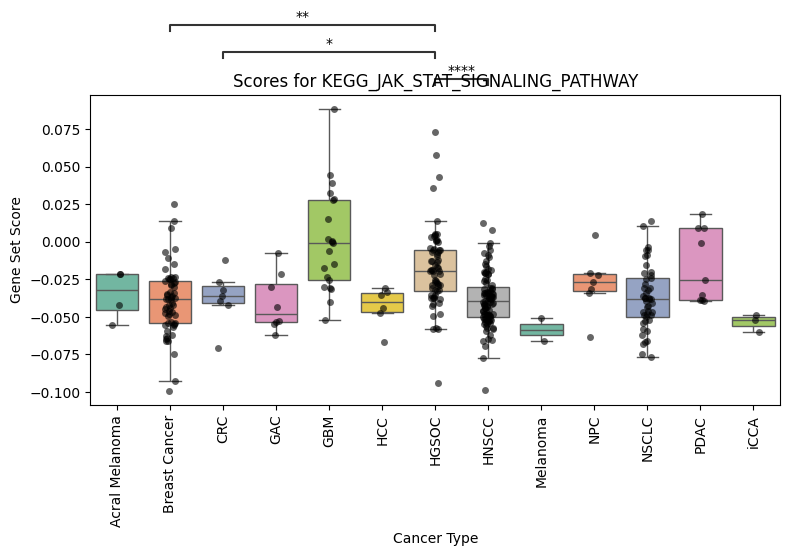

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



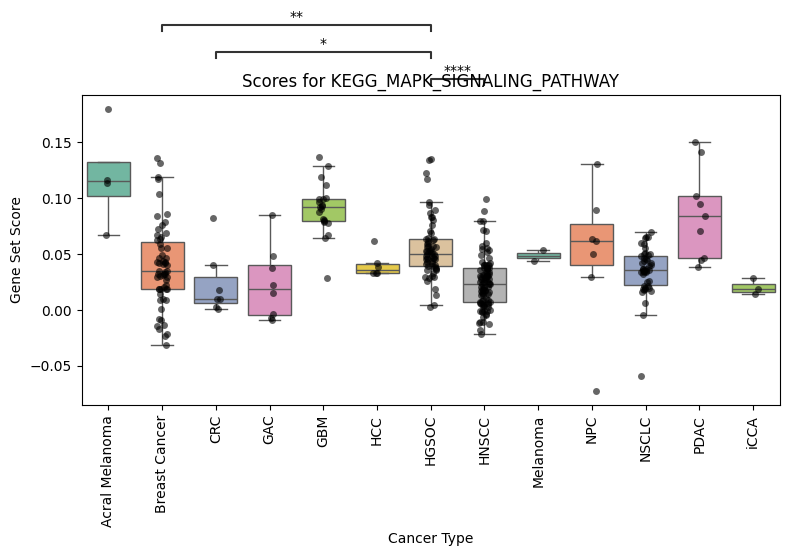

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



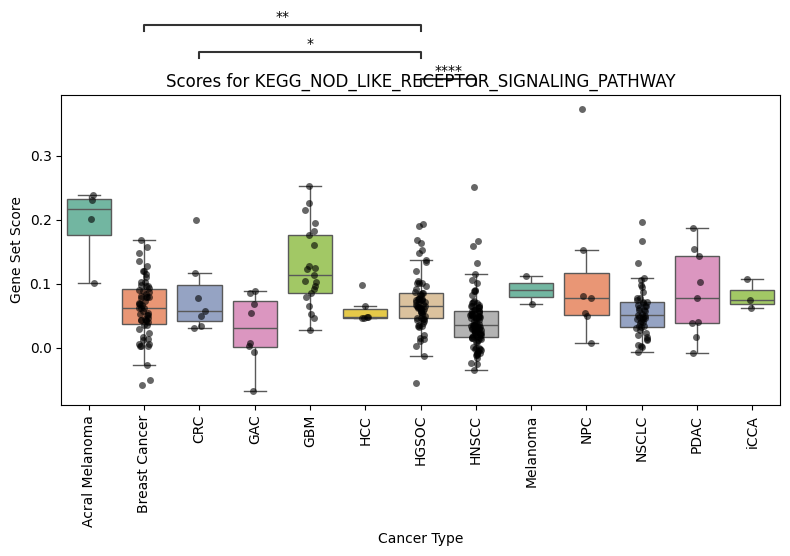

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



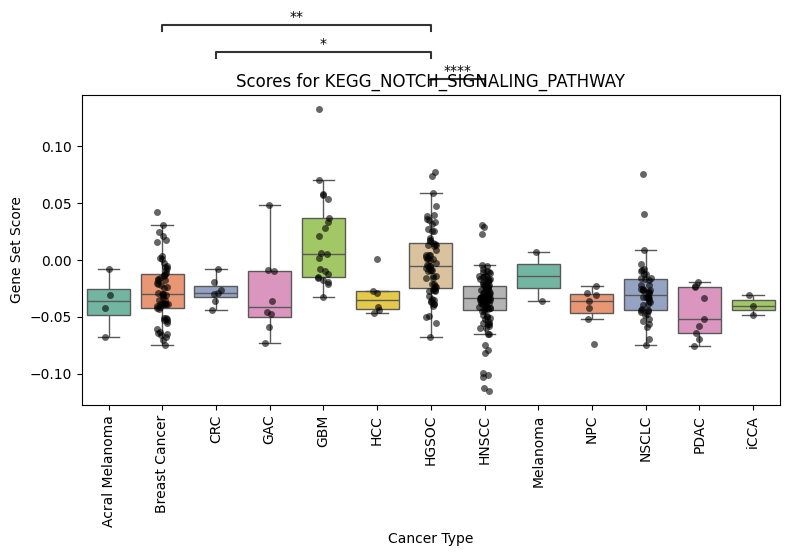

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



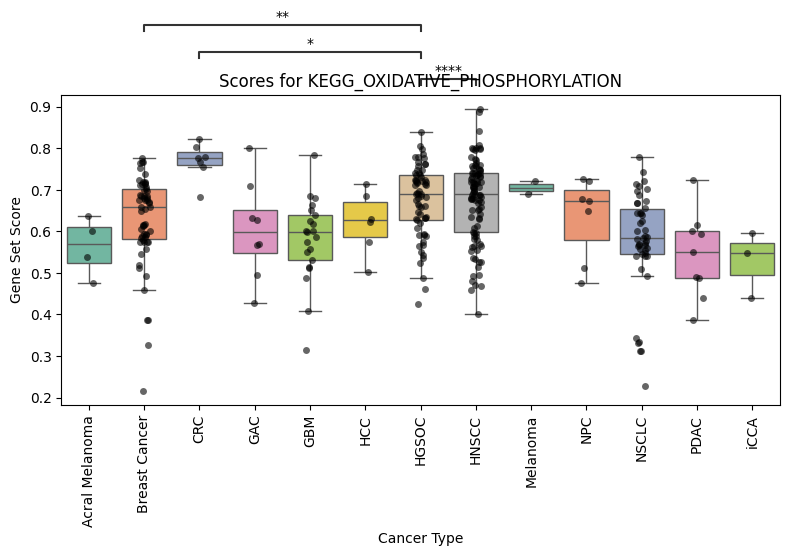

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



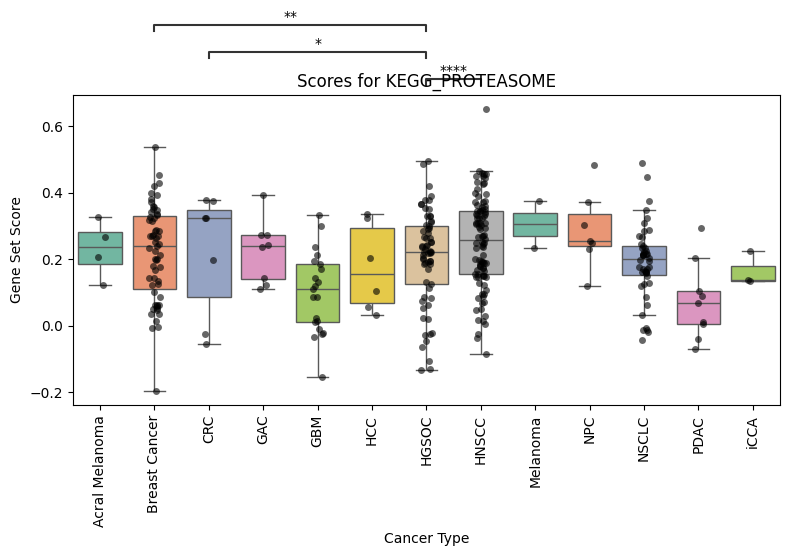

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



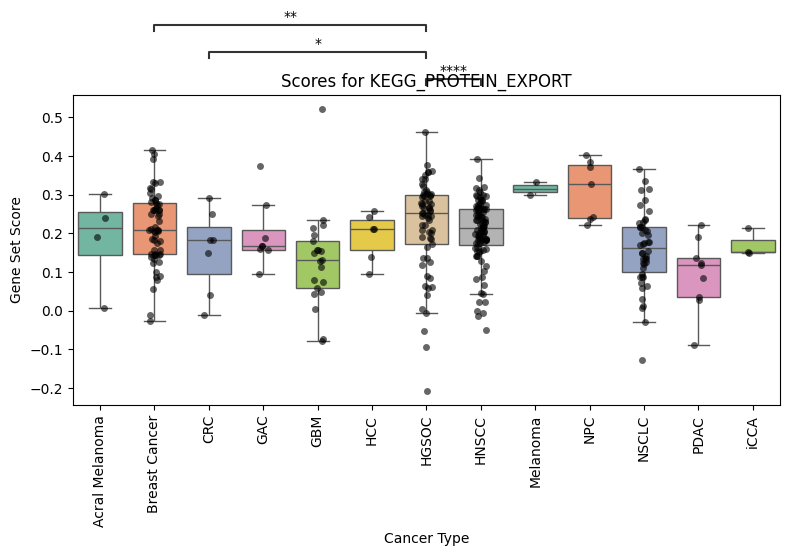

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



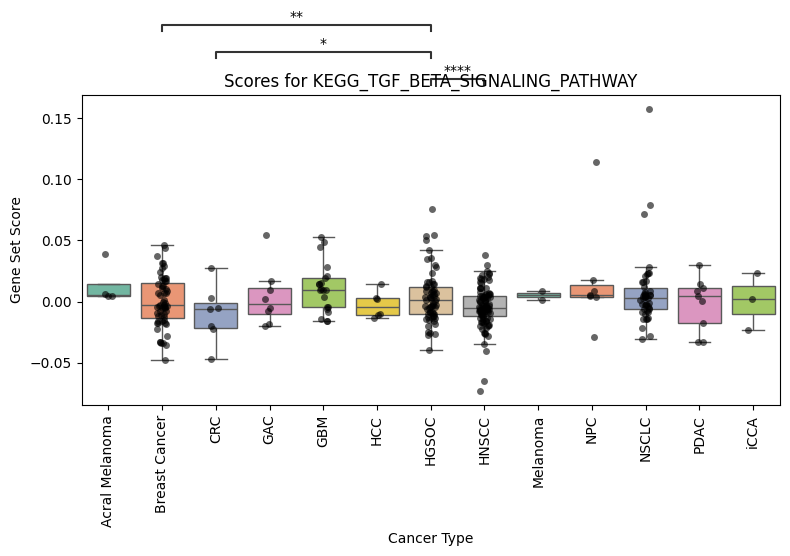

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



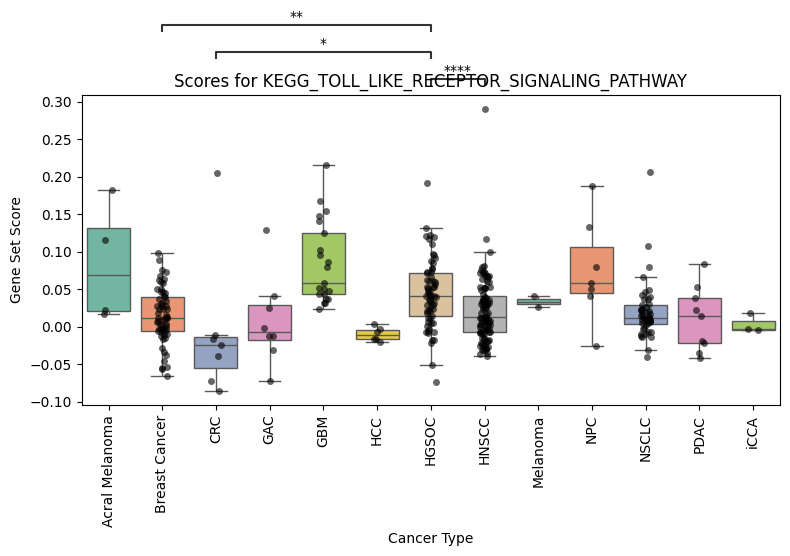

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



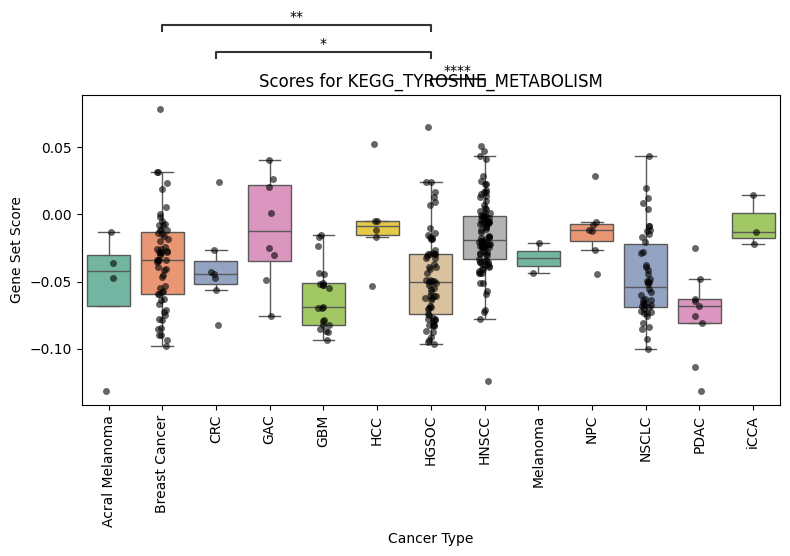

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



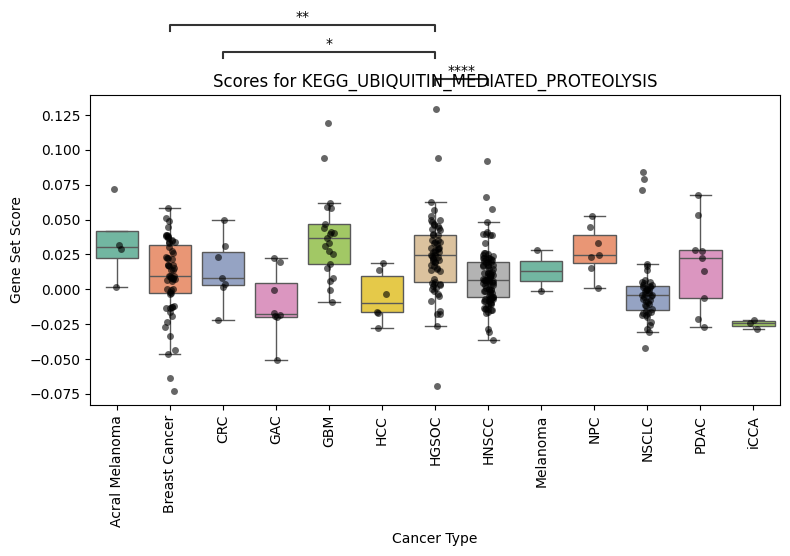

/scratch/temp/11876696/ipykernel_3977895/2213170681.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



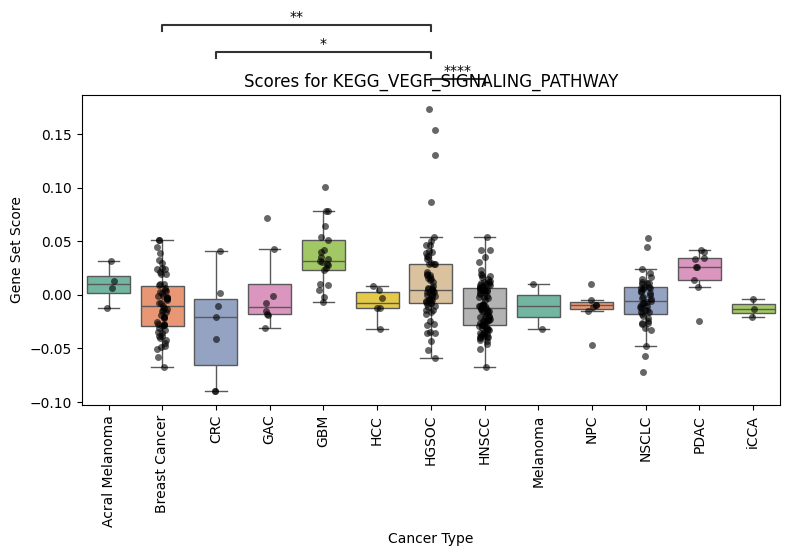

In [32]:
# Loop through each gene set
for gene_set in K_sets_sub.keys():
    plt.figure(figsize=(8, 6))

    # Filter the data for the current gene set
    gene_set_data = long_scores_df[long_scores_df["Gene Set"] == f"{gene_set}_score"]

    # Define the pairs and p-values for Tukey HSD comparisons involving HGSOC
    pairs = []
    p_values = []

    # Loop through the Tukey HSD results and create pairs and p-values for significant comparisons
    for _, row in hgsoc_filtered.iterrows():
        if row["reject"]:  # Only include significant comparisons
            # Ensure pairs are ordered so that HGSOC is always the first in the tuple
            if row["group1"] == "HGSOC":
                pairs.append((row["group1"], row["group2"]))
                p_values.append(row["p-adj"])
            else:
                pairs.append((row["group2"], row["group1"]))
                p_values.append(row["p-adj"])

    # Create the box plot
    ax = sns.boxplot(
        data=gene_set_data, 
        x="cancer_type_broad", 
        y="Score", 
        palette="Set2", 
        showfliers=False
    )

    # Overlay individual samples as dots
    sns.stripplot(
        data=gene_set_data, 
        x="cancer_type_broad", 
        y="Score", 
        color="black", 
        alpha=0.6, 
        size=5, 
        jitter=True
    )

    # Annotate the plot with significant comparisons
    annotator = Annotator(ax, pairs, data=gene_set_data, 
                          x="cancer_type_broad", y="Score")
    annotator.configure(
        test=None,  # We already have the p-values
        text_format="star",
        loc="outside",
        verbose=0
    )
    
    # Set p-values to match the pairs
    annotator.set_pvalues(p_values)
    annotator.annotate()

    # Customize the plot
    plt.title(f"Scores for {gene_set}")
    plt.xlabel("Cancer Type")
    plt.ylabel("Gene Set Score")
    plt.xticks(rotation=90)
    plt.tight_layout()

    # Show the plot
    plt.show()

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



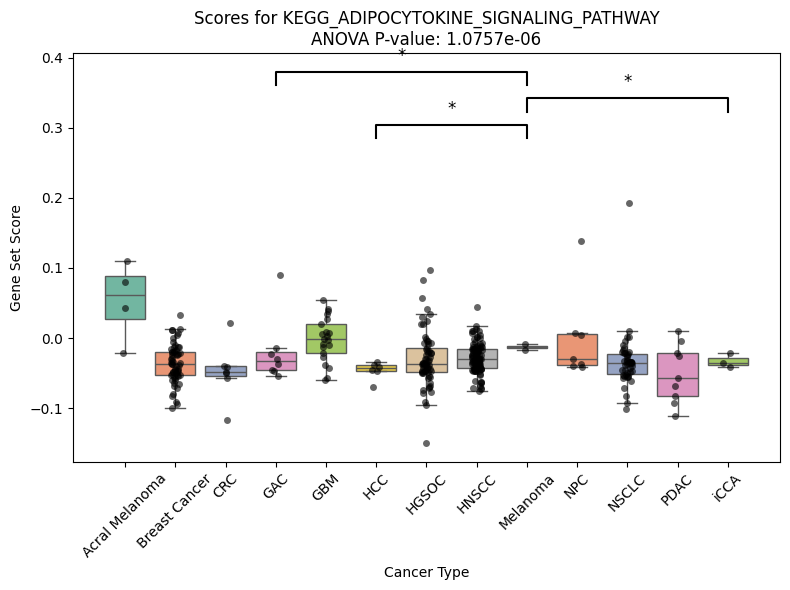

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



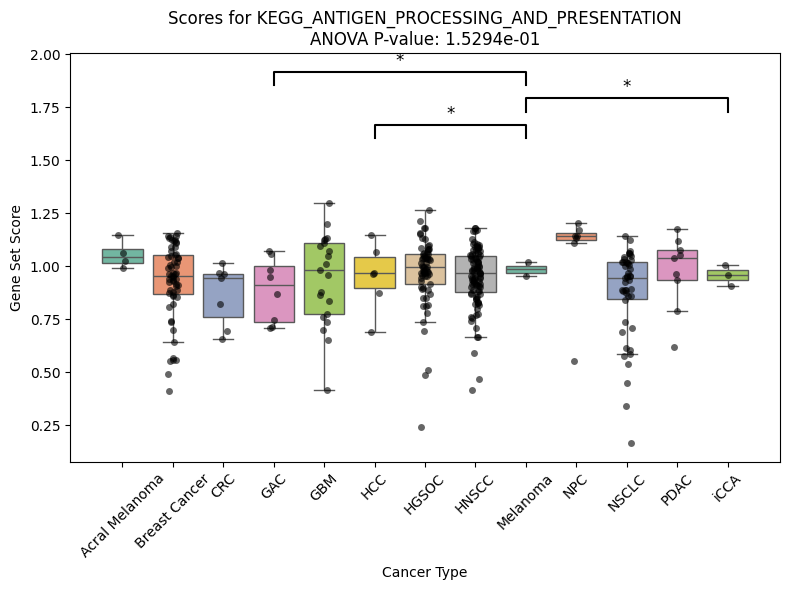

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



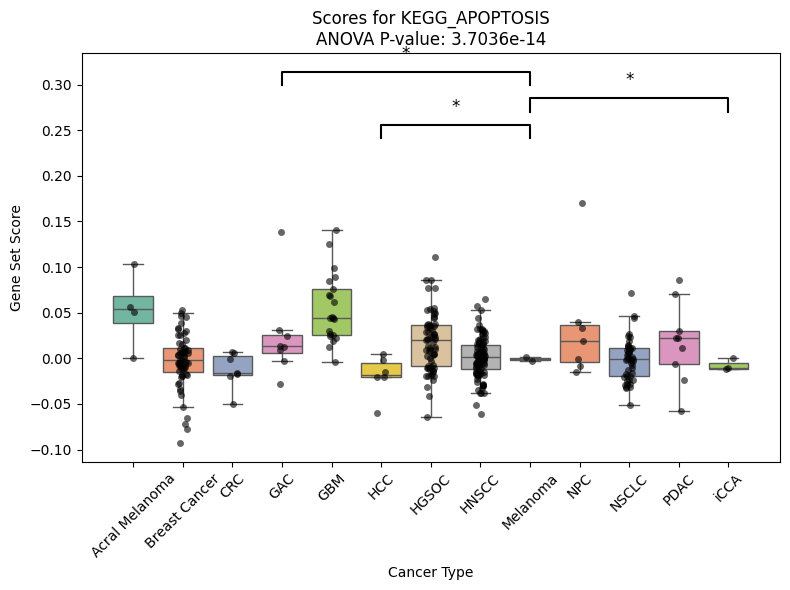

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



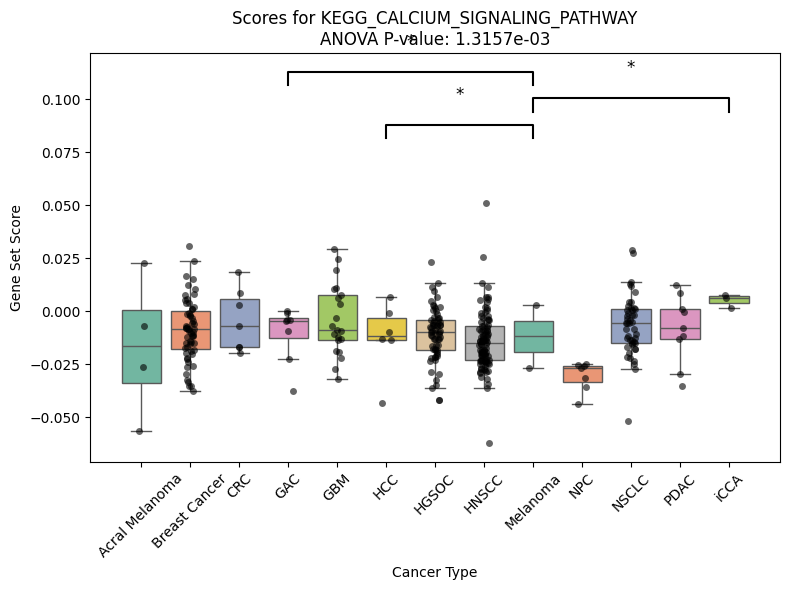

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



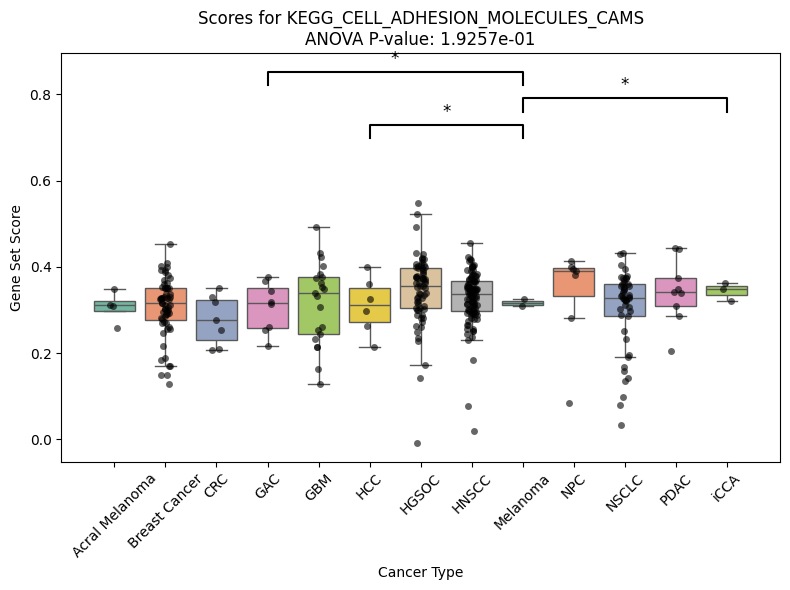

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



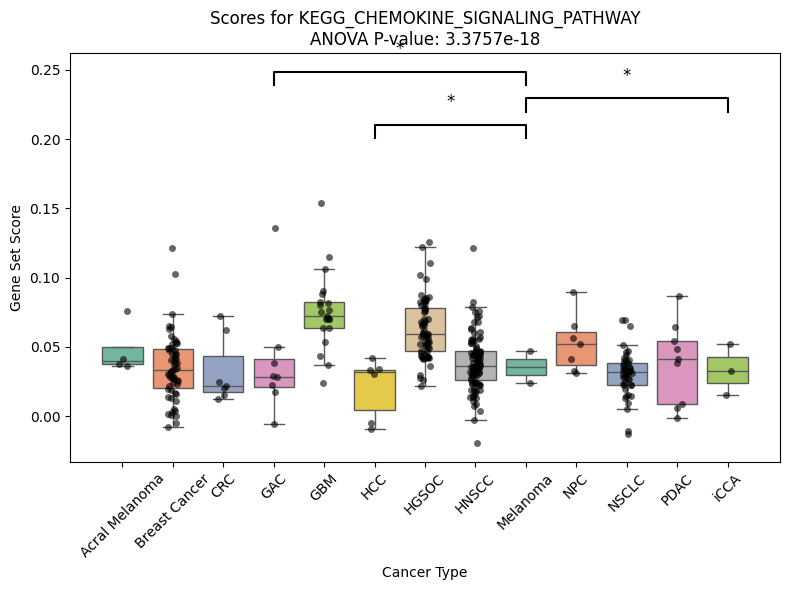

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



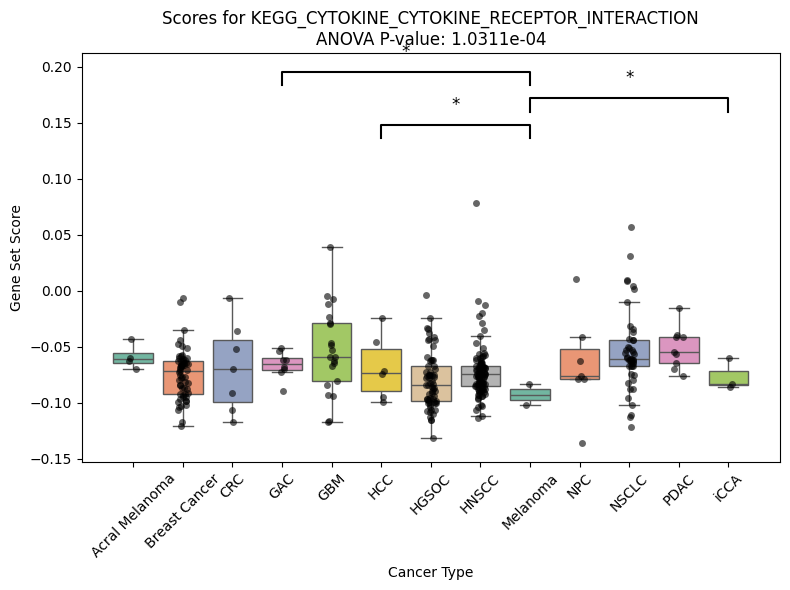

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



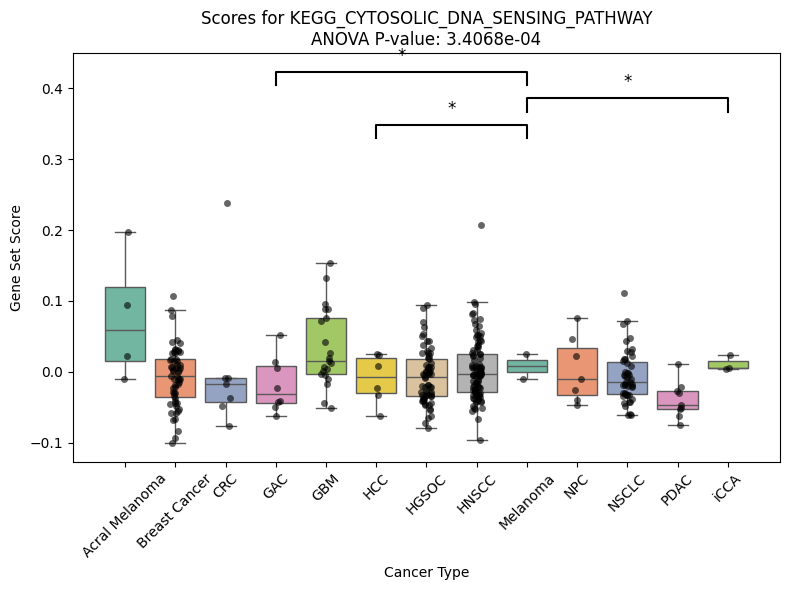

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



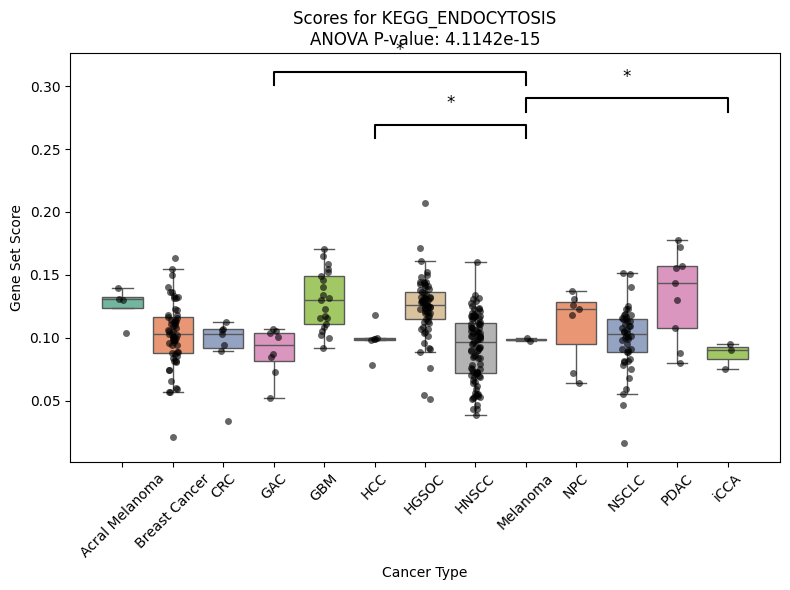

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



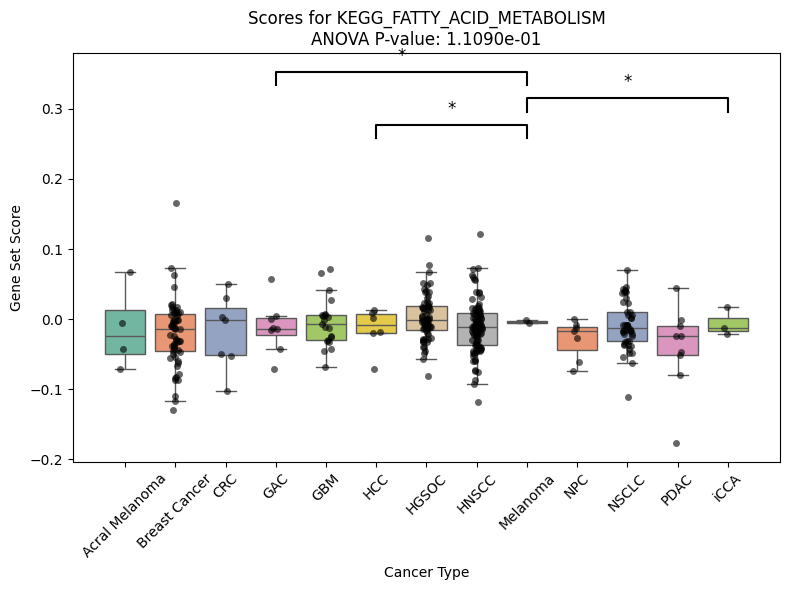

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



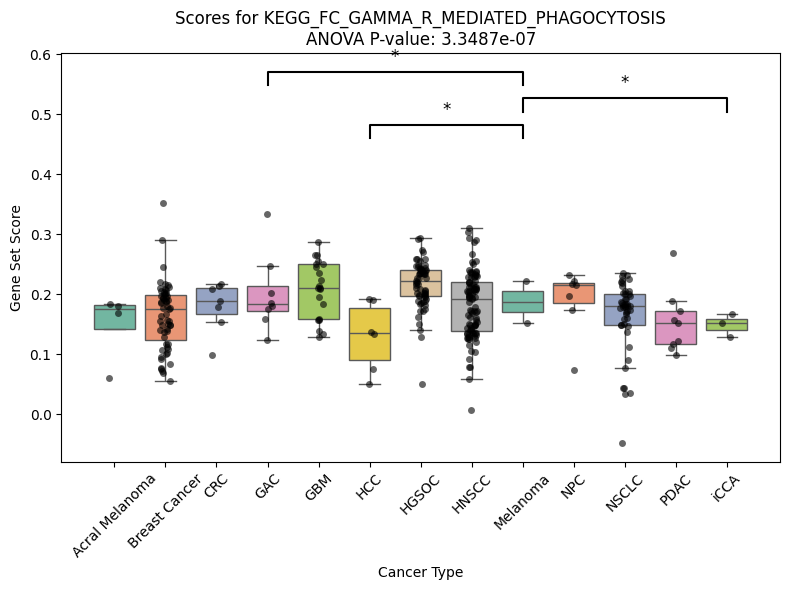

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



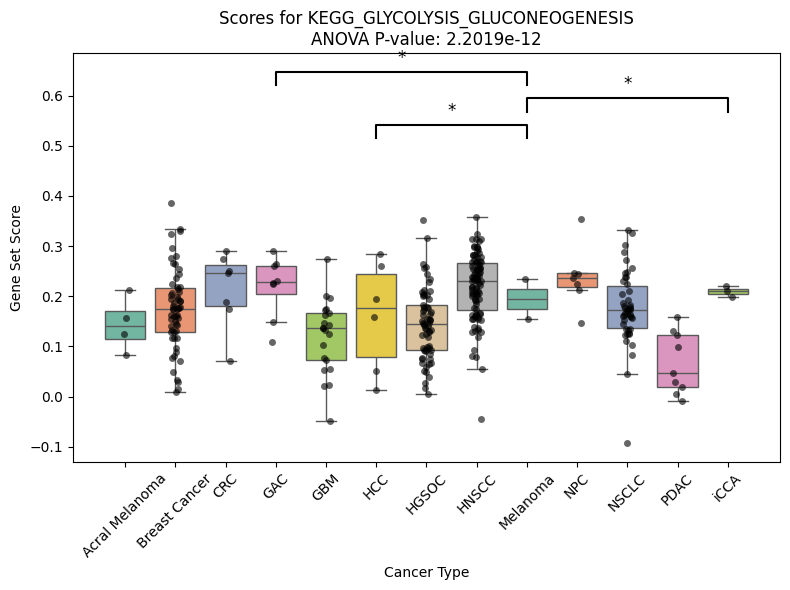

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



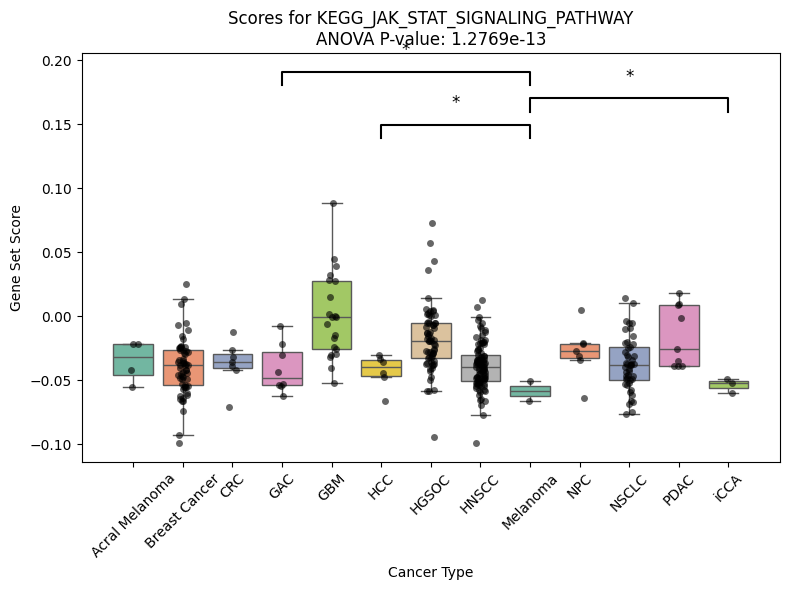

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



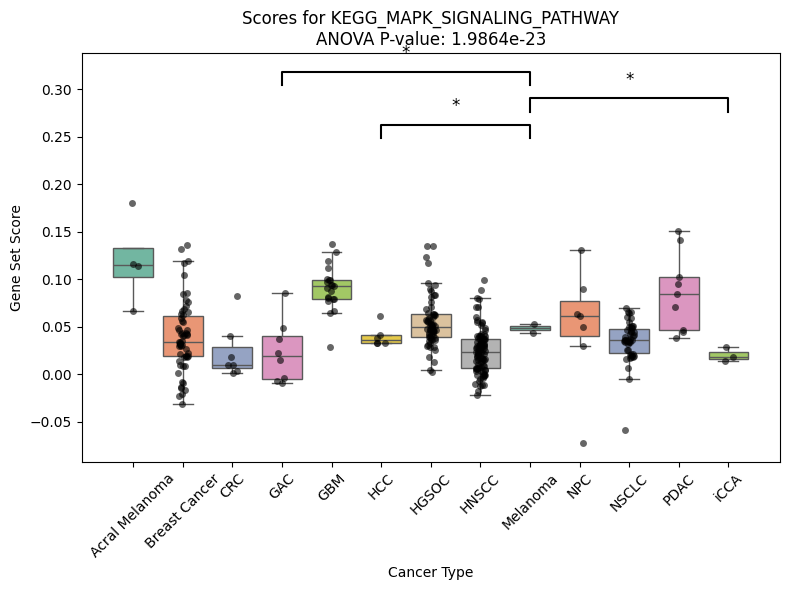

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



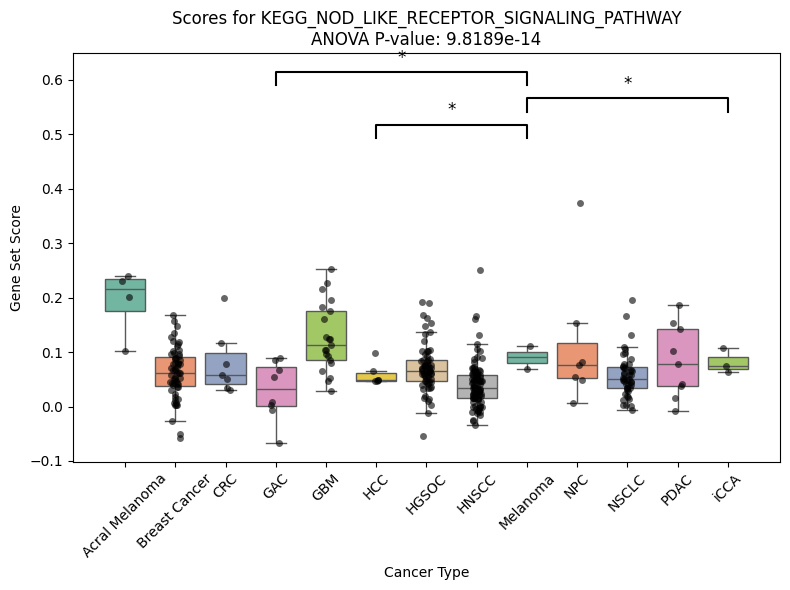

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



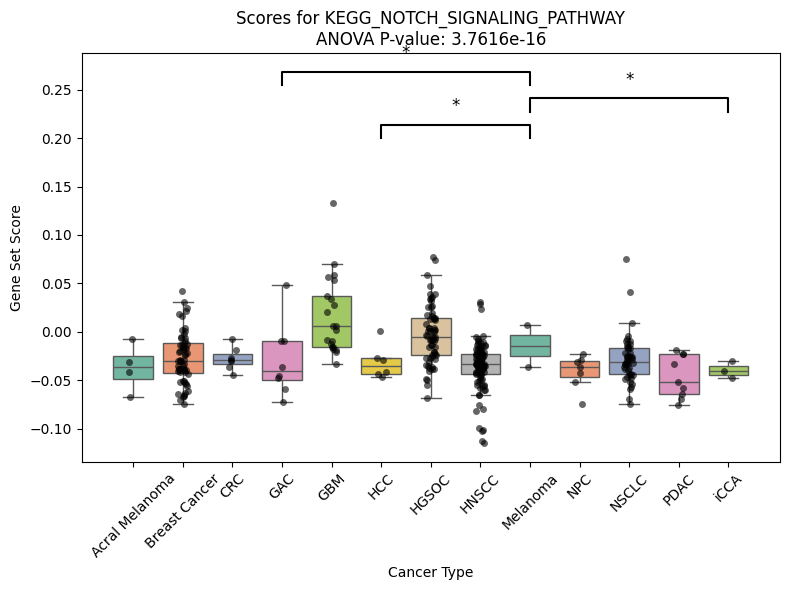

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



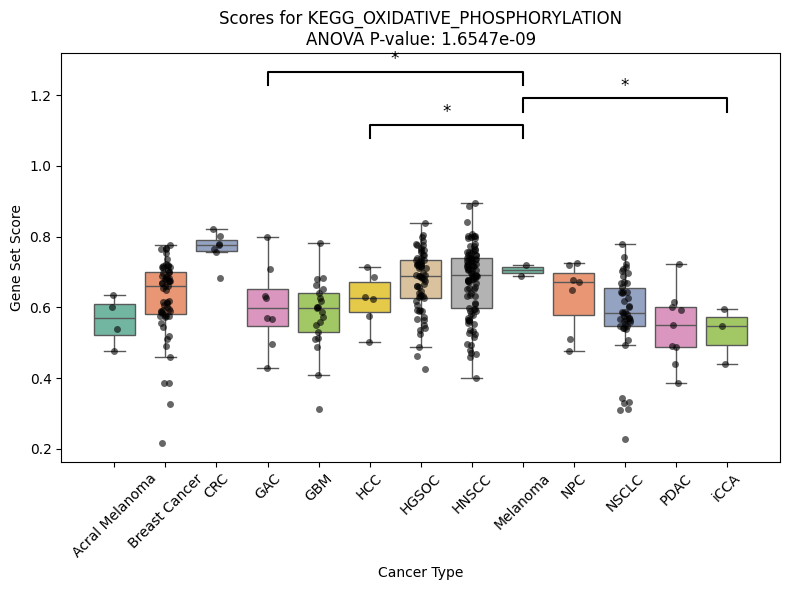

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



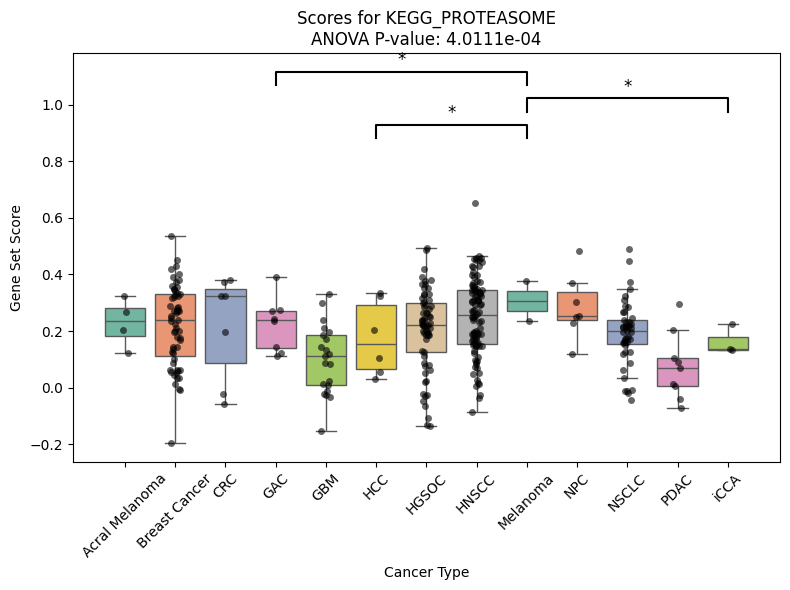

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



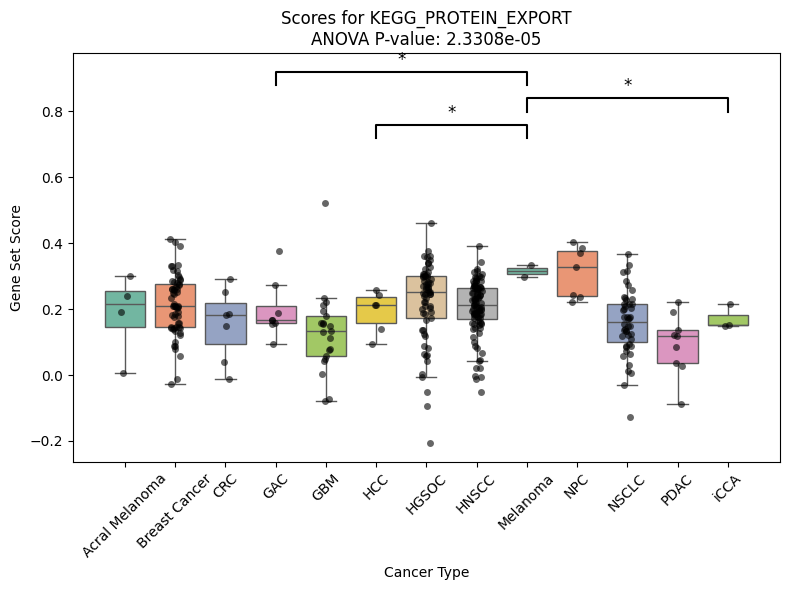

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



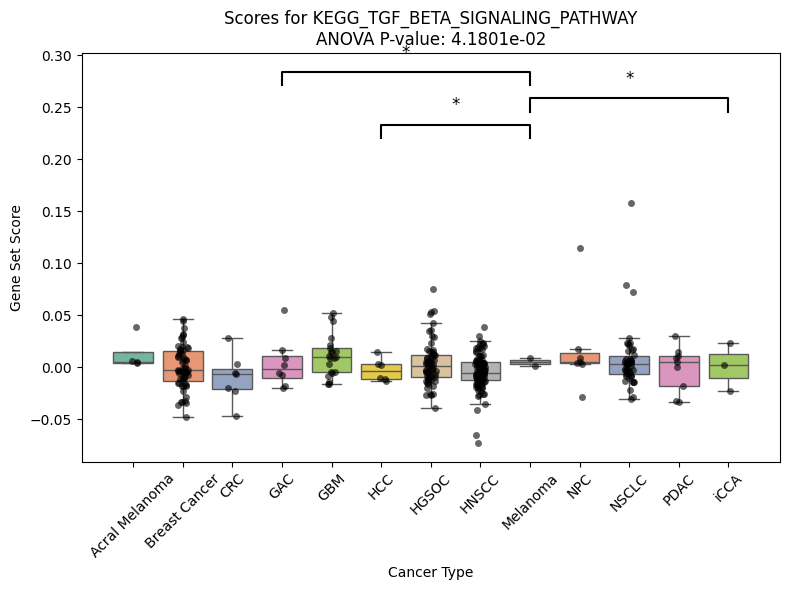

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



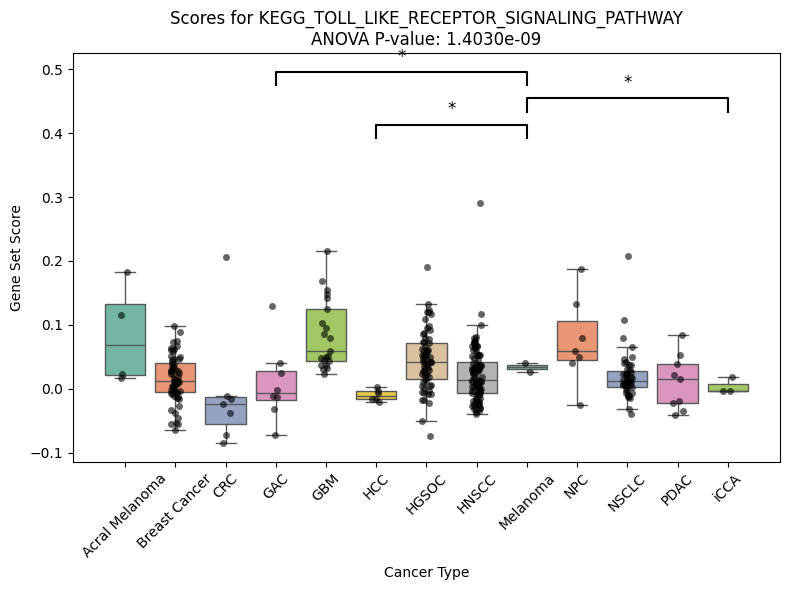

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



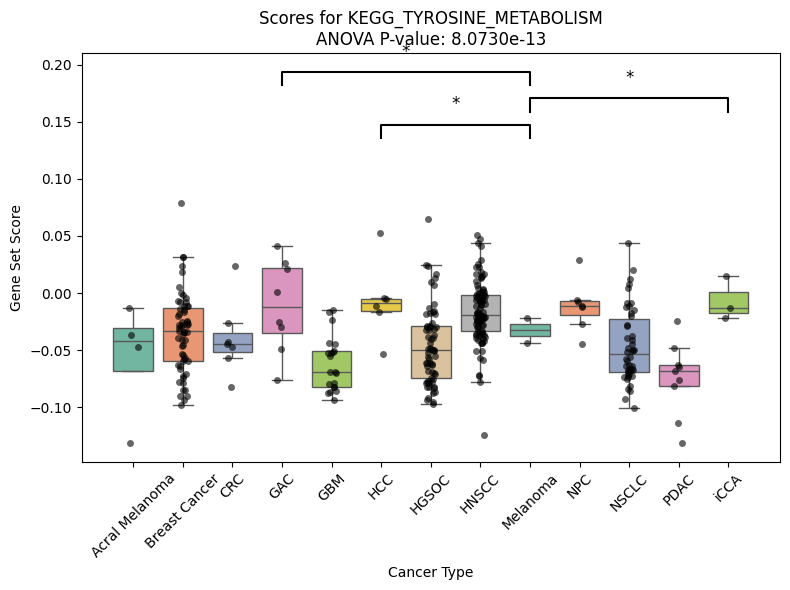

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



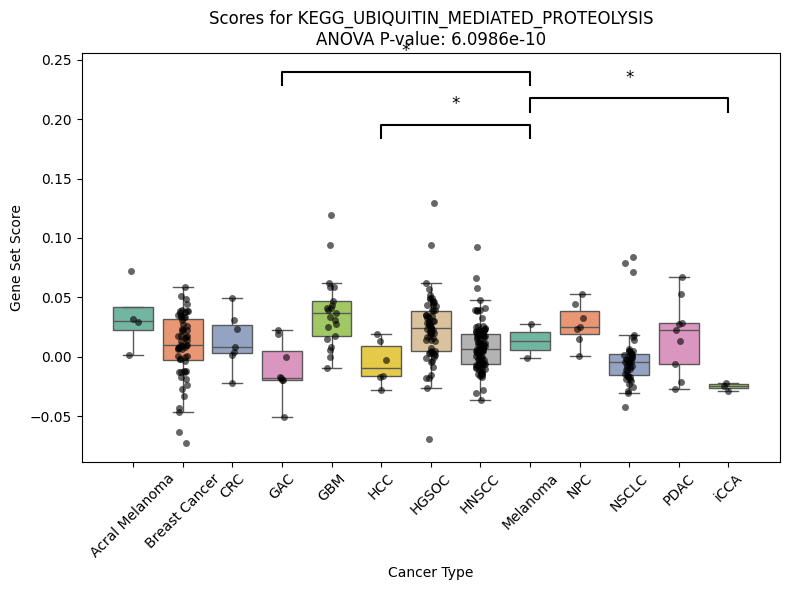

/scratch/temp/11876696/ipykernel_3977895/2336323570.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



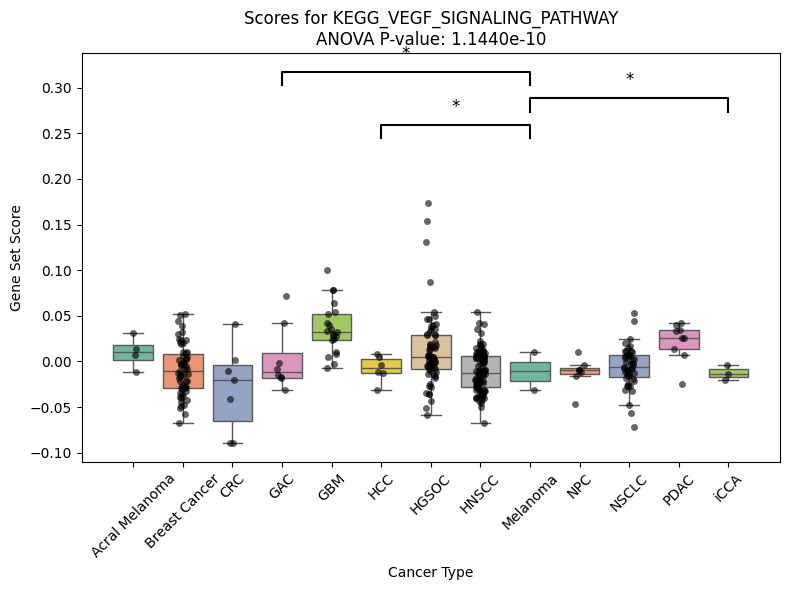

In [26]:
# Create a dataframe where each row corresponds to a sample with its scores and metadata
long_scores_df = sample_scores_df.reset_index().melt(
    id_vars=["integration_id", "cancer_type_broad"], 
    var_name="Gene Set", 
    value_name="Score"
)

# Loop through each gene set and create a separate figure
for gene_set in K_sets_sub.keys():
    plt.figure(figsize=(8, 6))

    # Filter the data for the current gene set
    gene_set_data = long_scores_df[long_scores_df["Gene Set"] == f"{gene_set}_score"]

    # Retrieve the precomputed ANOVA p-value for this gene set
    anova_p_value = anova_results_df.loc[
        anova_results_df["Gene Set"] == gene_set, "ANOVA P-value"
    ].values[0]

    # Retrieve precomputed Tukey HSD results involving HGSOC
    gene_set_hgsoc_filtered = hgsoc_filtered[hgsoc_filtered["group1"].str.contains("HGSOC") | 
                                             hgsoc_filtered["group2"].str.contains("HGSOC")]

    # Create the box plot
    sns.boxplot(
        data=gene_set_data, 
        x="cancer_type_broad", 
        y="Score", 
        palette="Set2", 
        showfliers=False
    )

    # Overlay individual samples as dots
    sns.stripplot(
        data=gene_set_data, 
        x="cancer_type_broad", 
        y="Score", 
        color="black", 
        alpha=0.6, 
        size=5, 
        jitter=True
    )

    # Annotate ANOVA p-value on the plot
    plt.title(f"Scores for {gene_set}\nANOVA P-value: {anova_p_value:.4e}")
    plt.xlabel("Cancer Type")
    plt.ylabel("Gene Set Score")
    plt.xticks(rotation=45)

    # Add significant comparisons as lines with stars
    ylim = plt.gca().get_ylim()
    y_start = ylim[1] + 0.2 * (ylim[1] - ylim[0])  # Start above the plot
    increment = 0.05 * (ylim[1] - ylim[0])  # Vertical spacing between lines

    for i, row in gene_set_hgsoc_filtered.iterrows():
        if row["reject"]:  # Only annotate significant comparisons
            # Get x positions for the groups
            group1, group2 = row["group1"], row["group2"]
            x1 = gene_set_data["cancer_type_broad"].unique().tolist().index(group1)
            x2 = gene_set_data["cancer_type_broad"].unique().tolist().index(group2)

            # Draw the line
            plt.plot([x1, x1, x2, x2], [y_start, y_start + increment, y_start + increment, y_start], 
                     color="black", lw=1.5)
            
            # Add a star for significance
            plt.text((x1 + x2) / 2, y_start + increment + 0.01, "*", 
                     ha="center", va="bottom", fontsize=12)

            # Increment the starting y position for the next annotation
            y_start += increment * 2

    plt.tight_layout()

    # Show the figure
    plt.show()

# KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY

In [44]:
print(K_sets_sub.keys())

dict_keys(['KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY', 'KEGG_ANTIGEN_PROCESSING_AND_PRESENTATION', 'KEGG_APOPTOSIS', 'KEGG_CALCIUM_SIGNALING_PATHWAY', 'KEGG_CELL_ADHESION_MOLECULES_CAMS', 'KEGG_CHEMOKINE_SIGNALING_PATHWAY', 'KEGG_CYTOKINE_CYTOKINE_RECEPTOR_INTERACTION', 'KEGG_CYTOSOLIC_DNA_SENSING_PATHWAY', 'KEGG_ENDOCYTOSIS', 'KEGG_FATTY_ACID_METABOLISM', 'KEGG_FC_GAMMA_R_MEDIATED_PHAGOCYTOSIS', 'KEGG_GLYCOLYSIS_GLUCONEOGENESIS', 'KEGG_JAK_STAT_SIGNALING_PATHWAY', 'KEGG_MAPK_SIGNALING_PATHWAY', 'KEGG_NOD_LIKE_RECEPTOR_SIGNALING_PATHWAY', 'KEGG_NOTCH_SIGNALING_PATHWAY', 'KEGG_OXIDATIVE_PHOSPHORYLATION', 'KEGG_PROTEASOME', 'KEGG_PROTEIN_EXPORT', 'KEGG_TGF_BETA_SIGNALING_PATHWAY', 'KEGG_TOLL_LIKE_RECEPTOR_SIGNALING_PATHWAY', 'KEGG_TYROSINE_METABOLISM', 'KEGG_UBIQUITIN_MEDIATED_PROTEOLYSIS', 'KEGG_VEGF_SIGNALING_PATHWAY'])


In [42]:
adipocytokine_df = K_sets_sub["KEGG_ADIPOCYTOKINE_SIGNALING_PATHWAY"]
adipocytokine_genes = adipocytokine_df["human_gene_symbol"]
adipocytokine_list = adipocytokine_genes.tolist()

In [45]:
#score DC for gene set:
sc.tl.score_genes(data_DC1, gene_list=adipocytokine_list, score_name=f"adipocytokine_score")
sc.tl.score_genes(data_DC2, gene_list=adipocytokine_list, score_name=f"adipocytokine_score")
sc.tl.score_genes(data_mregDC, gene_list=adipocytokine_list, score_name=f"adipocytokine_score")

       'PRKAG3'],
      dtype='object')
       'PRKAG3'],
      dtype='object')
       'PRKAG3'],
      dtype='object')


/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_score_genes.py:176: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


In [46]:
# Extract the score
score_column = "adipocytokine_score"

# Group by 'integration_id' and calculate the mean score for each group
sample_scores_df = data_DC1.obs.groupby("integration_id")[score_column].mean().reset_index()

# Merge with 'cancer_type_broad' by matching the 'integration_id'
sample_scores_df = sample_scores_df.merge(
    data_DC1.obs[["integration_id", "cancer_type_broad"]].drop_duplicates(),
    on="integration_id",
    how="left"
)

# The resulting 'sample_scores_df' will contain 'integration_id', 'adipocytokine_score', and 'cancer_type_broad'
print(sample_scores_df.head())

         integration_id  adipocytokine_score cancer_type_broad
0     GGSE223063_GLIO_1            -0.001042               GBM
1     GGSE223063_GLIO_3            -0.021054               GBM
2    GSE112271_HCC_Pt13            -0.069371               HCC
3    GSE112271_HCC_Pt14            -0.047408               HCC
4  GSE131907_LUAD_T0006            -0.055981             NSCLC


/scratch/temp/11876696/ipykernel_3977895/4242711165.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


In [68]:
from scipy import stats
from scipy.stats import normaltest

In [72]:
sample_scores_df["adipocytokine_score"]

0     -0.001042
1     -0.021054
2     -0.069371
3     -0.047408
4     -0.055981
         ...   
328   -0.018893
329   -0.042821
330    0.040898
331   -0.047532
332   -0.078823
Name: adipocytokine_score, Length: 333, dtype: float64

In [70]:
x = stats.norm.rvs(size = 100)

In [74]:
print("Adipocytokine: ", normaltest(sample_scores_df["adipocytokine_score"]).pvalue)

Adipocytokine:  5.943422902767891e-28


In [65]:
print(normaltest(sample_scores_df).pvalue)

NameError: name 'normaltest' is not defined

In [59]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statannotations.Annotator import Annotator

In [48]:
#perform ANOVA
model = ols("adipocytokine_score ~ C(cancer_type_broad)", data=sample_scores_df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

# Print the ANOVA results
print(anova_table)

                        sum_sq     df         F    PR(>F)
C(cancer_type_broad)  0.061486   12.0  4.498047  0.000001
Residual              0.364517  320.0       NaN       NaN


In [50]:
# Perform Tukey HSD post-hoc test
posthoc = pairwise_tukeyhsd(
    endog=sample_scores_df["adipocytokine_score"],  # Dependent variable
    groups=sample_scores_df["cancer_type_broad"],  # Independent variable
    alpha=0.05
)

# Extract and filter comparisons with HGSOC
posthoc_summary = posthoc.summary()
posthoc_df = pd.DataFrame(posthoc_summary.data[1:], columns=posthoc_summary.data[0])

# Filter comparisons involving HGSOC
hgsoc_comparisons = posthoc_df[
    (posthoc_df["group1"] == "HGSOC") | (posthoc_df["group2"] == "HGSOC")
]

# Print the filtered comparisons
print(hgsoc_comparisons)

            group1    group2  meandiff   p-adj   lower   upper  reject
5   Acral Melanoma     HGSOC   -0.0824  0.0002 -0.1404 -0.0243    True
16   Breast Cancer     HGSOC    0.0069  0.9958 -0.0134  0.0271   False
26             CRC     HGSOC    0.0182  0.9795 -0.0266  0.0630   False
35             GAC     HGSOC   -0.0094  0.9999 -0.0516  0.0328   False
43             GBM     HGSOC   -0.0274  0.0674 -0.0557  0.0009   False
50             HCC     HGSOC    0.0166  0.9949 -0.0314  0.0647   False
57           HGSOC     HNSCC    0.0008  1.0000 -0.0173  0.0189   False
58           HGSOC  Melanoma    0.0165  1.0000 -0.0644  0.0974   False
59           HGSOC       NPC    0.0297  0.5820 -0.0151  0.0745   False
60           HGSOC     NSCLC   -0.0037  1.0000 -0.0254  0.0180   False
61           HGSOC      PDAC   -0.0208  0.8807 -0.0608  0.0193   False
62           HGSOC      iCCA   -0.0038  1.0000 -0.0703  0.0628   False


/scratch/temp/11876696/ipykernel_3977895/3300133732.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



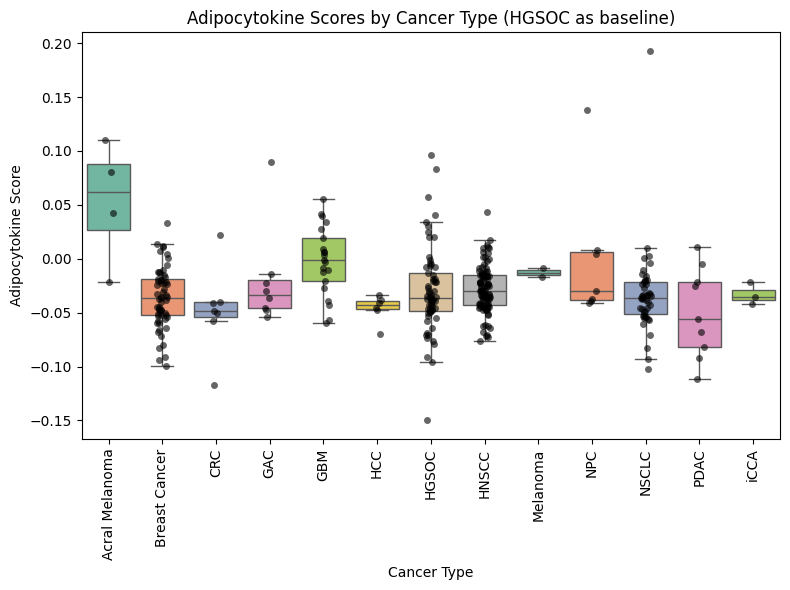

In [62]:
# Plot the boxplot for adipocytokine_score by cancer_type_broad
plt.figure(figsize=(8, 6))
ax = sns.boxplot(
    data=sample_scores_df, 
    x="cancer_type_broad", 
    y="adipocytokine_score", 
    palette="Set2", 
    showfliers=False
)

# Overlay individual data points (dots) on top of the box plot
sns.stripplot(
    data=sample_scores_df, 
    x="cancer_type_broad", 
    y="adipocytokine_score", 
    color="black", 
    alpha=0.6, 
    size=5, 
    jitter=True
)

# Customize the plot
plt.title("Adipocytokine Scores by Cancer Type (HGSOC as baseline)")
plt.xlabel("Cancer Type")
plt.ylabel("Adipocytokine Score")
plt.xticks(rotation=90)
plt.tight_layout()

# Show the plot
plt.show()